# Load packages and functions

In [1]:
import pandas as pd
import numpy as np
import os
from collections import defaultdict
import seaborn as sns
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
import palettable
import plotly_express as px
from plotnine import *
from sklearn.metrics import mutual_info_score, accuracy_score, roc_curve, auc, f1_score, roc_auc_score, average_precision_score
import sklearn.metrics as sk
import scanpy as sc
import anndata as ad
from typing import Any, Callable, Optional, Union
from plottable import ColumnDefinition, Table
from plottable.cmap import normed_cmap
from plottable.plots import bar
from pysankey2.datasets import load_fruits
from pysankey2.utils import setColorConf
from pysankey2 import Sankey
from sklearn.metrics.pairwise import cosine_similarity
from scipy.spatial.distance import cdist
from scipy import stats
from rogi import RoughnessIndex
from scipy.stats import pearsonr, spearmanr, kendalltau
import json
import itertools
plt.rcParams['font.family'] = 'sans-serif'

In [3]:
# Ref: https://github.com/biomed-AI/GraphCS
def accuracy_for_unkonw(preds, output_ratio, labels, number_unkonw, cut_off_ratio=0):
    total_konw_cells=len(labels)-number_unkonw
    index = np.where(np.array(output_ratio) > cut_off_ratio)[0]

    labels = labels[index]
    preds = preds[index]

    correct=sum(preds==labels)

    # print("correct, total_konw_cells: ", correct, total_konw_cells)
    return correct / total_konw_cells


def get_FPR(unknown_cell, FPR=0.05):
    number_unkonw = len(unknown_cell)
    cut_off_ratio = sorted(unknown_cell, reverse=True)[int(number_unkonw*FPR)]

    # print("cut_off_ratio value: ", cut_off_ratio)
    return cut_off_ratio, number_unkonw

In [4]:
# Ref: https://github.com/wetliu/energy_ood/blob/master/utils/display_results.py
def stable_cumsum(arr, rtol=1e-05, atol=1e-08):
    """Use high precision for cumsum and check that final value matches sum
    Parameters
    ----------
    arr : array-like
        To be cumulatively summed as flat
    rtol : float
        Relative tolerance, see ``np.allclose``
    atol : float
        Absolute tolerance, see ``np.allclose``
    """
    out = np.cumsum(arr, dtype=np.float64)
    expected = np.sum(arr, dtype=np.float64)
    if not np.allclose(out[-1], expected, rtol=rtol, atol=atol):
        raise RuntimeError('cumsum was found to be unstable: '
                           'its last element does not correspond to sum')
    return out

def fpr_and_fdr_at_recall(y_true, y_score, recall_level=0.95, pos_label=None):
    classes = np.unique(y_true)
    if (pos_label is None and
            not (np.array_equal(classes, [0, 1]) or
                 np.array_equal(classes, [-1, 1]) or
                 np.array_equal(classes, [0]) or
                 np.array_equal(classes, [-1]) or
                 np.array_equal(classes, [1]))):
        raise ValueError("Data is not binary and pos_label is not specified")
    elif pos_label is None:
        pos_label = 1.

    # make y_true a boolean vector
    y_true = (y_true == pos_label)

    # sort scores and corresponding truth values
    desc_score_indices = np.argsort(y_score, kind="mergesort")[::-1]
    y_score = y_score[desc_score_indices]
    y_true = y_true[desc_score_indices]

    # y_score typically has many tied values. Here we extract
    # the indices associated with the distinct values. We also
    # concatenate a value for the end of the curve.
    distinct_value_indices = np.where(np.diff(y_score))[0]
    threshold_idxs = np.r_[distinct_value_indices, y_true.size - 1]

    # accumulate the true positives with decreasing threshold
    tps = stable_cumsum(y_true)[threshold_idxs]
    fps = 1 + threshold_idxs - tps      # add one because of zero-based indexing

    thresholds = y_score[threshold_idxs]

    recall = tps / tps[-1]

    last_ind = tps.searchsorted(tps[-1])
    sl = slice(last_ind, None, -1)      # [last_ind::-1]
    recall, fps, tps, thresholds = np.r_[recall[sl], 1], np.r_[fps[sl], 0], np.r_[tps[sl], 0], thresholds[sl]

    cutoff = np.argmin(np.abs(recall - recall_level))

    return fps[cutoff] / (np.sum(np.logical_not(y_true)))   # fps[cutoff]/(fps[cutoff] + tps[cutoff])


def get_measures(y_true, y_pred, recall_level=0.95):
    auroc = sk.roc_auc_score(y_true, y_pred)
    aupr = sk.average_precision_score(y_true, y_pred)
    fpr = fpr_and_fdr_at_recall(y_true, y_pred, recall_level)

    return auroc, aupr, fpr

In [5]:
# def dominates(x, y):
#     """
#     检查解x是否支配解y
#     """
#     if (x >= y).all() and not (x == y).all():
#         return True
#     else:
#         return False

def dominates(p_metrics, q_metrics, epsilon=0.001):
    """
    Return True if p dominates q, considering that being worse by ≤ epsilon is acceptable.
    """
    better_in_at_least_one = False
    for p_val, q_val in zip(p_metrics, q_metrics):
        if p_val > q_val:  # p 比 q 好
            better_in_at_least_one = True
        elif q_val - p_val > epsilon:  
            # p 比 q 差，而且差距超过 epsilon，不可接受
            return False
    return better_in_at_least_one
        
def non_dominated_sort(population):
    # model_name: metrics
    fronts = [[]]  # 记录非支配前沿
    # S = []  # 支配的个体列表 
    # n_dominated = np.zeros(len(population))  # 每个个体被支配的个体数量
    S = defaultdict(list)
    n_dominated = defaultdict(int)
    
    for p in population.keys():
        # S.append([])  # 初始化支配个体的列表
        for q in population.keys():
            if dominates(population[p], population[q]):
                S[p].append(q)
            elif dominates(population[q], population[p]):
                n_dominated[p] += 1

        if n_dominated[p] == 0:
            fronts[0].append(p)  # p 是第一前沿的一部分

    i = 0
    while fronts[i]:
        Q = []  # 下一前沿
        for p in fronts[i]:
            for q in S[p]:
                n_dominated[q] -= 1
                if n_dominated[q] == 0:
                    Q.append(q)  # q 是下一前沿的一部分
        i += 1
        fronts.append(Q)  # 记录下一前沿

    return fronts[:-1]  # 返回前沿（去掉空列表）

In [6]:
_METRIC_TYPE = "Metric Type"
_AGGREGATE_SCORE = "Aggregate score"
def plot_results_table(
    df, min_max_scale: bool = True, show: bool = True, ouput_file: Optional[str] = None, sort_col="Overall"
) -> Table:
    """Plot the benchmarking results.

    Parameters
    ----------
    min_max_scale
        Whether to min max scale the results.
    show
        Whether to show the plot.
    ouput_file
        The directory to save the plot to. If `None`, the plot is not saved.
    """
    # num_embeds = len(self._embedding_obsm_keys)
    num_embeds = len(df.columns)-1
    cmap_fn = lambda col_data: normed_cmap(col_data, cmap=matplotlib.cm.PRGn, num_stds=2.5)
    # df = self.get_results(min_max_scale=min_max_scale)
    # Do not want to plot what kind of metric it is
    plot_df = df.drop(_METRIC_TYPE, axis=0)
    # Sort by total score
    plot_df = plot_df.sort_values(by=sort_col, ascending=False).astype(np.float64)
    plot_df["Method"] = plot_df.index

    # Split columns by metric type, using df as it doesn't have the new method col
    score_cols = df.columns[df.loc[_METRIC_TYPE] == _AGGREGATE_SCORE]
    other_cols = df.columns[df.loc[_METRIC_TYPE] != _AGGREGATE_SCORE]
    column_definitions = [
        ColumnDefinition("Method", width=1.5, textprops={"ha": "left", "weight": "bold"}),
    ]
    # Circles for the metric values
    column_definitions += [
        ColumnDefinition(
            col,
            title=col.replace(" ", "\n", 1),
            width=1,
            textprops={
                "ha": "center",
                "bbox": {"boxstyle": "circle", "pad": 0.25},
            },
            cmap=cmap_fn(plot_df[col]),
            group=df.loc[_METRIC_TYPE, col],
            formatter="{:.2f}",
        )
        for i, col in enumerate(other_cols)
    ]
    # Bars for the aggregate scores
    column_definitions += [
        ColumnDefinition(
            col,
            width=1,
            title=col.replace(" ", "\n", 1),
            plot_fn=bar,
            plot_kw={
                "cmap": matplotlib.cm.YlGnBu,
                "plot_bg_bar": False,
                "annotate": True,
                "height": 0.9,
                "formatter": "{:.3f}",
                "alpha": 0.6, 
            },
            group=df.loc[_METRIC_TYPE, col],
            border="left" if i == 0 else None,
        )
        for i, col in enumerate(score_cols)
    ]
    # Allow to manipulate text post-hoc (in illustrator)
    with matplotlib.rc_context({"svg.fonttype": "none"}):
        fig, ax = plt.subplots(figsize=(len(df.columns) * 1.5, 3 + 0.6 * num_embeds), dpi=300)
        tab = Table(
            plot_df,
            cell_kw={
                "linewidth": 0,
                "edgecolor": "k",
            },
            column_definitions=column_definitions,
            ax=ax,
            row_dividers=True,
            footer_divider=True,
            textprops={"fontsize": 10, "ha": "center"},
            row_divider_kw={"linewidth": 1, "linestyle": (0, (1, 5))},
            col_label_divider_kw={"linewidth": 1, "linestyle": "-"},
            column_border_kw={"linewidth": 1, "linestyle": "-"},
            index_col="Method",
        ).autoset_fontcolors(colnames=plot_df.columns)
    if show:
        plt.show()
    if ouput_file is not None:
        fig.savefig(ouput_file, facecolor=ax.get_facecolor(), dpi=300, bbox_inches='tight')

    return tab

# Define plotting parameters

In [7]:
model_map_dict = {"X_geneformer": "Geneformer",
                  "X_langcell": "LangCell",
                  "X_scgpt": "scGPT",
                  "X_uce": "UCE",
                  "X_xtrimogene": "scFoundation",
                  "X_hvg": "HVG",
                  "X_scvi": "scVI",
                  "X_sccello": "scCello",
                  "X_harmony": "Harmony",
                  "X_seurat_cca": "Seurat_v5(CCA)",
                  "xTrimoGene": "scFoundation",
                  "Seurat_cca": "Seurat_v5(CCA)",
                  "LR_OvR": "LR(OvR)",
                  "X": "Raw",
                  "scVI_integrated_tissue": "scVI",
                  "scVI_integrated_dataset": "scVI"}

model_order_baseline = ["scVI", "Harmony", "Seurat_v5(CCA)"]
model_order_scFM = ["Geneformer", "scGPT", "UCE", "scFoundation", "LangCell", "scCello"]
model_order_wo_hvg = model_order_baseline + model_order_scFM
model_order = ["HVG"] + model_order_wo_hvg
#F2D1C9
colors = ["#999999", "#D6D6D6", "#E6CECF", "#A8CFC1", "#E89DA0", "#88CEE6", "#F6C8A8", "#B696B6", "#9FBA95", "#F2E1A7"]
custom_palette = {model: color for model, color in zip(model_order, colors[:len(model_order)])}
custom_palette["Raw"] = custom_palette["HVG"]
custom_palette["LR(OvR)"] = custom_palette["HVG"]
# shapes = ["o", "s", "p", "*", "^", "P", "X"]
shapes = ["h", "v", "D", "H", "o", "s", "p", "*", "^", "d"]
custom_shape = {model: shape for model, shape in zip(model_order, shapes[:len(model_order)])}
custom_shape["Raw"] = custom_shape["HVG"]
custom_shape["LR(OvR)"] = custom_shape["HVG"]

In [8]:
dataset_map_dict = {"pancreas_scib": "Pancreas", 
                    "Immune_all_human": "Immune", 
                    "HLCA_core": "HLCA", 
                    "Tabula_Sapiens_all": "Tabula Sapiens",
                    "AIDA_v2_new": "AIDA v2"}
dataset_info_dict = {
    "pancreas_scib": {
        "layer_key": "counts",
        "batch_key": "batch",
    },
    "Immune_all_human": {
        "layer_key": "counts",
        "batch_key": "batch",
    },
    "HLCA_core": {
        "layer_key": "X",
        "batch_key": "dataset",
    },
    "Tabula_Sapiens_all": {
        "layer_key": "X",
        "batch_key": "tissue_in_publication",
    },
    "AIDA_v2_new": {
        "layer_key": "X",
        "batch_key": "donor_id",
    }
}

In [9]:
cluster_models = ["HVG", "scVI", "Harmony", "Seurat_cca", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]
cluster_datasets = ["pancreas_scib", "Immune_all_human", "HLCA_core", "Tabula_Sapiens_all", "AIDA_v2_new"]

In [10]:
annotation_models = ["LR_OvR", "scVI", "Harmony", "Seurat_cca", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]
# TODO: add seurat
transfer_annotation_models = ["scVI", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]
annotation_ensemble_models = ["Geneformer", "scGPT", "UCE", "LangCell", "xTrimoGene", "scCello"]

In [11]:
params_file = "../OnClass/results_gridsearch/model_to_params.json"
with open(params_file, "r") as f:
    model_to_params = json.load(f)

# Define path

In [12]:
data_folder = "/mnt/nvme/extra_data/wujialu/scFM-Bench/data"
output_folder = "/mnt/nvme/extra_data/wujialu/scFM-Bench/output"

# Clustering

## Pancreas_scib

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "pancreas_scib"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

In [ ]:
scib_metrics_dict = {"NMI_cluster/label": "NMI", 
                     "ARI_cluster/label": "ARI", 
                     "ASW_label": r"ASW$_{cell}$", 
                     "ASW_label/batch": r"ASW$_{batch}$",
                     "avg_bio": "AvgBio",
                     "avg_batch": "AvgBatch",
                     "overall": "Overall"}
df.rename(index=scib_metrics_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986
ARI,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809
ASW$_{cell}$,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445
ASW$_{batch}$,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643
AvgBio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314
AvgBatch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044
Overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006


In [ ]:
# avg_bio and avg_batch
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI', 'Harmony']
Front 2: ['Seurat_v5(CCA)']
Front 3: ['scCello']
Front 4: ['scGPT']
Front 5: ['UCE']
Front 6: ['scFoundation']
Front 7: ['LangCell']
Front 8: ['Geneformer']


In [ ]:
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello,Metric Type
NMI,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986,Bio conservation
ARI,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809,Bio conservation
ASW$_{cell}$,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148,Bio conservation
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445,Batch correction
ASW$_{batch}$,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643,Batch correction
AvgBio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314,Aggregate score
AvgBatch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044,Aggregate score
Overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006,Aggregate score


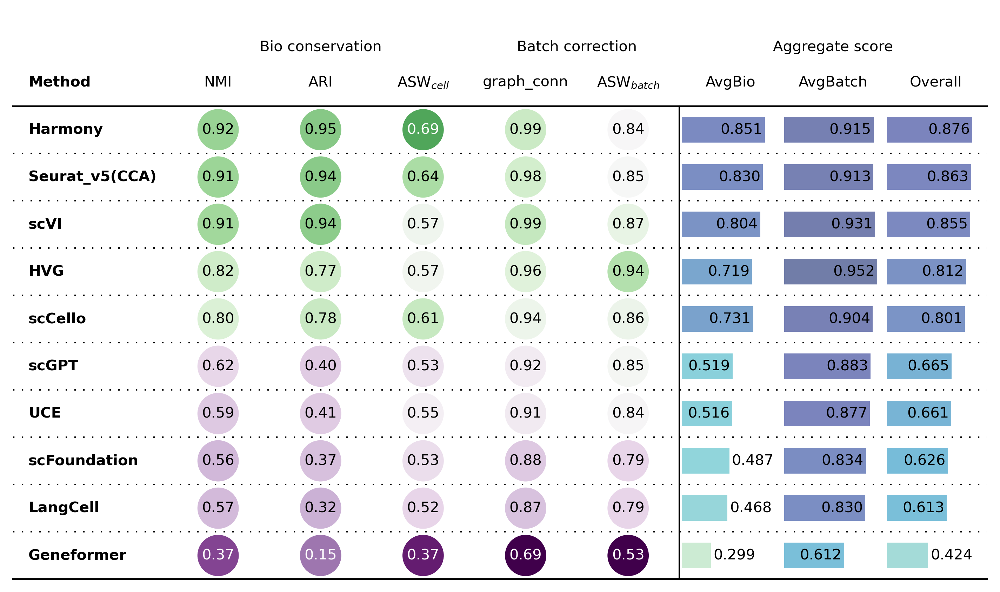

In [ ]:
plot_results_table(df.T)

In [ ]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.8245,0.7655,0.5660,0.9634,0.9396,0.7187,0.9515,0.8118,HVG,Baseline
scVI,0.9055,0.9383,0.5684,0.9918,0.8708,0.8040,0.9313,0.8549,scVI,Baseline
Harmony,0.9158,0.9457,0.6908,0.9861,0.8429,0.8508,0.9145,0.8763,Harmony,Baseline
Seurat_v5(CCA),0.9118,0.9425,0.6371,0.9802,0.8454,0.8305,0.9128,0.8634,Seurat_v5(CCA),Baseline
Geneformer,0.3706,0.1510,0.3742,0.6935,0.5306,0.2986,0.6121,0.4240,Geneformer,scFM
scGPT,0.6229,0.4046,0.5307,0.9161,0.8494,0.5194,0.8827,0.6647,scGPT,scFM
UCE,0.5934,0.4068,0.5482,0.9136,0.8412,0.5161,0.8774,0.6606,UCE,scFM
scFoundation,0.5631,0.3705,0.5260,0.8761,0.7929,0.4865,0.8345,0.6257,scFoundation,scFM
LangCell,0.5657,0.3214,0.5165,0.8681,0.7921,0.4679,0.8301,0.6128,LangCell,scFM
scCello,0.7986,0.7809,0.6148,0.9445,0.8643,0.7314,0.9044,0.8006,scCello,scFM


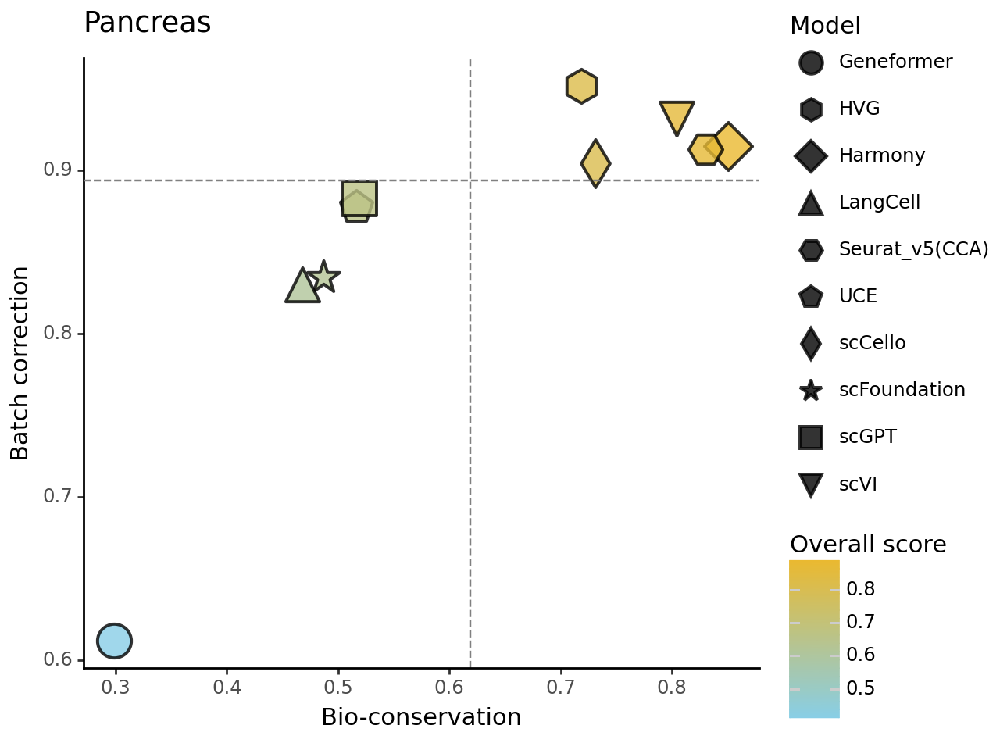

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

## Immune

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "Immune_all_human"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048
ARI_cluster/label,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227
ASW_label,0.5119,0.5455,0.5739,0.5574,0.5073,0.5452,0.5603,0.5733,0.5463,0.5950
graph_conn,0.9530,0.9684,0.9555,0.9367,0.9088,0.8982,0.9365,0.8740,0.8682,0.9768
ASW_label/batch,0.9472,0.8948,0.8799,0.8527,0.8617,0.9018,0.8845,0.8250,0.8458,0.8411
avg_bio,0.5563,0.7294,0.7359,0.6295,0.5251,0.5744,0.6849,0.4976,0.5391,0.5742
avg_batch,0.9501,0.9316,0.9177,0.8947,0.8853,0.9000,0.9105,0.8495,0.8570,0.9089
overall,0.7139,0.8103,0.8086,0.7356,0.6692,0.7046,0.7751,0.6384,0.6663,0.7081


In [ ]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI', 'Harmony']
Front 2: ['UCE']
Front 3: ['Seurat_v5(CCA)', 'scCello']
Front 4: ['scGPT']
Front 5: ['Geneformer', 'LangCell']
Front 6: ['scFoundation']


In [ ]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello,Metric Type
NMI,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048,Bio conservation
ARI,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227,Bio conservation
ASW$_{cell}$,0.5119,0.5455,0.5739,0.5574,0.5073,0.5452,0.5603,0.5733,0.5463,0.5950,Bio conservation
graph_conn,0.9530,0.9684,0.9555,0.9367,0.9088,0.8982,0.9365,0.8740,0.8682,0.9768,Batch correction
ASW$_{batch}$,0.9472,0.8948,0.8799,0.8527,0.8617,0.9018,0.8845,0.8250,0.8458,0.8411,Batch correction
AvgBio,0.5563,0.7294,0.7359,0.6295,0.5251,0.5744,0.6849,0.4976,0.5391,0.5742,Aggregate score
AvgBatch,0.9501,0.9316,0.9177,0.8947,0.8853,0.9000,0.9105,0.8495,0.8570,0.9089,Aggregate score
Overall,0.7139,0.8103,0.8086,0.7356,0.6692,0.7046,0.7751,0.6384,0.6663,0.7081,Aggregate score


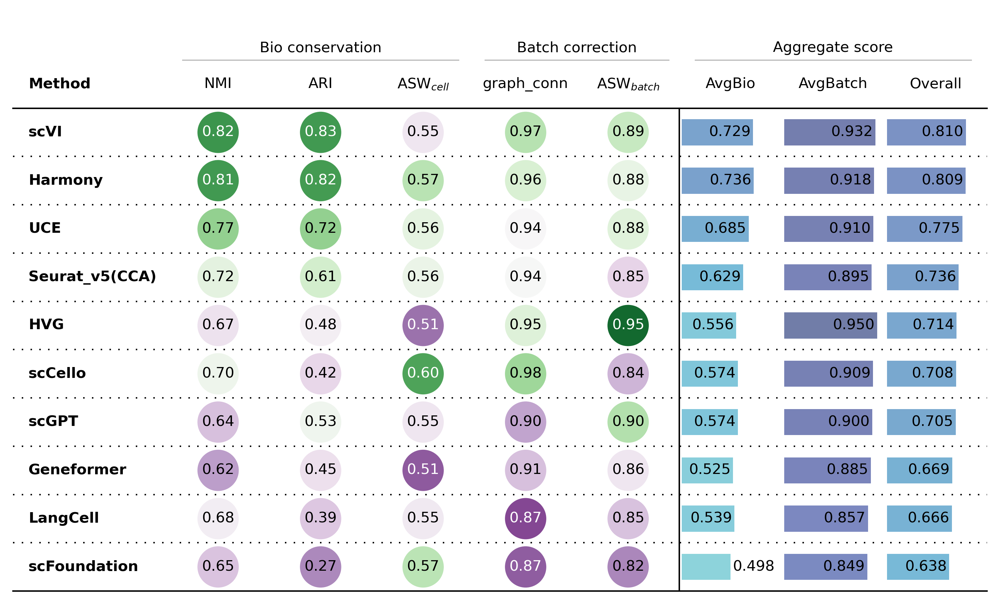

In [ ]:
plot_results_table(df.T)

In [ ]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.6736,0.4835,0.5119,0.9530,0.9472,0.5563,0.9501,0.7139,HVG,Baseline
scVI,0.8160,0.8268,0.5455,0.9684,0.8948,0.7294,0.9316,0.8103,scVI,Baseline
Harmony,0.8129,0.8209,0.5739,0.9555,0.8799,0.7359,0.9177,0.8086,Harmony,Baseline
Seurat_v5(CCA),0.7166,0.6144,0.5574,0.9367,0.8527,0.6295,0.8947,0.7356,Seurat_v5(CCA),Baseline
Geneformer,0.6200,0.4481,0.5073,0.9088,0.8617,0.5251,0.8853,0.6692,Geneformer,scFM
scGPT,0.6446,0.5333,0.5452,0.8982,0.9018,0.5744,0.9000,0.7046,scGPT,scFM
UCE,0.7732,0.7212,0.5603,0.9365,0.8845,0.6849,0.9105,0.7751,UCE,scFM
scFoundation,0.6466,0.2730,0.5733,0.8740,0.8250,0.4976,0.8495,0.6384,scFoundation,scFM
LangCell,0.6836,0.3875,0.5463,0.8682,0.8458,0.5391,0.8570,0.6663,LangCell,scFM
scCello,0.7048,0.4227,0.5950,0.9768,0.8411,0.5742,0.9089,0.7081,scCello,scFM


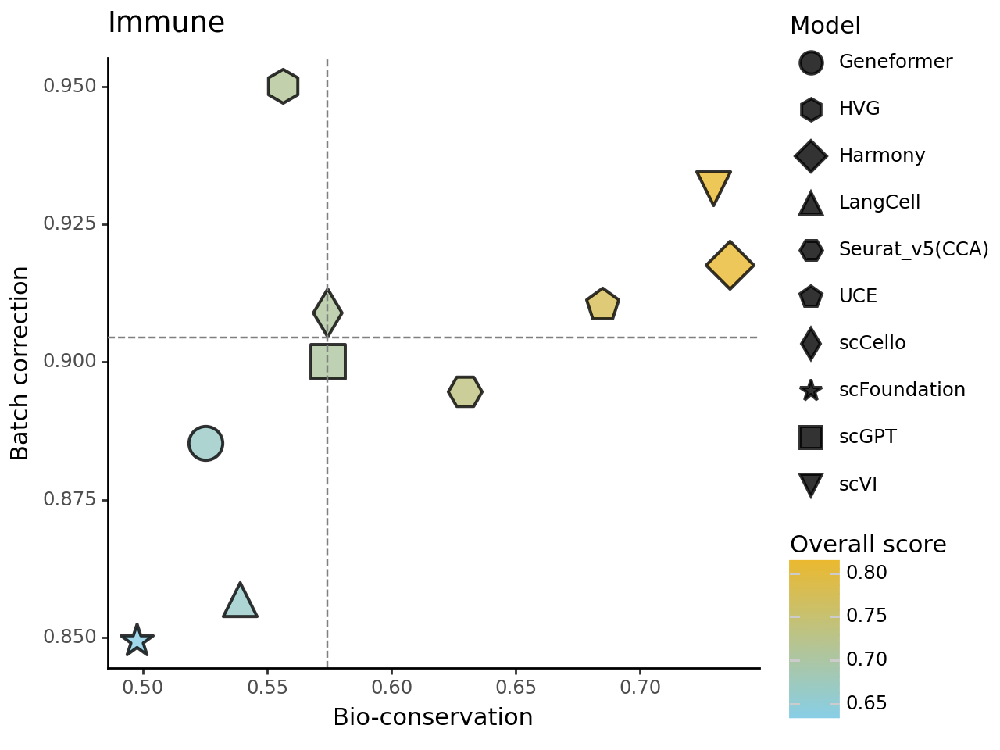

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

## HLCA

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "HLCA_core"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.7605,0.8090,0.7554,0.6886,0.6662,0.7736,0.7337,0.6749,0.6638,0.7550
ARI_cluster/label,0.5715,0.6528,0.5844,0.5056,0.4476,0.6651,0.4667,0.3038,0.3275,0.5512
ASW_label,0.5220,0.5395,0.5476,0.5238,0.4981,0.5098,0.5646,0.5543,0.5258,0.5836
graph_conn,0.9794,0.9930,0.9651,0.9268,0.9358,0.9634,0.9810,0.9773,0.9291,0.9743
ASW_label/batch,0.9369,0.9051,0.8510,0.8105,0.8840,0.9180,0.8847,0.8525,0.8730,0.8795
avg_bio,0.6180,0.6671,0.6291,0.5727,0.5373,0.6495,0.5883,0.5110,0.5057,0.6300
avg_batch,0.9582,0.9490,0.9080,0.8687,0.9099,0.9407,0.9329,0.9149,0.9011,0.9269
overall,0.7541,0.7799,0.7407,0.6911,0.6863,0.7660,0.7262,0.6726,0.6638,0.7487


In [ ]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI']
Front 2: ['scGPT']
Front 3: ['UCE', 'scCello']
Front 4: ['Harmony', 'Geneformer', 'scFoundation']
Front 5: ['Seurat_v5(CCA)', 'LangCell']


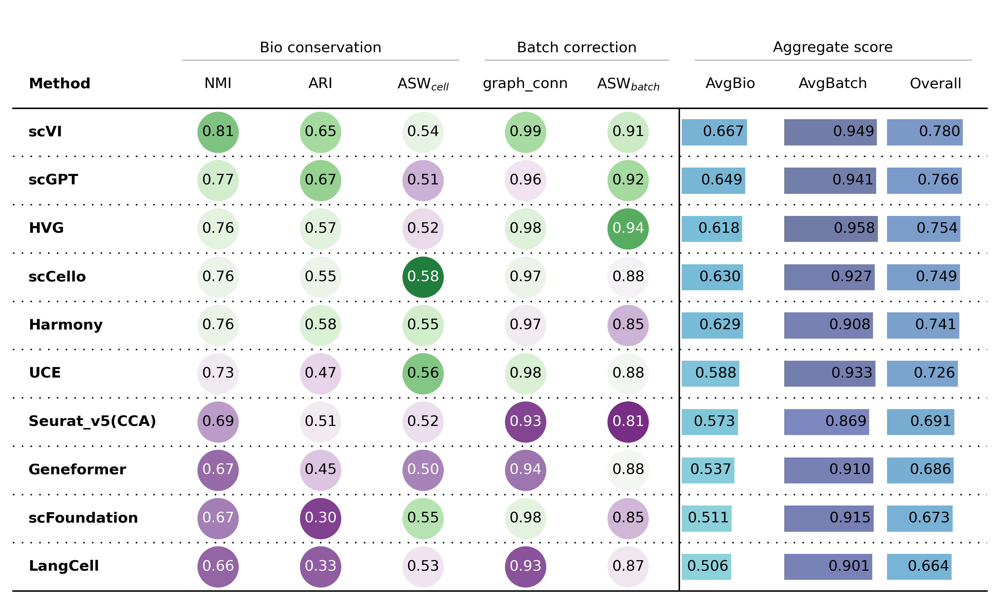

In [ ]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [ ]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.7605,0.5715,0.5220,0.9794,0.9369,0.6180,0.9582,0.7541,HVG,Baseline
scVI,0.8090,0.6528,0.5395,0.9930,0.9051,0.6671,0.9490,0.7799,scVI,Baseline
Harmony,0.7554,0.5844,0.5476,0.9651,0.8510,0.6291,0.9080,0.7407,Harmony,Baseline
Seurat_v5(CCA),0.6886,0.5056,0.5238,0.9268,0.8105,0.5727,0.8687,0.6911,Seurat_v5(CCA),Baseline
Geneformer,0.6662,0.4476,0.4981,0.9358,0.8840,0.5373,0.9099,0.6863,Geneformer,scFM
scGPT,0.7736,0.6651,0.5098,0.9634,0.9180,0.6495,0.9407,0.7660,scGPT,scFM
UCE,0.7337,0.4667,0.5646,0.9810,0.8847,0.5883,0.9329,0.7262,UCE,scFM
scFoundation,0.6749,0.3038,0.5543,0.9773,0.8525,0.5110,0.9149,0.6726,scFoundation,scFM
LangCell,0.6638,0.3275,0.5258,0.9291,0.8730,0.5057,0.9011,0.6638,LangCell,scFM
scCello,0.7550,0.5512,0.5836,0.9743,0.8795,0.6300,0.9269,0.7487,scCello,scFM


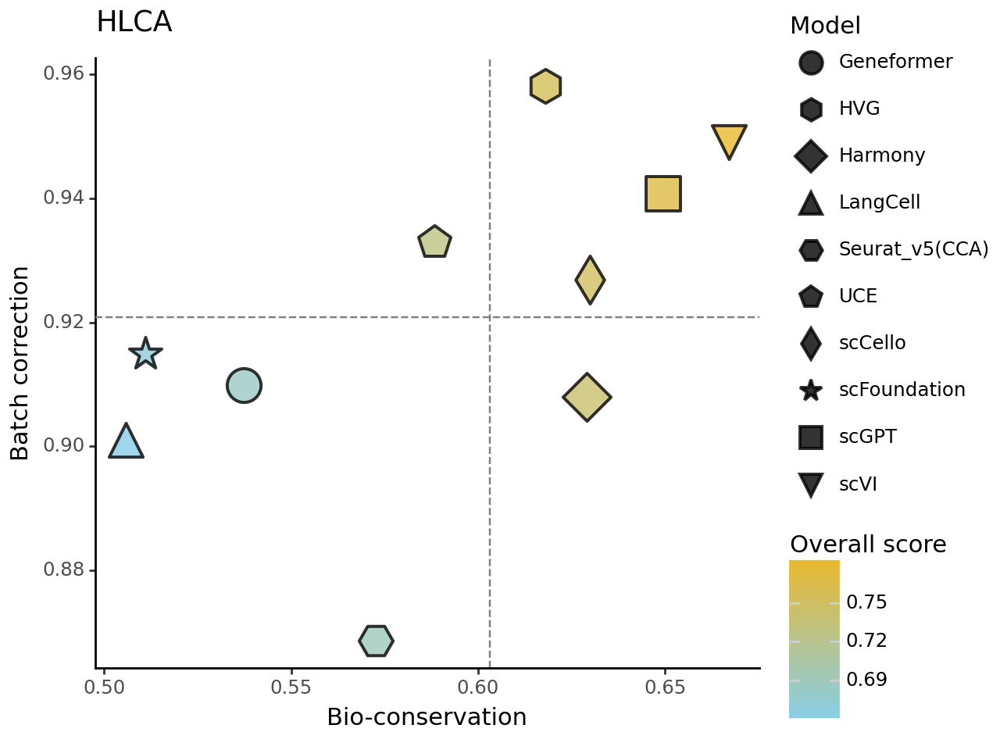

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [ ]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.8957,0.7656,0.8306,Baseline
1,scVI,0.6497,0.7467,0.6982,Baseline
2,Harmony,0.3200,0.4481,0.3840,Baseline
3,Seurat_v5(CCA),0.7719,0.5232,0.6476,Baseline
4,Geneformer,0.6601,0.6967,0.6784,scFM
5,scGPT,0.7022,0.7311,0.7167,scFM
6,UCE,0.6945,0.7994,0.7470,scFM
7,scFoundation,0.6919,0.7886,0.7403,scFM
8,LangCell,0.6425,0.7719,0.7072,scFM
9,scCello,0.7378,0.7560,0.7469,scFM


In [ ]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.89565284, 0.76564415]), 'scVI': array([0.6497249 , 0.74668821]), 'Harmony': array([0.3199608 , 0.44806277]), 'Seurat_v5(CCA)': array([0.77191393, 0.52319454]), 'Geneformer': array([0.66010006, 0.6966999 ]), 'scGPT': array([0.70218902, 0.73111642]), 'UCE': array([0.69452227, 0.79938658]), 'scFoundation': array([0.69190658, 0.78859846]), 'LangCell': array([0.64254141, 0.77185943]), 'scCello': array([0.73784828, 0.75595837])}
Front 1: ['HVG', 'UCE']
Front 2: ['Seurat_v5(CCA)', 'scCello', 'scFoundation']
Front 3: ['scGPT', 'scVI', 'LangCell']
Front 4: ['Geneformer']
Front 5: ['Harmony']


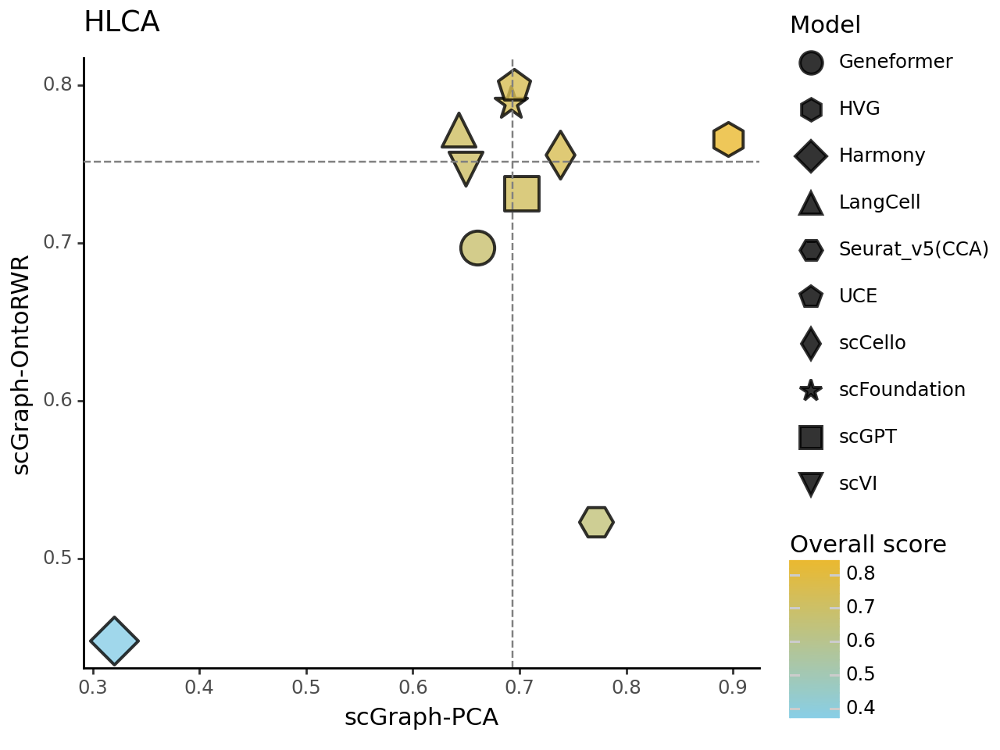

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

##### detailed analysis

In [ ]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.6121
1,HVG,0.8243
2,HVG,0.8289
3,HVG,0.7720
4,HVG,0.7199
...,...,...
495,scCello,0.7884
496,scCello,0.7538
497,scCello,0.7488
498,scCello,0.7599


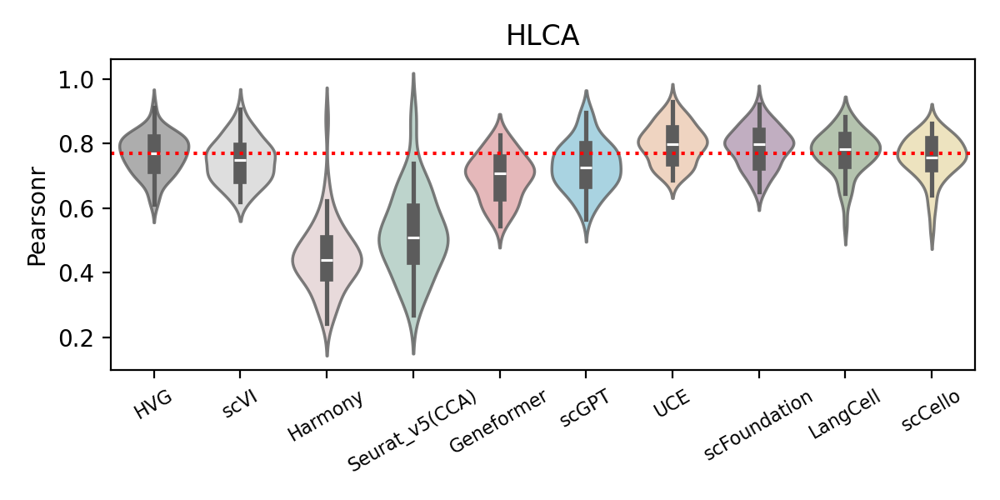

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/hlca_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## Tabula_Sapiens_all

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "Tabula_Sapiens_all"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.7433,0.7453,0.6400,0.5007,0.6811,0.6949,0.7367,0.7324,0.7325,0.7509
ARI_cluster/label,0.3935,0.4750,0.3439,0.1871,0.3772,0.3351,0.4011,0.4139,0.4196,0.5067
ASW_label,0.5006,0.4888,0.4561,0.3925,0.4106,0.4905,0.5298,0.5170,0.5038,0.5229
graph_conn,0.8809,0.8390,0.7939,0.5355,0.7392,0.8286,0.8635,0.8533,0.8370,0.8496
ASW_label/batch,0.8910,0.7844,0.8101,0.8134,0.7831,0.8744,0.7430,0.7977,0.8439,0.8043
avg_bio,0.5458,0.5697,0.4800,0.3601,0.4896,0.5068,0.5559,0.5545,0.5520,0.5935
avg_batch,0.8860,0.8117,0.8020,0.6745,0.7611,0.8515,0.8032,0.8255,0.8404,0.8269
overall,0.6819,0.6665,0.6088,0.4859,0.5982,0.6447,0.6548,0.6629,0.6673,0.6869


In [ ]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'LangCell', 'scCello']
Front 2: ['scGPT', 'scVI', 'scFoundation']
Front 3: ['UCE']
Front 4: ['Harmony', 'Geneformer']
Front 5: ['Seurat_v5(CCA)']


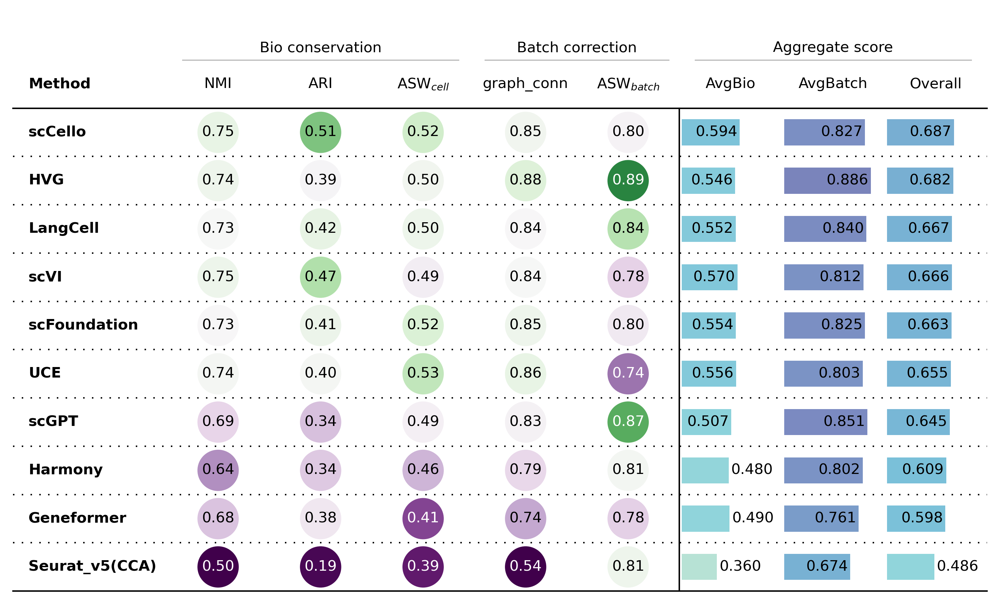

In [ ]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [ ]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.7433,0.3935,0.5006,0.8809,0.8910,0.5458,0.8860,0.6819,HVG,Baseline
scVI,0.7453,0.4750,0.4888,0.8390,0.7844,0.5697,0.8117,0.6665,scVI,Baseline
Harmony,0.6400,0.3439,0.4561,0.7939,0.8101,0.4800,0.8020,0.6088,Harmony,Baseline
Seurat_v5(CCA),0.5007,0.1871,0.3925,0.5355,0.8134,0.3601,0.6745,0.4859,Seurat_v5(CCA),Baseline
Geneformer,0.6811,0.3772,0.4106,0.7392,0.7831,0.4896,0.7611,0.5982,Geneformer,scFM
scGPT,0.6949,0.3351,0.4905,0.8286,0.8744,0.5068,0.8515,0.6447,scGPT,scFM
UCE,0.7367,0.4011,0.5298,0.8635,0.7430,0.5559,0.8032,0.6548,UCE,scFM
scFoundation,0.7324,0.4139,0.5170,0.8533,0.7977,0.5545,0.8255,0.6629,scFoundation,scFM
LangCell,0.7325,0.4196,0.5038,0.8370,0.8439,0.5520,0.8404,0.6673,LangCell,scFM
scCello,0.7509,0.5067,0.5229,0.8496,0.8043,0.5935,0.8269,0.6869,scCello,scFM


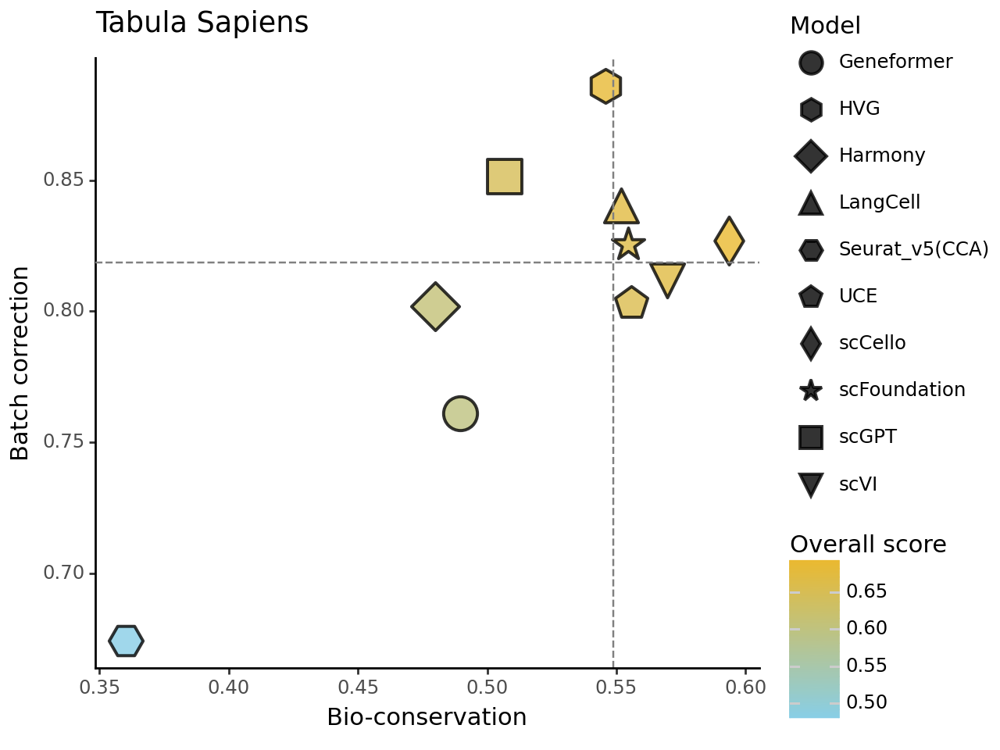

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [ ]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.7257,0.5213,0.6235,Baseline
1,scVI,0.6353,0.4932,0.5643,Baseline
2,Harmony,0.5727,0.3762,0.4744,Baseline
3,Seurat_v5(CCA),0.4064,0.2098,0.3081,Baseline
4,Geneformer,0.4987,0.2570,0.3778,scFM
5,scGPT,0.6439,0.4958,0.5699,scFM
6,UCE,0.6334,0.5915,0.6124,scFM
7,scFoundation,0.6115,0.5761,0.5938,scFM
8,LangCell,0.6278,0.5433,0.5856,scFM
9,scCello,0.6152,0.5276,0.5714,scFM


In [ ]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.72568964, 0.5213361 ]), 'scVI': array([0.63531523, 0.49318794]), 'Harmony': array([0.57265403, 0.37621884]), 'Seurat_v5(CCA)': array([0.40636744, 0.2097757 ]), 'Geneformer': array([0.49867324, 0.25695737]), 'scGPT': array([0.64393155, 0.49582515]), 'UCE': array([0.63337416, 0.59149406]), 'scFoundation': array([0.61150213, 0.57611242]), 'LangCell': array([0.62784482, 0.54330202]), 'scCello': array([0.61519085, 0.52762563])}
Front 1: ['HVG', 'UCE']
Front 2: ['scGPT', 'scFoundation', 'LangCell']
Front 3: ['scVI', 'scCello']
Front 4: ['Harmony']
Front 5: ['Geneformer']
Front 6: ['Seurat_v5(CCA)']


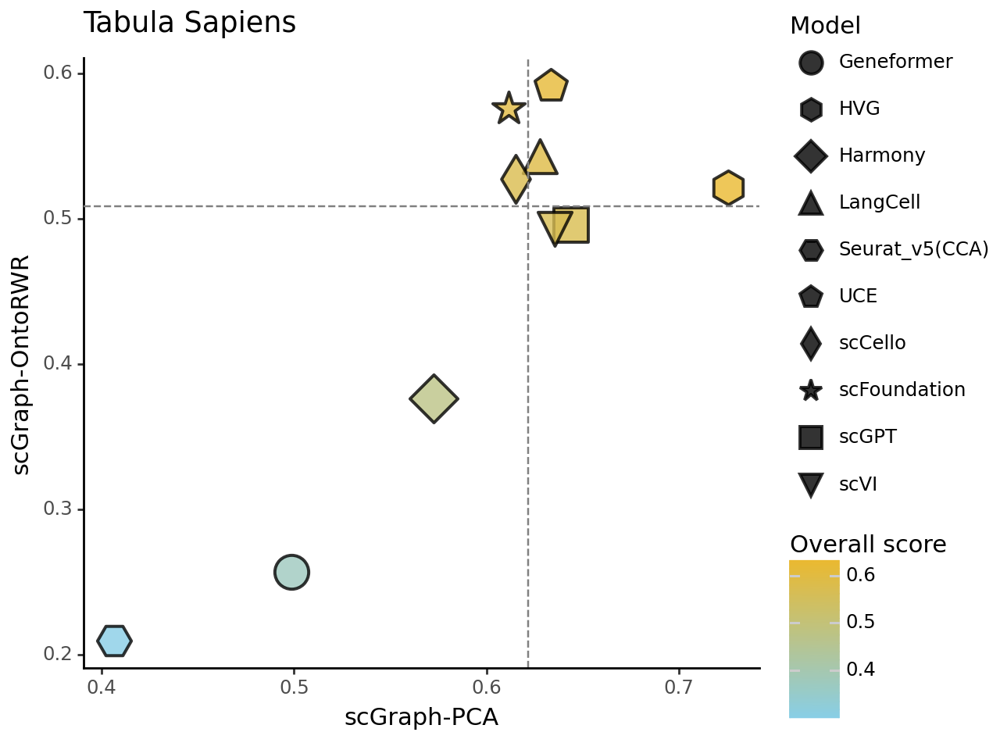

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

#### detailed analysis

In [ ]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.3252
1,HVG,0.4066
2,HVG,0.3351
3,HVG,0.3452
4,HVG,0.3431
...,...,...
1545,scCello,0.5534
1546,scCello,0.4972
1547,scCello,0.5768
1548,scCello,0.6996


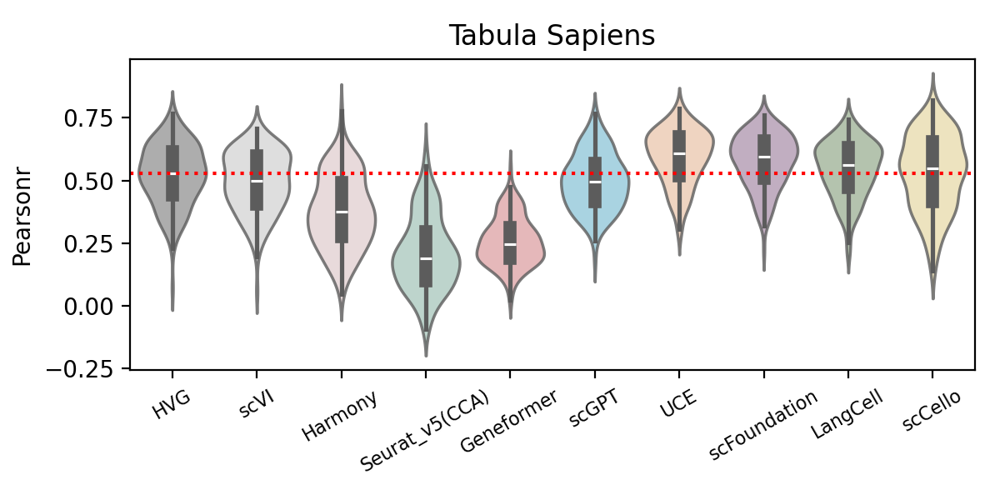

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/tabula_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## AIDA v2

In [ ]:
pd.set_option('display.precision', 4) 
dataset_name = "AIDA_v2_new"
layer_key = dataset_info_dict[dataset_name]["layer_key"]
df = pd.DataFrame()
for model in cluster_models:
    result_path = os.path.join(output_folder, dataset_name, layer_key, model, "clustering_metrics.csv")
    df_ = pd.read_csv(result_path, index_col=0)
    df = pd.concat([df, df_], axis=1)
df.rename(columns=model_map_dict, inplace=True)
df

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.6677,0.7134,0.6769,0.6615,0.5864,0.6177,0.7097,0.6800,0.6637,0.7262
ARI_cluster/label,0.4957,0.5180,0.5163,0.4761,0.2928,0.3252,0.5157,0.4645,0.4052,0.5520
ASW_label,0.4932,0.5117,0.5150,0.5377,0.5033,0.5132,0.5357,0.5380,0.5219,0.6002
graph_conn,0.8878,0.9741,0.9455,0.9358,0.8899,0.9090,0.9648,0.9785,0.9534,0.9621
ASW_label/batch,0.9548,0.8867,0.8036,0.6458,0.8756,0.8765,0.8575,0.8838,0.9350,0.7738
avg_bio,0.5522,0.5810,0.5694,0.5584,0.4608,0.4854,0.5871,0.5608,0.5303,0.6261
avg_batch,0.9213,0.9304,0.8746,0.7908,0.8828,0.8927,0.9111,0.9311,0.9442,0.8679
overall,0.6998,0.7208,0.6915,0.6514,0.6296,0.6483,0.7167,0.7090,0.6959,0.7229


In [ ]:
keys = df.columns
values = df.iloc[-3:-1,:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['scVI', 'UCE', 'LangCell', 'scCello']
Front 2: ['scFoundation', 'Harmony']
Front 3: ['HVG', 'Seurat_v5(CCA)']
Front 4: ['scGPT']
Front 5: ['Geneformer']


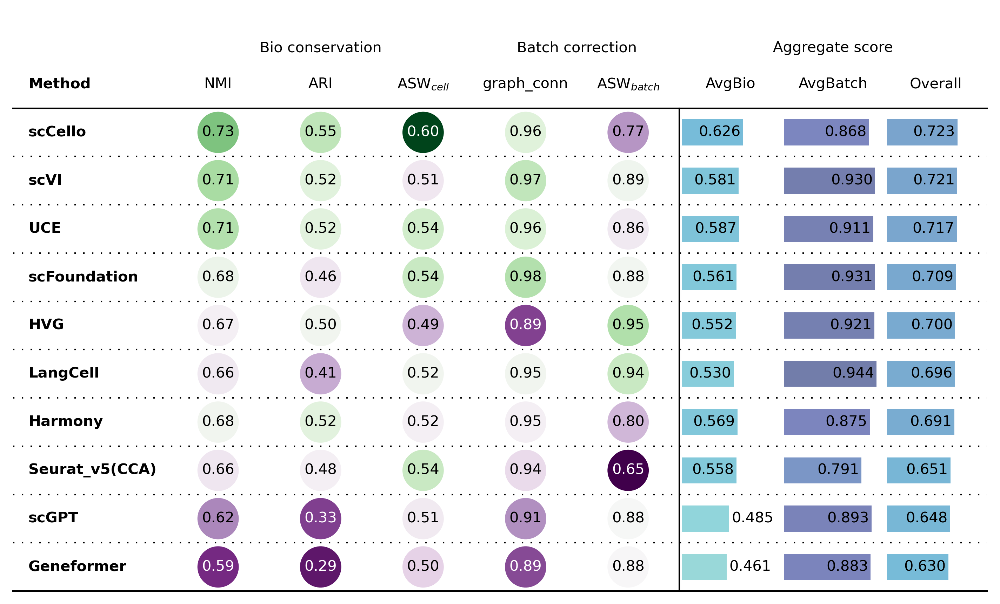

In [ ]:
df.rename(index=scib_metrics_dict, inplace=True)
df[_METRIC_TYPE] = ["Bio conservation", "Bio conservation", "Bio conservation", 
                    "Batch correction", "Batch correction",
                    _AGGREGATE_SCORE, _AGGREGATE_SCORE, _AGGREGATE_SCORE]
plot_results_table(df.T)

In [ ]:
data = df.iloc[:, :-1].T
data["model"] = data.index
data["model_class"] = data["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
data

,NMI,ARI,ASW$_{cell}$,graph_conn,ASW$_{batch}$,AvgBio,AvgBatch,Overall,model,model_class
HVG,0.6677,0.4957,0.4932,0.8878,0.9548,0.5522,0.9213,0.6998,HVG,Baseline
scVI,0.7134,0.5180,0.5117,0.9741,0.8867,0.5810,0.9304,0.7208,scVI,Baseline
Harmony,0.6769,0.5163,0.5150,0.9455,0.8036,0.5694,0.8746,0.6915,Harmony,Baseline
Seurat_v5(CCA),0.6615,0.4761,0.5377,0.9358,0.6458,0.5584,0.7908,0.6514,Seurat_v5(CCA),Baseline
Geneformer,0.5864,0.2928,0.5033,0.8899,0.8756,0.4608,0.8828,0.6296,Geneformer,scFM
scGPT,0.6177,0.3252,0.5132,0.9090,0.8765,0.4854,0.8927,0.6483,scGPT,scFM
UCE,0.7097,0.5157,0.5357,0.9648,0.8575,0.5871,0.9111,0.7167,UCE,scFM
scFoundation,0.6800,0.4645,0.5380,0.9785,0.8838,0.5608,0.9311,0.7090,scFoundation,scFM
LangCell,0.6637,0.4052,0.5219,0.9534,0.9350,0.5303,0.9442,0.6959,LangCell,scFM
scCello,0.7262,0.5520,0.6002,0.9621,0.7738,0.6261,0.8679,0.7229,scCello,scFM


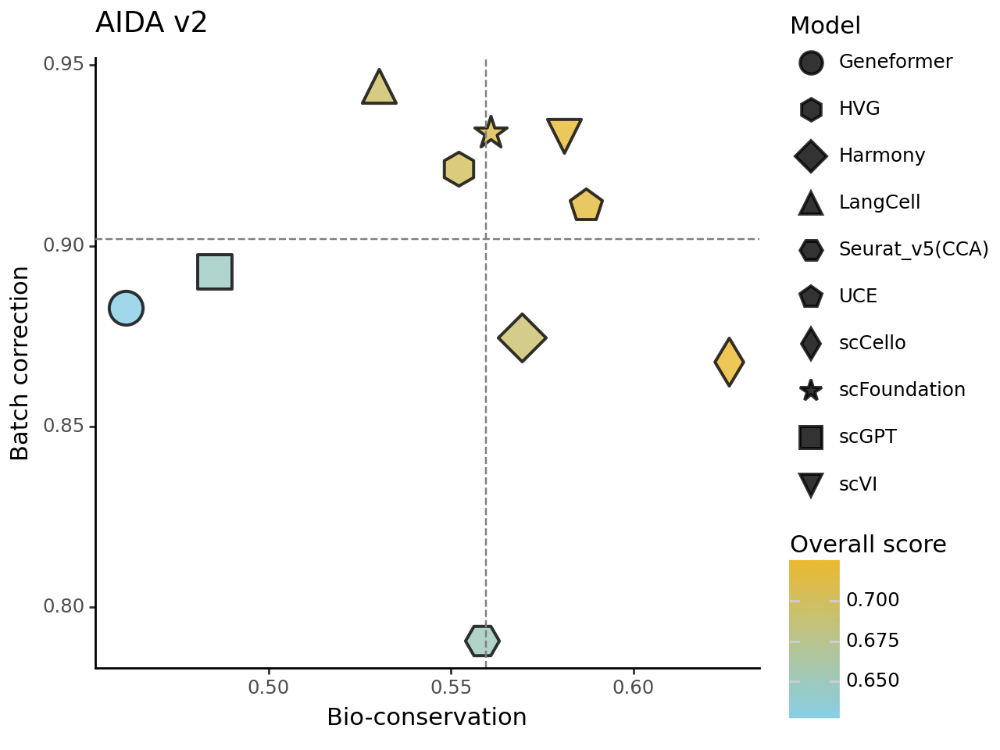

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(data, aes(x='AvgBio', y='AvgBatch', shape='model')) 
+ geom_point(
    aes(fill='Overall', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=data['AvgBio'].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=data['AvgBatch'].median(), linetype='dashed', color='grey') 
+ xlab('Bio-conservation') 
+ ylab('Batch correction') 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

### scGraph metrics

In [ ]:
scgraph = f"{output_folder}/scGraph/{dataset_name}.csv"
scgraph_df = pd.DataFrame()
x, y = [], []
model_list_new = []
for model in cluster_models:
    # if model == "scVI":
    #     x.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph_hvg_wo_batchkey, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    # else:
    #     x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    #     y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    x.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-PCA"])
    y.append(pd.read_csv(scgraph, index_col=0).loc[f"X_{model.lower()}", "Pearson-OntoRWR"])
    model_list_new.append(model_map_dict[f"X_{model.lower()}"])
scgraph_df["model"] = model_list_new
scgraph_df["scGraph-Pearson-PCA"] = x
scgraph_df["scGraph-Pearson-OntoRWR"] = y
scgraph_df["Overall_score"] = (scgraph_df["scGraph-Pearson-PCA"] + scgraph_df["scGraph-Pearson-OntoRWR"]) / 2
scgraph_df["model_class"] = scgraph_df["model"].apply(lambda x: "scFM" if x in model_order_scFM else "Baseline")
scgraph_df

,model,scGraph-Pearson-PCA,scGraph-Pearson-OntoRWR,Overall_score,model_class
0,HVG,0.9612,0.6733,0.8173,Baseline
1,scVI,0.5816,0.6741,0.6278,Baseline
2,Harmony,0.8448,0.6008,0.7228,Baseline
3,Seurat_v5(CCA),0.9370,0.6151,0.7761,Baseline
4,Geneformer,0.8280,0.6796,0.7538,scFM
5,scGPT,0.8760,0.6790,0.7775,scFM
6,UCE,0.7568,0.7560,0.7564,scFM
7,scFoundation,0.7881,0.7454,0.7667,scFM
8,LangCell,0.7213,0.7923,0.7568,scFM
9,scCello,0.7218,0.7851,0.7534,scFM


In [ ]:
keys = scgraph_df["model"]
values = scgraph_df.loc[:, ["scGraph-Pearson-PCA", "scGraph-Pearson-OntoRWR"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'HVG': array([0.96117715, 0.67333722]), 'scVI': array([0.58159702, 0.67406456]), 'Harmony': array([0.84476802, 0.60082442]), 'Seurat_v5(CCA)': array([0.93704356, 0.61508235]), 'Geneformer': array([0.82795978, 0.6795675 ]), 'scGPT': array([0.87596382, 0.67901774]), 'UCE': array([0.75683724, 0.75604487]), 'scFoundation': array([0.78812505, 0.74536186]), 'LangCell': array([0.72132004, 0.79228681]), 'scCello': array([0.72183968, 0.78505   ])}
Front 1: ['HVG', 'scGPT', 'UCE', 'scFoundation', 'LangCell']
Front 2: ['Seurat_v5(CCA)', 'Geneformer', 'scCello']
Front 3: ['Harmony', 'scVI']


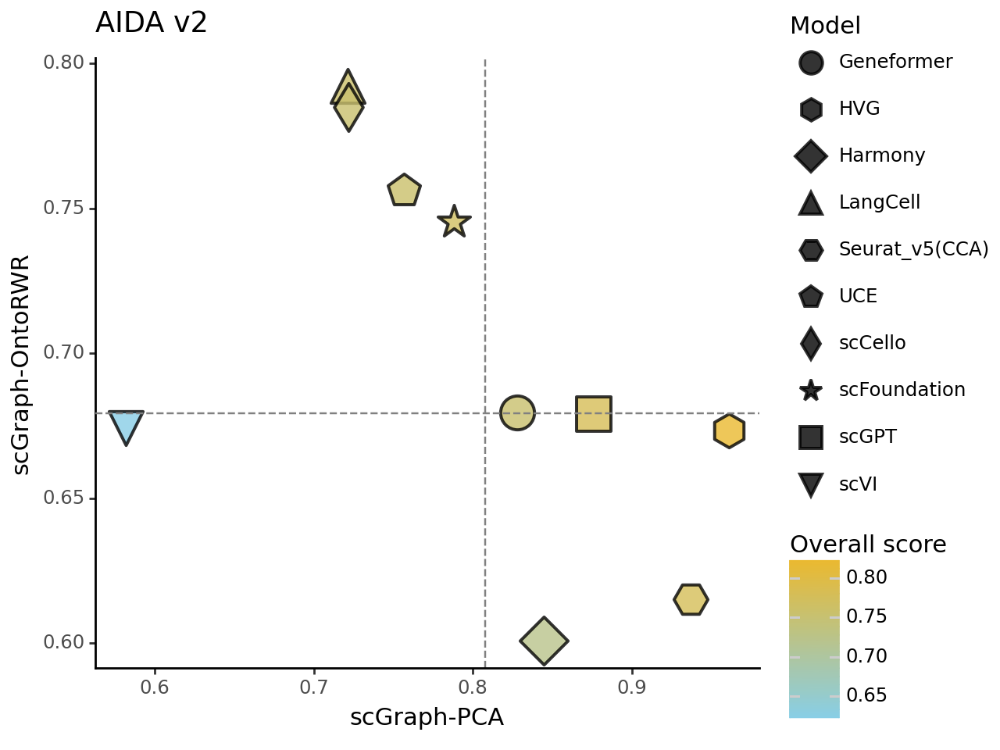

<Figure Size: (640 x 480)>

In [ ]:
(
ggplot(scgraph_df, aes(x="scGraph-Pearson-PCA", y="scGraph-Pearson-OntoRWR", shape='model')) 
+ geom_point(
    aes(fill='Overall_score', color="model_class"), 
    size=8, alpha=0.8, stroke=0.8
)
+ scale_shape_manual(custom_shape) 
+ scale_fill_gradient(low="#88CEE6", high="#EAB930", name='Overall score') 
+ scale_color_manual(values={'Baseline':'black', 'scFM':'black'}, name='Model class') 
+ guides(
    size=False,
    shape=guide_legend(title='Model', override_aes={'size':5}),
    fill=guide_colorbar(title='Overall score', barheight=10),
    color=False,
)
+ geom_vline(xintercept=scgraph_df["scGraph-Pearson-PCA"].median(), linetype='dashed', color='grey') 
+ geom_hline(yintercept=scgraph_df["scGraph-Pearson-OntoRWR"].median(), linetype='dashed', color='grey') 
+ xlab("scGraph-PCA") 
+ ylab("scGraph-OntoRWR") 
+ ggtitle(dataset_map_dict[dataset_name]) 
+ theme_classic()
)

#### detailed analysis

In [ ]:
use_cols = [f"X_{model.lower()}" for model in cluster_models]
rwr_detailed = pd.read_csv(f"{output_folder}/scGraph/{dataset_name}_rwr_detailed.csv", index_col=0).loc[:, use_cols]
rwr_detailed = rwr_detailed.rename(columns=model_map_dict)
rwr_detailed = pd.melt(rwr_detailed, var_name='Model', value_name='Pearsonr')
rwr_detailed

,Model,Pearsonr
0,HVG,0.5516
1,HVG,0.7269
2,HVG,0.7647
3,HVG,0.7506
4,HVG,0.6075
...,...,...
315,scCello,0.5815
316,scCello,0.7101
317,scCello,0.7782
318,scCello,0.7369


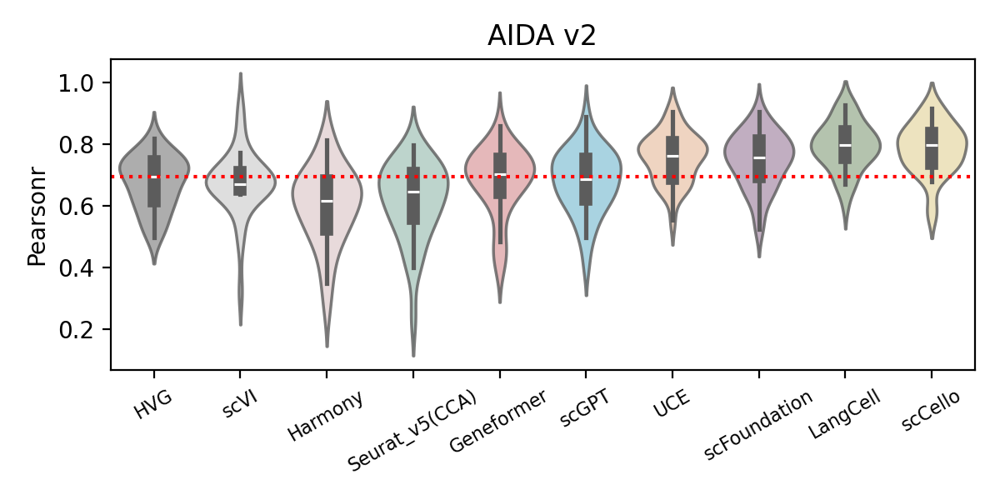

In [ ]:
plt.figure(figsize=(6, 3))
sns.violinplot(rwr_detailed, x="Model", y="Pearsonr", hue="Model", 
               palette=custom_palette, alpha=0.8,
               order=model_order)
plt.xticks(fontsize=8, rotation=30)
plt.xlabel("")
plt.ylabel("Pearsonr", fontsize=10)
plt.axhline(y=rwr_detailed[rwr_detailed["Model"]=="HVG"]["Pearsonr"].median(), color="red", linestyle=':')
plt.title(dataset_map_dict[dataset_name])
plt.tight_layout()
plt.savefig("../figures/clustering/aida_pearsonr_violinplot.png", dpi=300, bbox_inches='tight')

## Embedding distance analysis

#### Case study of the proposed metric

In [ ]:
def get_ontology_name(obo_file, lower=True):
	fin = open(obo_file)
	co2name = {}
	name2co = {}
	tag_is_syn = {}
	for line in fin:
		if line.startswith('id: '):
			co = line.strip().split('id: ')[1]
		if line.startswith('name: '):
			if lower:
				name = line.strip().lower().split('name: ')[1]
			else:
				name = line.strip().split('name: ')[1]
			co2name[co] = name
			name2co[name] = co
		if line.startswith('synonym: '):
			if lower:
				syn = line.strip().lower().split('synonym: "')[1].split('" ')[0]
			else:
				syn = line.strip().split('synonym: "')[1].split('" ')[0]
			if syn in name2co:
				continue
			name2co[syn] = co
	fin.close()
	return co2name, name2co

In [ ]:
co2name, name2co = get_ontology_name("../data/OnClass_data_public/Ontology_data/cl.obo")
co2name

{'CL:0000000': 'cell',
 'CL:0000001': 'primary cultured cell',
 'CL:0000002': 'obsolete immortal cell line cell',
 'CL:0000003': 'obsolete native cell',
 'CL:0000004': 'obsolete cell by organism',
 'CL:0000005': 'neural crest derived fibroblast',
 'CL:0000006': 'neuronal receptor cell',
 'CL:0000007': 'early embryonic cell (metazoa)',
 'CL:0000008': 'migratory cranial neural crest cell',
 'CL:0000009': 'obsolete fusiform initial',
 'CL:0000010': 'cultured cell',
 'CL:0000011': 'migratory trunk neural crest cell',
 'CL:0000012': 'obsolete cell by class',
 'CL:0000013': 'obsolete dentine secreting cell',
 'CL:0000014': 'germ line stem cell',
 'CL:0000015': 'male germ cell',
 'CL:0000016': 'male germ line stem cell',
 'CL:0000017': 'spermatocyte',
 'CL:0000018': 'spermatid',
 'CL:0000019': 'sperm',
 'CL:0000020': 'spermatogonium',
 'CL:0000021': 'female germ cell',
 'CL:0000022': 'female germ line stem cell',
 'CL:0000023': 'oocyte',
 'CL:0000024': 'oogonial cell',
 'CL:0000025': 'egg cel

In [ ]:
# create ontology graph
onto_sp = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.sp.csv", index_col=0)
onto_nlp = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.nlp.csv", index_col=0)
onto_rwr = pd.read_csv("../data/OnClass_data_public/Ontology_data/cl.ontology.rwr.csv", index_col=0)
onto_nlp

,CL:0000000,CL:0000001,CL:0000005,CL:0000006,CL:0000007,CL:0000008,CL:0000010,CL:0000011,CL:0000014,CL:0000015,...,CL:4042002,CL:4042003,CL:4042004,CL:4042005,CL:4042006,CL:4042007,CL:4042008,CL:4042009,CL:4042010,CL:4042011
CL:0000000,0.000000,0.672232,1.041984,1.256473,1.071841,1.139974,0.911691,1.193805,1.164662,1.184962,...,1.331425,1.036765,1.046754,1.030395,0.843450,1.217550,1.206490,1.183404,1.149285,1.157841
CL:0000001,0.672232,0.000000,0.913770,1.103122,0.989414,0.967440,0.475365,0.958533,1.037907,1.117927,...,1.187999,0.960066,0.988999,0.964015,0.853606,1.180351,1.165423,1.197557,1.148786,1.180082
CL:0000005,1.041984,0.913770,0.000000,1.074516,1.315732,0.830141,1.032640,0.826486,1.227876,1.294531,...,1.155228,0.876500,0.985932,0.885159,1.042170,1.133911,1.176370,1.166826,1.115774,1.139462
CL:0000006,1.256473,1.103122,1.074516,0.000000,1.177925,0.836709,1.114970,0.959024,1.065092,1.214365,...,0.782866,1.075460,1.119810,1.124066,1.219153,1.117037,1.145368,1.202255,1.076025,1.118687
CL:0000007,1.071841,0.989414,1.315732,1.177925,0.000000,1.140832,0.978524,1.122769,1.110488,0.956397,...,1.207877,1.213567,1.233261,1.240722,1.240959,1.302860,1.212929,1.281575,1.283402,1.297147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CL:4042007,1.217550,1.180351,1.133911,1.117037,1.302860,1.061198,1.274433,1.097722,1.283574,1.297264,...,1.132991,1.158146,1.262508,1.211515,1.239539,0.000000,0.456455,0.306484,0.566029,0.619029
CL:4042008,1.206490,1.165423,1.176370,1.145368,1.212929,0.990784,1.266793,1.074108,1.217526,1.261928,...,1.158793,1.064450,1.177082,1.113149,1.226485,0.456455,0.000000,0.380536,0.529810,0.560025
CL:4042009,1.183404,1.197557,1.166826,1.202255,1.281575,1.066361,1.292603,1.116678,1.282309,1.297275,...,1.233138,1.148845,1.260349,1.191595,1.255516,0.306484,0.380536,0.000000,0.444268,0.491837
CL:4042010,1.149285,1.148786,1.115774,1.076025,1.283402,0.958520,1.245792,1.054815,1.196449,1.324542,...,1.193491,0.991243,1.129390,1.033005,1.203898,0.566029,0.529810,0.444268,0.000000,0.207506


In [ ]:
reference_graph_pca = pd.read_csv("../scGraph/reference_graph/Tabula_Sapiens_all/concensus_df_pca.csv", index_col=0)
reference_graph_pca = reference_graph_pca.sort_index(axis=1)
reference_graph_pca

,CL:0000019,CL:0000034,CL:0000037,CL:0000038,CL:0000049,CL:0000057,CL:0000064,CL:0000066,CL:0000067,CL:0000068,...,CL:1000413,CL:1000432,CL:1000436,CL:1000495,CL:1001428,CL:1001516,CL:1001589,CL:2000016,CL:2000055,CL:4006000
CL:0000019,0.000000,NaN,NaN,0.457265,NaN,0.684123,NaN,0.142420,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000034,NaN,0.0,NaN,NaN,NaN,0.504228,NaN,NaN,NaN,NaN,...,NaN,0.140778,0.529626,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000037,NaN,NaN,0.000000,0.327703,0.123565,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000038,0.508669,NaN,0.295469,0.000000,0.257946,0.758313,NaN,0.555784,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CL:0000049,NaN,NaN,0.122267,0.279632,0.000000,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
CL:1001516,NaN,NaN,NaN,NaN,NaN,0.696243,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.681719,NaN,0.0000,0.616942,NaN,NaN,NaN
CL:1001589,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.983297,NaN,0.9757,0.000000,NaN,NaN,NaN
CL:2000016,NaN,NaN,NaN,NaN,NaN,0.786044,NaN,NaN,NaN,NaN,...,0.352374,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN
CL:2000055,NaN,NaN,NaN,NaN,NaN,0.635550,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN


In [ ]:
name2co["plasma cell"]

'CL:0000786'

In [ ]:
remain_celltypes = np.load("../OnClass/result/Tabula_Sapiens_all_remained_celltypes.npy")
target_celltype = 'CL:0000786'
co2distance = {x: onto_sp.loc[target_celltype, x] for x in remain_celltypes}
co2distance

{'CL:0000019': 8.0,
 'CL:0000037': 8.0,
 'CL:0000038': 8.0,
 'CL:0000049': 9.0,
 'CL:0000077': 10.0,
 'CL:0000097': 7.0,
 'CL:0000114': 10.0,
 'CL:0000129': 8.0,
 'CL:0000131': 10.0,
 'CL:0000134': 8.0,
 'CL:0000136': 9.0,
 'CL:0000148': 9.0,
 'CL:0000158': 8.0,
 'CL:0000169': 11.0,
 'CL:0000171': 11.0,
 'CL:0000173': 11.0,
 'CL:0000182': 9.0,
 'CL:0000185': 9.0,
 'CL:0000186': 9.0,
 'CL:0000189': 11.0,
 'CL:0000190': 11.0,
 'CL:0000232': 8.0,
 'CL:0000233': 8.0,
 'CL:0000287': 11.0,
 'CL:0000312': 9.0,
 'CL:0000359': 9.0,
 'CL:0000388': 10.0,
 'CL:0000453': 7.0,
 'CL:0000575': 10.0,
 'CL:0000636': 10.0,
 'CL:0000646': 9.0,
 'CL:0000669': 9.0,
 'CL:0000740': 10.0,
 'CL:0000745': 10.0,
 'CL:0000746': 9.0,
 'CL:0000748': 9.0,
 'CL:0000767': 8.0,
 'CL:0000775': 8.0,
 'CL:0000786': 0.0,
 'CL:0000787': 4.0,
 'CL:0000788': 4.0,
 'CL:0000794': 8.0,
 'CL:0000807': 8.0,
 'CL:0000808': 8.0,
 'CL:0000809': 7.0,
 'CL:0000823': 6.0,
 'CL:0000841': 7.0,
 'CL:0000860': 7.0,
 'CL:0000875': 7.0,
 'CL:0

In [ ]:
co2distance_df = pd.DataFrame()
co2distance_df["Cell ontology id"] = co2distance.keys()
co2distance_df["Cell name"] = co2distance_df["Cell ontology id"].apply(lambda x: co2name[x])
co2distance_df["DAG distance"] = co2distance.values()
co2distance_df

,Cell ontology id,Cell name,DAG distance
0,CL:0000019,sperm,8.0
1,CL:0000037,hematopoietic stem cell,8.0
2,CL:0000038,erythroid progenitor cell,8.0
3,CL:0000049,common myeloid progenitor,9.0
4,CL:0000077,mesothelial cell,10.0
...,...,...,...
115,CL:1001516,intestinal enteroendocrine cell,11.0
116,CL:1001589,duodenum glandular cell,11.0
117,CL:2000016,lung microvascular endothelial cell,11.0
118,CL:2000055,liver dendritic cell,6.0


In [ ]:
co2distance_df["DAG distance"].value_counts()

DAG distance
11.0    27
10.0    25
9.0     22
8.0     18
7.0     15
12.0     6
4.0      2
6.0      2
0.0      1
2.0      1
13.0     1
Name: count, dtype: int64

In [ ]:
selected_cells = co2distance_df[co2distance_df["DAG distance"]<=6].sort_values("DAG distance").reset_index(drop=True)
selected_cells

,Cell ontology id,Cell name,DAG distance
0,CL:0000786,plasma cell,0.0
1,CL:0000980,plasmablast,2.0
2,CL:0000787,memory b cell,4.0
3,CL:0000788,naive b cell,4.0
4,CL:0000823,immature natural killer cell,6.0
5,CL:2000055,liver dendritic cell,6.0


In [ ]:
selected_cells["Cell name"].tolist()

['plasma cell',
 'plasmablast',
 'memory b cell',
 'naive b cell',
 'immature natural killer cell',
 'liver dendritic cell']

In [ ]:
selected_cells["PCA distance"] = reference_graph_pca.loc[target_celltype, selected_cells["Cell ontology id"]].values
selected_cells

,Cell ontology id,Cell name,DAG distance,PCA distance
0,CL:0000786,plasma cell,0.0,0.000000
1,CL:0000980,plasmablast,2.0,0.364187
2,CL:0000787,memory b cell,4.0,0.464566
3,CL:0000788,naive b cell,4.0,0.504570
4,CL:0000823,immature natural killer cell,6.0,0.792220
5,CL:2000055,liver dendritic cell,6.0,0.143257


In [ ]:
selected_cells["OntoRWR distance"] = onto_rwr.loc[target_celltype, selected_cells["Cell ontology id"]].values
selected_cells

,Cell ontology id,Cell name,DAG distance,PCA distance,OntoRWR distance
0,CL:0000786,plasma cell,0.0,0.000000,0.000000
1,CL:0000980,plasmablast,2.0,0.364187,3.022473
2,CL:0000787,memory b cell,4.0,0.464566,5.066945
3,CL:0000788,naive b cell,4.0,0.504570,4.768262
4,CL:0000823,immature natural killer cell,6.0,0.792220,5.111935
5,CL:2000055,liver dendritic cell,6.0,0.143257,5.153073


In [ ]:
# selected_cells.to_csv("../figures/clustering/metric_case_study.csv", index=False)

#### Visualization of pairwise distance distribution

In [ ]:
# load dataset and embeddings
adata = sc.read("../data/datasets/Tabula_Sapiens_all.h5ad")
embed_dir = "../output/Tabula_Sapiens_all"
for model in ["scVI", "Geneformer", "LangCell", "scGPT", "UCE", "xTrimoGene"]:
    if model == "xTrimoGene":
        adata.obsm["scFoundation"] = np.load(os.path.join(embed_dir, model, "mapping_01B-resolution_singlecell_cell_embedding_t4.5_resolution.npy"))
    else:
        adata.obsm[model] = np.load(os.path.join(embed_dir, model, "cell_emb.npy"))

In [ ]:
# randomly select 1000 cells
selected_cells = np.random.choice(len(adata), 1000, replace=False)
adata_selected = adata[selected_cells]
selected_celltypes = adata_selected.obs["cell_type_ontology_term_id"]
onto_sp_distance = onto_sp.loc[selected_celltypes, selected_celltypes].values
result_df = pd.DataFrame()
indices = np.tril_indices(1000, k=-1)
result_df["DAG distance"] = onto_sp_distance[indices].reshape(-1).astype("int")

# calculate pairwise distance
for model in ["scVI", "Geneformer", "LangCell", "scGPT", "UCE", "scFoundation"]:
    cell_emb = adata_selected.obsm[model]
    emb_distance = cdist(cell_emb, cell_emb, "euclidean")
    result_df[model] = emb_distance[indices].reshape(-1)

In [ ]:
result_df.head()

,DAG distance,scVI,Geneformer,LangCell,scGPT,UCE,scFoundation
0,11,8.219437,0.473874,1.049979,0.573772,1.156215,63.471927
1,4,6.257554,0.517107,1.028873,0.420411,1.078763,52.298434
2,10,8.046035,0.595250,0.943501,0.455085,1.084307,55.665005
3,3,6.646749,0.439258,0.986526,0.506966,1.063281,51.868389
4,10,7.090455,0.423623,1.159194,0.427729,1.166949,58.916502


In [ ]:
result_df.to_csv("../figures/clustering/emb_distance_plot_data.csv", index=False)

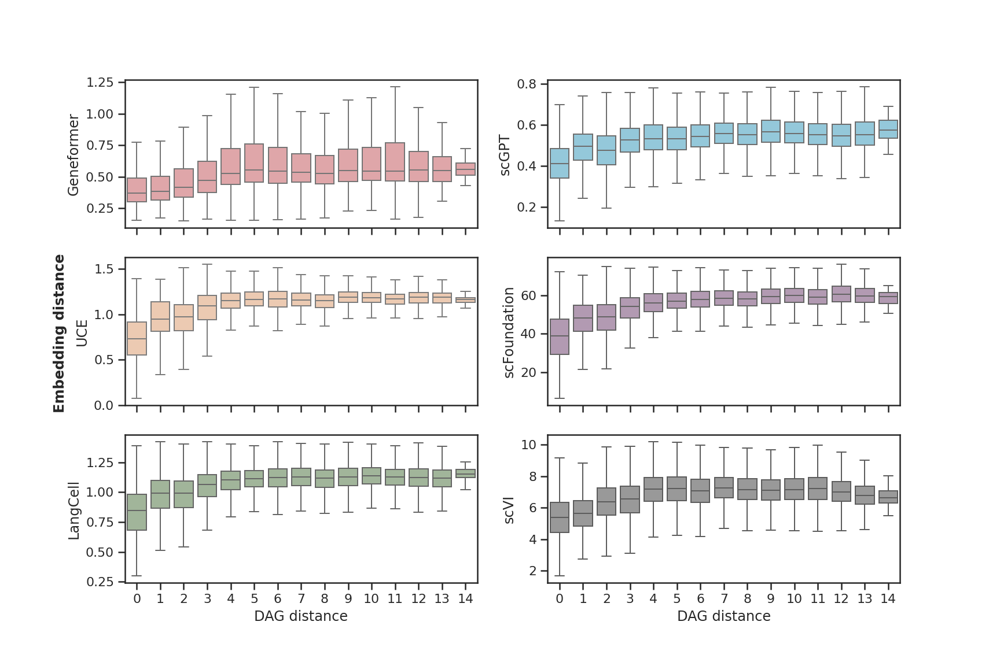

In [ ]:
sns.set_theme(style="ticks")
fig, axes = plt.subplots(3, 2, figsize=(12, 8), sharex=True, sharey=False)
pal = sns.color_palette("tab20", 20)
for i, model in enumerate(model_order_wo_hvg):
    if model != "HVG":
        sns.boxplot(result_df, y=model, x="DAG distance", showfliers=False, ax=axes[i//2,i%2], 
                    color=custom_palette[model]
                    )
fig.text(0.06, 0.5, 'Embedding distance', ha='center', va='center', rotation='vertical', fontsize=12, fontweight="bold")
plt.savefig("../figures/clustering/emb_distance_distribution.png", dpi=300)

## Overall ranking

#### scIB

In [ ]:
pd.set_option('display.precision', 4) 
df_all = pd.DataFrame()
for dataset in cluster_datasets:
    df = pd.DataFrame()
    for model in cluster_models:
        result_path = os.path.join(output_folder, dataset, dataset_info_dict[dataset]["layer_key"], model, "clustering_metrics.csv")
        df_ = pd.read_csv(result_path, index_col=0)
        df_.rename(columns=model_map_dict, inplace=True)
        df = pd.concat([df, df_], axis=1)
    # df["Dataset"] = dataset_map_dict[dataset]
    df_all = pd.concat([df_all, df])
df_all

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
NMI_cluster/label,0.8245,0.9055,0.9158,0.9118,0.3706,0.6229,0.5934,0.5631,0.5657,0.7986
ARI_cluster/label,0.7655,0.9383,0.9457,0.9425,0.1510,0.4046,0.4068,0.3705,0.3214,0.7809
ASW_label,0.5660,0.5684,0.6908,0.6371,0.3742,0.5307,0.5482,0.5260,0.5165,0.6148
graph_conn,0.9634,0.9918,0.9861,0.9802,0.6935,0.9161,0.9136,0.8761,0.8681,0.9445
ASW_label/batch,0.9396,0.8708,0.8429,0.8454,0.5306,0.8494,0.8412,0.7929,0.7921,0.8643
avg_bio,0.7187,0.8040,0.8508,0.8305,0.2986,0.5194,0.5161,0.4865,0.4679,0.7314
avg_batch,0.9515,0.9313,0.9145,0.9128,0.6121,0.8827,0.8774,0.8345,0.8301,0.9044
overall,0.8118,0.8549,0.8763,0.8634,0.4240,0.6647,0.6606,0.6257,0.6128,0.8006
NMI_cluster/label,0.6736,0.8160,0.8129,0.7166,0.6200,0.6446,0.7732,0.6466,0.6836,0.7048
ARI_cluster/label,0.4835,0.8268,0.8209,0.6144,0.4481,0.5333,0.7212,0.2730,0.3875,0.4227


In [ ]:
df_all_grouped = df_all.groupby(level=0).mean()
df_all_grouped

,HVG,scVI,Harmony,Seurat_v5(CCA),Geneformer,scGPT,UCE,scFoundation,LangCell,scCello
ARI_cluster/label,0.5419,0.6822,0.6422,0.5451,0.3434,0.4527,0.5023,0.3651,0.3722,0.5627
ASW_label,0.5187,0.5308,0.5567,0.5297,0.4587,0.5179,0.5477,0.5417,0.5229,0.5833
ASW_label/batch,0.9339,0.8684,0.8375,0.7936,0.7870,0.8840,0.8422,0.8304,0.8580,0.8326
NMI_cluster/label,0.7339,0.7979,0.7602,0.6958,0.5849,0.6707,0.7093,0.6594,0.6618,0.7471
avg_batch,0.9334,0.9108,0.8834,0.8283,0.8102,0.8935,0.8870,0.8711,0.8746,0.8870
avg_bio,0.5982,0.6703,0.6530,0.5902,0.4623,0.5471,0.5865,0.5221,0.5190,0.6310
graph_conn,0.9329,0.9532,0.9292,0.8630,0.8334,0.9031,0.9319,0.9118,0.8912,0.9414
overall,0.7323,0.7665,0.7452,0.6855,0.6015,0.6857,0.7067,0.6617,0.6612,0.7334


In [ ]:
keys = df_all_grouped.columns
values = df_all_grouped.loc[["avg_batch", "avg_bio"],:].values.transpose(1,0)
population = {k:v for k,v in zip(keys, values)}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'scVI']
Front 2: ['Harmony', 'scGPT', 'scCello']
Front 3: ['Seurat_v5(CCA)', 'UCE']
Front 4: ['scFoundation', 'LangCell']
Front 5: ['Geneformer']


### scGraph

In [ ]:
df = pd.DataFrame()
for dataset in ["HLCA_core", "Tabula_Sapiens_all", "AIDA_v2_new"]:
    df_ = pd.read_csv(f"{output_folder}/scGraph/{dataset}.csv", index_col=0)
    df_["Dataset"] = dataset_map_dict[dataset]
    df = pd.concat([df, df_], axis=0)
df["Model"] = df.index
df["Model"] = df["Model"].apply(lambda x: model_map_dict.get(x, x))
df

,Rank-Counts,Pearson-Counts,Rank-PCA,Pearson-PCA,Rank-OntoRWR,Pearson-OntoRWR,Dataset,Model
X_geneformer,7.1915,0.7290,7.1915,0.6601,7.6400,0.6967,HLCA,Geneformer
X_harmony,10.6383,0.4202,10.6383,0.3200,12.5600,0.4481,HLCA,Harmony
X_hvg,12.4681,0.8166,12.4681,0.8957,14.3600,0.7656,HLCA,HVG
X_langcell,11.8298,0.8370,11.8298,0.6425,13.0800,0.7719,HLCA,LangCell
X_scanvi_emb,15.9149,0.7776,15.9149,0.6275,17.5200,0.7350,HLCA,X_scanvi_emb
X_scbert,0.7234,0.3943,0.7234,0.1852,0.8000,0.2665,HLCA,X_scbert
X_sccello,12.7660,0.6765,12.7660,0.7378,13.4800,0.7560,HLCA,scCello
X_scgpt,14.8936,0.7759,14.8936,0.7022,16.0800,0.7311,HLCA,scGPT
X_scvi,12.7234,0.7960,12.7234,0.6497,13.8800,0.7467,HLCA,scVI
X_scvi_hvg_wo_batchkey,12.8936,0.7672,12.8936,0.6714,14.7200,0.7372,HLCA,X_scvi_hvg_wo_batchkey


In [ ]:
df_grouped = df.groupby("Model")[["Pearson-PCA", "Pearson-OntoRWR"]].agg("mean")
df_grouped

,Pearson-PCA,Pearson-OntoRWR
Model,,
Geneformer,0.6622,0.5444
HVG,0.8608,0.6534
Harmony,0.5791,0.4750
LangCell,0.6639,0.7025
Seurat_v5(CCA),0.7051,0.4494
UCE,0.6949,0.7156
X_pca,0.5818,0.3915
X_scanvi_emb,0.6275,0.7350
X_scbert,0.2686,0.2155


In [ ]:
population = {k: df_grouped.loc[k].values for k in model_order}
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

Front 1: ['HVG', 'UCE', 'scFoundation']
Front 2: ['scGPT', 'LangCell', 'scCello']
Front 3: ['Seurat_v5(CCA)', 'scVI', 'Geneformer']
Front 4: ['Harmony']


In [ ]:
population

{'HVG': array([0.86083987, 0.65343916]),
 'scVI': array([0.62221239, 0.63798024]),
 'Harmony': array([0.57912762, 0.47503534]),
 'Seurat_v5(CCA)': array([0.70510831, 0.44935086]),
 'Geneformer': array([0.66224436, 0.54440826]),
 'scGPT': array([0.7406948 , 0.63531977]),
 'UCE': array([0.69491122, 0.71564184]),
 'scFoundation': array([0.69717792, 0.70335758]),
 'LangCell': array([0.66390209, 0.70248275]),
 'scCello': array([0.69162627, 0.68954467])}

# Cell type annotation

## Define functions

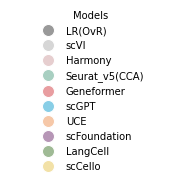

In [13]:
from matplotlib.lines import Line2D
model_names = [model_map_dict.get(model, model) for model in annotation_models]
# 使用一个预设的 Matplotlib 调色板
colors = plt.get_cmap('tab10').colors

# 2. 为图注创建 "代理" 图形元素 (Proxy Artists)
#    我们使用 Line2D 对象来创建带标记的图注条目
legend_elements = [Line2D([0], [0], marker='o', color='w', 
                   label=model, markerfacecolor=custom_palette[model], markersize=12)
                   for i, model in enumerate(model_names)]

# 3. 创建一个空白图窗和坐标轴
fig, ax = plt.subplots(figsize=(3, 2.5)) # figsize 控制了图注的可用空间和字体大小的相对关系

# 4. 关闭坐标轴，我们不希望看到坐标轴的框和刻度
ax.axis('off')

legend = fig.legend(handles=legend_elements, 
                    loc='center', 
                    frameon=False, 
                    title="Models",
                    ncol=1)

# 6. 保存图注为独立的图片
#    - bbox_inches='tight': 自动裁剪图片，使其紧密地包围图注
#    - pad_inches=0.1: 在裁剪的边界外留出一点空白
#    - transparent=True: 背景设置为透明
plt.savefig(
    '../figures/cell_annotation/legend.png', 
    dpi=300, 
    bbox_inches='tight', 
    pad_inches=0.1,
    transparent=True
)

In [14]:
from matplotlib.ticker import FormatStrFormatter
def plot_violin(ax, x, y, data, hue, order, palette, xlabel, median_value):
    # sns.violinplot(x=x, y=y, data=data, hue=hue, width=0.5, alpha=0.8, ax=ax, order=order, palette=palette)
    sns.boxplot(x=x, y=y, data=data, hue=hue, width=0.5, ax=ax, order=order, palette=palette, 
                flierprops=dict(marker='o', color='black', markersize=2, linestyle='none'))
    ax.axvline(x=median_value, color='r', linestyle=':')
    ax.set_ylabel("")
    ax.tick_params(axis='x', labelsize=8)
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.2f'))
    ax.set_xlabel(xlabel, fontweight="bold", fontsize=8)

    ax.set_yticklabels([])
    # ax.tick_params(axis='y', labelsize=8)
    ax.tick_params(axis='y', length=0)

    for i, model_name in enumerate(order):
        ax.plot(-0.1, i, 's', 
                transform=ax.get_yaxis_transform(),
                color=palette.get(model_name, 'gray'), 
                markersize=8,
                clip_on=False)
    

def get_model_order(df, column, ascending=False):
    median_values = df.groupby('model')[column].median().sort_values(ascending=ascending)
    return median_values.index.tolist() 

In [15]:
def plot_annotation_cv_results(df_all, dataset_name, save=False):
    fig, axes = plt.subplots(1, 4, figsize=(9, 3))

    for i, col in enumerate(["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]):
        model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
        plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                    col, df_all[col].median())
        
    # plt.tight_layout()
    fig.subplots_adjust(wspace=0.2)
    if save:
        plt.savefig(f"../figures/cell_annotation/cross_validation/{dataset_name}.png", dpi=300, bbox_inches="tight")

In [16]:
def plot_annotation_cv_results_all(df_all, dataset_name, save=False):
    fig, axes = plt.subplots(1, 4, figsize=(9, 3))

    for i, col in enumerate(["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]):
        model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
        plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                    col, df_all[col].median())
        
    # plt.tight_layout()
    fig.subplots_adjust(wspace=0.2)
    if save:
        plt.savefig(f"../figures/cell_annotation/cross_validation/{dataset_name}.png", dpi=300, bbox_inches="tight")

In [ ]:
def compute_broken_xlims(all_x, threshold=0.1, margin=0.01):
    x_values = np.sort(np.unique(all_x))
    x_diffs = np.diff(x_values)
    gap_idx = np.argmax(x_diffs)
    gap_start = x_values[gap_idx]
    gap_end = x_values[gap_idx+1]
    if x_diffs[gap_idx] > threshold:
        return (
            (x_values[0]-margin, gap_start+margin),
            (gap_end-margin, x_values[-1]+margin)
        )
    else:
        return ((x_values[0], x_values[-1]),)

def plot_annotation_cv_results_all(result_df, metric, save=False):
    from brokenaxes import brokenaxes

    avg_result = result_df.groupby(['model', 'Dataset'])[metric].mean().reset_index()
    overall_result = result_df.groupby('model')[metric].mean().reset_index()
    overall_result['type'] = 'Average'

    # order the models by overall performance
    model_order = overall_result.sort_values(metric, ascending=True)['model'].tolist()
    print(model_order)
    avg_result['model'] = pd.Categorical(avg_result['model'], categories=model_order, ordered=True)
    overall_result['model'] = pd.Categorical(overall_result['model'], categories=model_order, ordered=True)
    # 建立 model → index 的映射
    model_to_idx = {model: idx for idx, model in enumerate(model_order)}
    print(model_to_idx)
    avg_result['model_idx'] = avg_result['model'].map(model_to_idx)
    overall_result['model_idx'] = overall_result['model'].map(model_to_idx)

    datasets = sorted(result_df['Dataset'].unique())
    ratio_palette = sns.color_palette("viridis", n_colors=len(datasets))
    
    fig = plt.figure(figsize=(7,6))
    all_x = pd.concat([
        avg_result[metric],
        overall_result[metric]
    ])

    xlims = compute_broken_xlims(all_x, threshold=0.1)
    print(xlims)
    bax = brokenaxes(xlims=xlims, hspace=0.)

    overall_result_sorted = overall_result.sort_values('model')
    bax.plot(
        overall_result_sorted[metric],
        overall_result_sorted['model_idx'],
        color='crimson',
        linestyle='--',
        linewidth=1.5,
        zorder=4
    )

    for i, dataset in enumerate(datasets):
        ratio_data = avg_result[avg_result['Dataset'] == dataset]
        bax.scatter(
            data=ratio_data,
            x=metric,
            y='model_idx',
            color=ratio_palette[i],
            s=150,
            label=f'Dataset: {dataset}',
            alpha=0.8,
            edgecolors='w'
        )

    bax.scatter(
        data=overall_result_sorted,
        x=metric,
        y='model_idx',
        color='crimson',
        marker='*',
        s=400,
        label='Average (All Datasets)',
        zorder=5
    )

    bax.set_xlabel(metric, fontsize=14, fontweight='bold', labelpad=20)
    bax.set_ylim(-0.5, len(model_order))
    yticks = np.arange(len(model_order))
    plt.yticks(yticks, model_order, fontsize=12)
    for ax in bax.axs:
        ax.set_yticks(yticks)
        ax.set_yticklabels(model_order, fontsize=12)
        # Ensure all ticks are shown
        ax.yaxis.set_major_locator(plt.FixedLocator(yticks))
        ax.yaxis.set_major_formatter(plt.FixedFormatter(model_order))
        
        # # 禁用自动标签间隔
        # ax.yaxis.set_tick_params(which='major', pad=5)
        # # 确保不被matplotlib的自动调整覆盖
        # ax.yaxis.get_major_locator().set_params(nbins='auto')
        
        # # 添加这行强制显示所有标签
        # ax.tick_params(axis='y', which='major', labelsize=12)

    bax.legend(
        frameon=False,
        fontsize=12,
        loc='upper left',
    )

    bax.grid(True, axis='y', zorder=0, ls=":")
    bax.grid(True, axis='x', zorder=0, ls=":")

In [18]:
def get_unseen_result(dataset_name, output_folder):
    result_ls = []
    for unseen_ratio in [0.1, 0.3, 0.5, 0.7, 0.9]:
        for model in annotation_models:
            if "LR" not in model:
                params = model_to_params[dataset_name][model]
                lr, l2 = float(params["lr"]), float(params["l2"])
                result_folder = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.2")
            else:
                result_folder = os.path.join(output_folder, model, dataset_name, "testset_0.2")
            for iter in range(5):
                result_file = os.path.join(result_folder, f"{iter}/{unseen_ratio}/pred_label.csv")
                df = pd.read_csv(result_file)
                y_true = df["y_true"]
                y_pred = df["y_pred"]

                result = {
                    "model": model_map_dict.get(model, model),
                    "unseen_ratio": unseen_ratio,
                    "iter": iter,
                }

                if "LR" not in model:
                    for FPR in [0.05, 0.1, 0.2]:
                        cut_off_ratio, number_unkonw = get_FPR(df[df["unseen"]==1].negative_energy, FPR=FPR)
                        acc_unknown = accuracy_for_unkonw(y_pred, df["negative_energy"], y_true, number_unkonw, cut_off_ratio=cut_off_ratio)
                        result.update({f"Accuracy(FPR={FPR})": acc_unknown})

                    auroc_softmax = roc_auc_score(1-df["unseen"], df["softmax_score"])
                    auprc_softmax = average_precision_score(1-df["unseen"], df["softmax_score"])
                    auroc_energy = roc_auc_score(1-df["unseen"], df["negative_energy"])
                    auprc_energy = average_precision_score(1-df["unseen"], df["negative_energy"])
                    result.update({
                        "AUROC(softmax)": auroc_softmax,
                        "AUPRC(softmax)": auprc_softmax,
                        "AUROC(energy)": auroc_energy,
                        "AUPRC(energy)": auprc_energy
                    })
                else:
                    for FPR in [0.05, 0.1, 0.2]:
                        cut_off_ratio, number_unkonw = get_FPR(df[df["unseen"]==1].y_prob, FPR=FPR)
                        acc_unknown = accuracy_for_unkonw(y_pred, df["y_prob"], y_true, number_unkonw, cut_off_ratio=cut_off_ratio)
                        result.update({f"Accuracy(FPR={FPR})": acc_unknown})
                
                result_ls.append(result)
    result_df = pd.DataFrame(result_ls)
    return result_df

def plot_unseen_accuracy(result_df, dataset_name, FPR=0.01, save=False):
    # --- 2. 数据处理 ---
    # 计算每个模型在每个unseen_ratio下的平均精度
    avg_ratio_accuracy = result_df.groupby(['model', 'unseen_ratio'])[f'Accuracy(FPR={FPR})'].mean().reset_index()

    # 计算每个模型在所有unseen_ratio下的总平均精度
    avg_overall_accuracy = result_df.groupby('model')[f'Accuracy(FPR={FPR})'].mean().reset_index()
    # 为了在图例中区分，我们添加一个标识列
    avg_overall_accuracy['type'] = 'Average'

    # --- 新增：根据平均精度对Y轴模型进行排序 ---
    # 1. 基于总平均精度，创建一个从差到好的模型顺序列表
    model_order = avg_overall_accuracy.sort_values(f'Accuracy(FPR={FPR})', ascending=True)['model'].tolist()

    # 2. 将这个顺序应用到两个DataFrame中，将'model'列转换为有序分类类型
    #    这样绘图时就会自动按照这个顺序排列Y轴
    avg_ratio_accuracy['model'] = pd.Categorical(avg_ratio_accuracy['model'], categories=model_order, ordered=True)
    avg_overall_accuracy['model'] = pd.Categorical(avg_overall_accuracy['model'], categories=model_order, ordered=True)

    # --- 3. 开始绘图 ---
    fig, ax = plt.subplots(figsize=(8,6)) # 创建一个大一点的画布

    # 定义unseen_ratio的颜色和形状
    unique_ratios = sorted(result_df['unseen_ratio'].unique())
    ratio_palette = sns.color_palette("viridis", n_colors=len(unique_ratios))
    # --- 修正：调整绘图顺序以确保Y轴排序正确 ---

    # c. 首先绘制虚线，以强制建立正确的Y轴顺序
    # 对数据进行排序，确保连线顺序与Y轴顺序一致
    avg_overall_accuracy_sorted = avg_overall_accuracy.sort_values('model')
    ax.plot(
        avg_overall_accuracy_sorted[f'Accuracy(FPR={FPR})'],
        avg_overall_accuracy_sorted['model'],
        color='crimson',
        linestyle='--',
        linewidth=1.5,
        zorder=4
    )

    # a. 接着绘制每个unseen_ratio的平均精度点
    # 绘图函数会自动识别'model'列的有序分类并正确排序
    for i, ratio in enumerate(unique_ratios):
        ratio_data = avg_ratio_accuracy[avg_ratio_accuracy['unseen_ratio'] == ratio]
        ax.scatter(
            data=ratio_data,
            x=f'Accuracy(FPR={FPR})',
            y='model',
            color=ratio_palette[i],
            s=150,
            label=f'Unseen Ratio: {ratio}',
            alpha=0.8,
            edgecolors='w'
        )

    # b. 最后绘制每个模型的总平均精度点，以确保它们在最上层
    ax.scatter(
        data=avg_overall_accuracy,
        x=f'Accuracy(FPR={FPR})',
        y='model',
        color='crimson',
        marker='*',
        s=400,
        label='Average (All Ratios)',
        zorder=5
    )

    # --- 4. 美化图表 ---
    ax.set_title(dataset_name, fontsize=18, pad=10, fontweight='bold')
    ax.set_xlabel(f'Accuracy (FPR={FPR})', fontsize=16, fontweight='bold')
    # ax.tick_params(axis='both', which='major', labelsize=16)
    ax.tick_params(axis='x', which='major', labelsize=16)
    ax.set_yticklabels([])
    ax.tick_params(axis='y', length=0)

    for i, model_name in enumerate(model_order):
        ax.plot(-0.03, i, 's',
                transform=ax.get_yaxis_transform(),
                color=custom_palette.get(model_name, 'gray'), 
                markersize=12,
                clip_on=False)
        
    ax.legend(
        frameon=False,
        loc='upper left',
        borderaxespad=0.,
        fontsize=12,
        title_fontsize=13
    )

    plt.tight_layout(rect=[0, 0, 0.85, 1])
    ax.grid(True, axis='y', zorder=0, ls=":")
    ax.grid(True, axis='x', zorder=0, ls=":")

    if save:
        plt.savefig(f"../figures/cell_annotation/novel_cells/{dataset_name}_accuracy_fpr_{FPR}.png", dpi=300, bbox_inches='tight')

In [21]:
def get_heatmap_df(result_grouped, metric, improve_col):
    metric_pivot = result_grouped.pivot(index='model1', columns='model2', values=metric)
    improve_pivot = result_grouped.pivot(index='model1', columns='model2', values=improve_col)

    metric_full = metric_pivot.combine_first(metric_pivot.T)
    improve_full = improve_pivot.combine_first(improve_pivot.T)

    diag_values = result_grouped[result_grouped['model1'] == result_grouped['model2']].set_index('model1')[metric]
    for model_name in metric_full.index:
        metric_full.loc[model_name, model_name] = diag_values.get(model_name, np.nan)

    mask = np.triu(np.ones_like(metric_full, dtype=bool))

    heatmap_df = pd.DataFrame(np.where(mask, metric_full, improve_full),
                            index=metric_full.index,
                            columns=metric_full.columns)

    heatmap_df = heatmap_df.astype(float)
    return heatmap_df

def plot_ensemble_heamtmap(heatmap_df, metric, source_dname, target_dname, save=False):
    data = heatmap_df.values
    mask_upper = np.triu(np.ones_like(data, dtype=bool))
    mask_lower = np.tril(np.ones_like(data, dtype=bool),k=-1)

    fig, ax = plt.subplots(figsize=(6, 5))
    sns.heatmap(data, mask=mask_upper, cmap='Blues', annot=True, annot_kws={"fontsize": 10}, fmt=".3f",
                square=True, ax=ax, cbar=False) 

    sns.heatmap(data, mask=mask_lower, cmap='Reds', annot=True, annot_kws={"fontsize": 10}, fmt=".3f",
                xticklabels=heatmap_df.index, yticklabels=heatmap_df.index,
                square=True, ax=ax, cbar=False)

    # 绘制colorbar
    fig.subplots_adjust(right=0.8)
    cax1 = fig.add_axes([0.82, 0.1, 0.03, 0.35])
    cb1 = fig.colorbar(ax.collections[0], cax=cax1)
    cb1.set_label("Improvement", fontsize=10)

    cax2 = fig.add_axes([0.82, 0.5, 0.03, 0.35])
    cb2 = fig.colorbar(ax.collections[1], cax=cax2)
    cb2.set_label(metric, fontsize=10)

    models = [label.get_text() for label in ax.get_yticklabels()]
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    for i, model_name in enumerate(models):
            ax.plot(-0.05, i+0.5, 's', 
                    transform=ax.get_yaxis_transform(),
                    color=custom_palette.get(model_name, 'gray'), 
                    markersize=10,
                    clip_on=False)
            ax.plot(i+0.5, -0.05, 's', 
                    transform=ax.get_xaxis_transform(),
                    color=custom_palette.get(model_name, 'gray'), 
                    markersize=10,
                    clip_on=False)
        
    ax.set_title(f"Transfer from {dataset_map_dict[source_dname]} to {dataset_map_dict[target_dname]}", fontsize=12, fontweight='bold')

    if save:
        plt.savefig(f"../figures/cell_annotation/model_ensemble/{source_dname}_to_{target_dname}_ensemble_{metric}.png", dpi=300, bbox_inches='tight')

## Aggregate all datasets

In [23]:
def get_anno_cv_result(dataset_name):
    df_all = pd.DataFrame()
    for model in annotation_models:
        if "LR" not in model:
            params = model_to_params[dataset_name][model]
            lr, l2 = float(params["lr"]), float(params["l2"])
            result_path = os.path.join("../OnClass/results_best_params", model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_0.csv")
        else:
            result_path = os.path.join("../OnClass/results_best_params", model, dataset_name, "testset_0.8/all_metrics_unseen_0.csv")

        df = pd.read_csv(result_path).iloc[:-2, :]
        df["model"] = model_map_dict.get(model, model)
        df_all = pd.concat([df_all, df])
    return df_all

df_all = pd.DataFrame()
for dataset_name in ["Tabula_Sapiens_all", "HLCA_core", "AIDA_v2_new"]:
    df = get_anno_cv_result(dataset_name)
    df["Dataset"] = dataset_map_dict[dataset_name]
    df_all = pd.concat([df_all, df])
df_all.head()

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model,Dataset
0,0.991679,0.985358,0.991679,0.985358,NaN,NaN,0.888491,0.976328,0.988830,0.891966,0.775173,0.701600,0.825040,0.883167,NaN,0.437766,2.166130,LR(OvR),Tabula Sapiens
1,0.993127,0.987513,0.993127,0.987513,NaN,NaN,0.890548,0.976788,0.989332,0.893957,0.773955,0.694498,0.830377,0.885179,NaN,0.431764,2.167017,LR(OvR),Tabula Sapiens
2,0.993485,0.986674,0.993485,0.986674,NaN,NaN,0.890354,0.976245,0.989058,0.893772,0.778420,0.707514,0.825147,0.885301,NaN,0.426042,2.118609,LR(OvR),Tabula Sapiens
3,0.992705,0.987123,0.992705,0.987123,NaN,NaN,0.888992,0.976240,0.988849,0.892449,0.767810,0.686176,0.824894,0.883943,NaN,0.437603,2.161264,LR(OvR),Tabula Sapiens
4,0.992477,0.986369,0.992477,0.986369,NaN,NaN,0.890659,0.976333,0.988872,0.894069,0.777955,0.703617,0.829340,0.884964,NaN,0.442446,2.155185,LR(OvR),Tabula Sapiens


['Seurat_v5(CCA)', 'Geneformer', 'scGPT', 'Harmony', 'scCello', 'LangCell', 'scVI', 'LR(OvR)', 'UCE', 'scFoundation']
{'Seurat_v5(CCA)': 0, 'Geneformer': 1, 'scGPT': 2, 'Harmony': 3, 'scCello': 4, 'LangCell': 5, 'scVI': 6, 'LR(OvR)': 7, 'UCE': 8, 'scFoundation': 9}
((0.6176754377820282, 0.6376754377820282), (0.7898990965794689, 0.9686303148328466))


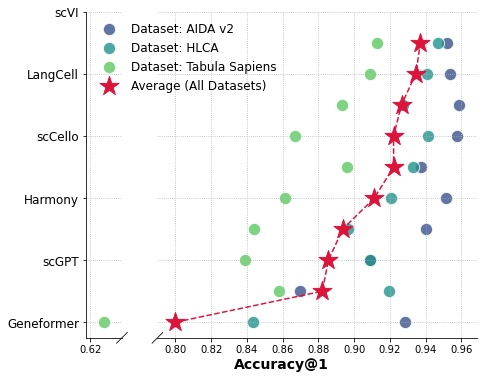

In [52]:
# for metric in ["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]:
#     plot_annotation_cv_results_all(df_all, metric)

plot_annotation_cv_results_all(df_all, "Accuracy@1")

## HLCA

### unseen_ratio = 0
result folder: lr_0.001_l2_1e-06_tesetset_0.2 or lr_0.001_l2_1e-06_tesetset_0.8
1. macro-f1 score (分段), already saved in all_metrics_unseen_0.csv
2. recalculate accuracy score when unseen_ratio > 0
3. compare training data 80% v.s. 20%

In [138]:
dataset_name = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in annotation_models:
    if "LR" not in model:
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_0.csv")
    else:
        result_path = os.path.join(output_folder, model, dataset_name, "testset_0.8/all_metrics_unseen_0.csv")

    df = pd.read_csv(result_path).iloc[:-2, :]
    df["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, df])
df_all.head()

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model
0,0.998394,0.996089,0.998394,0.996089,NaN,NaN,0.921227,0.994559,0.998169,0.927269,0.908320,0.867737,0.909216,0.914140,0.918426,0.631118,2.456387,LR(OvR)
1,0.998118,0.995553,0.998118,0.995553,NaN,NaN,0.921691,0.994615,0.998263,0.927699,0.907888,0.867522,0.908041,0.913842,0.918893,0.640860,2.479698,LR(OvR)
2,0.998498,0.996139,0.998498,0.996139,NaN,NaN,0.921144,0.994568,0.998072,0.927196,0.906182,0.856579,0.905883,0.915244,0.917876,0.639368,2.448888,LR(OvR)
3,0.997720,0.995453,0.997720,0.995453,NaN,NaN,0.922045,0.994499,0.998178,0.928026,0.909363,0.878783,0.907465,0.915102,0.919130,0.663979,2.448730,LR(OvR)
4,0.998464,0.996149,0.998464,0.996149,NaN,NaN,0.921797,0.994552,0.998178,0.927795,0.907107,0.859811,0.906688,0.915744,0.918479,0.635080,2.379687,LR(OvR)


In [139]:
df_grouped = df_all.groupby("model").agg("mean")
df_grouped

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD
model,,,,,,,,,,,,,,,,,
Geneformer,0.998006,0.995017,0.998006,0.995017,NaN,NaN,0.912534,0.993937,0.998053,0.919291,0.851807,0.711868,0.822489,0.888005,0.915123,0.568435,2.402032
Harmony,0.997216,0.992880,0.997216,0.992880,NaN,NaN,0.887842,0.992533,0.998058,0.896510,0.821597,0.606814,0.792340,0.880538,0.888118,0.642323,2.424988
LR(OvR),0.998239,0.995877,0.998239,0.995877,NaN,NaN,0.921581,0.994559,0.998172,0.927597,0.907772,0.866086,0.907459,0.914814,0.918561,0.642081,2.442678
LangCell,0.998552,0.996540,0.998552,0.996540,NaN,NaN,0.927358,0.995150,0.998363,0.932941,0.890077,0.821615,0.871115,0.906470,0.930531,0.583826,2.370293
Seurat_v5(CCA),0.993687,0.984580,0.993687,0.984580,NaN,NaN,0.830281,0.980553,0.993291,0.843507,0.759360,0.460348,0.730551,0.850676,0.818705,0.675175,2.786774
UCE,0.999026,0.997597,0.999026,0.997597,NaN,NaN,0.936134,0.996376,0.998869,0.941036,0.913813,0.862744,0.904399,0.926501,0.935613,0.604111,2.414179
scCello,0.997877,0.994900,0.997877,0.994900,NaN,NaN,0.914210,0.993460,0.997789,0.920793,0.864274,0.755677,0.840171,0.891182,0.917380,0.749744,2.220320
scFoundation,0.998889,0.997549,0.998889,0.997549,NaN,NaN,0.942248,0.996591,0.998851,0.946687,0.918961,0.873533,0.904725,0.934257,0.941864,0.591330,2.408228
scGPT,0.998055,0.994591,0.998055,0.994591,NaN,NaN,0.901502,0.992335,0.997407,0.909093,0.853508,0.720564,0.843448,0.874213,0.905272,0.583220,2.416374


In [140]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.91929082,  0.85180745, -2.40203178]), 'Harmony': array([ 0.89651045,  0.82159688, -2.4249877 ]), 'LR(OvR)': array([ 0.92759686,  0.90777201, -2.4426778 ]), 'LangCell': array([ 0.93294058,  0.89007702, -2.37029303]), 'Seurat_v5(CCA)': array([ 0.8435073 ,  0.75935976, -2.78677423]), 'UCE': array([ 0.94103581,  0.91381305, -2.41417927]), 'scCello': array([ 0.92079262,  0.86427445, -2.22031969]), 'scFoundation': array([ 0.94668708,  0.91896087, -2.40822818]), 'scGPT': array([ 0.90909333,  0.85350831, -2.41637356]), 'scVI': array([ 0.94150091,  0.91122556, -2.42510815])}
Front 1: ['LangCell', 'scCello', 'scFoundation']
Front 2: ['Geneformer', 'UCE']
Front 3: ['scGPT', 'scVI']
Front 4: ['Harmony', 'LR(OvR)']
Front 5: ['Seurat_v5(CCA)']


In [141]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.91929082, 0.85180745]), 'Harmony': array([0.89651045, 0.82159688]), 'LR(OvR)': array([0.92759686, 0.90777201]), 'LangCell': array([0.93294058, 0.89007702]), 'Seurat_v5(CCA)': array([0.8435073 , 0.75935976]), 'UCE': array([0.94103581, 0.91381305]), 'scCello': array([0.92079262, 0.86427445]), 'scFoundation': array([0.94668708, 0.91896087]), 'scGPT': array([0.90909333, 0.85350831]), 'scVI': array([0.94150091, 0.91122556])}
Front 1: ['scFoundation']
Front 2: ['UCE']
Front 3: ['scVI']
Front 4: ['LR(OvR)', 'LangCell']
Front 5: ['scCello']
Front 6: ['Geneformer', 'scGPT']
Front 7: ['Harmony']
Front 8: ['Seurat_v5(CCA)']


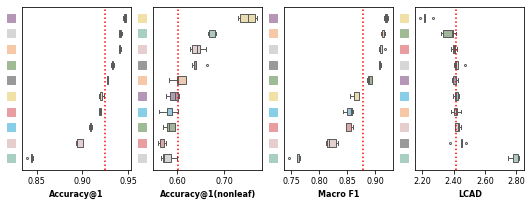

In [142]:
plot_annotation_cv_results(df_all, "HLCA")

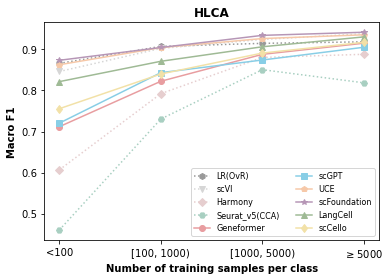

In [19]:
x = np.arange(4)
for i, model_name in enumerate(df_all["model"].unique()):
    y = df_all[df_all["model"]==model_name].values[:, -8:-4].mean(0).tolist()
    plt.plot(x, y, 
             color=custom_palette[model_name], 
             label=model_name, 
             marker=custom_shape[model_name],
             ls="-" if model_name in model_order_scFM else ":")
    # plt.scatter(x, y, color=custom_palette[model_name])
plt.xticks(x, labels=['<100', '[100, 1000)', '[1000, 5000)', '$\geq$5000'])
plt.xlabel("Number of training samples per class", fontweight="bold")
plt.ylabel("Macro F1", fontweight="bold")
plt.legend(ncol=2, fontsize=8)
plt.title("HLCA", fontweight="bold")
plt.savefig("../figures/cell_annotation/cross_validation/HLCA_macrof1_detailed.png", dpi=300)

### unseen_ratio > 0

#### Confidence-adjusted confidence score
scBERT: evaluate the accuracy of novel cell type and known cell types, separately. Notably, we employed a strict evaluation method for novel cell types with the accuracy calculated on the union set of cells with the novel cell type label and the cells that are predicted as novel cell types

In [ ]:
dataset_name = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
result_df = get_unseen_result(dataset_name, output_folder)
result_df.head()

In [157]:
# result_df.to_csv("../figures/cell_annotation/novel_cells/hlca_accuracy_unseen.csv",index=False)
result_df = pd.read_csv("../figures/cell_annotation/novel_cells/hlca_accuracy_unseen.csv")

In [158]:
df_grouped = result_df.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy(FPR=0.05)", "Accuracy(FPR=0.1)", "Accuracy(FPR=0.2)"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.36493527, 0.49370682, 0.67493186]), 'Harmony': array([0.22890517, 0.34468283, 0.52772547]), 'LR(OvR)': array([0.03509467, 0.13684795, 0.42070366]), 'LangCell': array([0.35338765, 0.51442581, 0.71887928]), 'Seurat_v5(CCA)': array([0.19609364, 0.30337998, 0.47526341]), 'UCE': array([0.45035753, 0.61514088, 0.80408696]), 'scCello': array([0.36307549, 0.51492854, 0.71194558]), 'scFoundation': array([0.37829598, 0.56082185, 0.75405769]), 'scGPT': array([0.33061169, 0.46212799, 0.66796988]), 'scVI': array([0.36867051, 0.52603342, 0.72424885])}
Front 1: ['UCE']
Front 2: ['scFoundation']
Front 3: ['scVI']
Front 4: ['Geneformer', 'LangCell', 'scCello']
Front 5: ['scGPT']
Front 6: ['Harmony']
Front 7: ['Seurat_v5(CCA)']
Front 8: ['LR(OvR)']


In [159]:
summary = result_df.groupby(["model", "unseen_ratio"]).agg({"Accuracy(FPR=0.05)": ['mean', 'std']}).reset_index()
summary.columns = ["model", "unseen_ratio", 'mean', 'std']
summary.head()

,model,unseen_ratio,mean,std
0,Geneformer,0.1,0.539212,0.166284
1,Geneformer,0.3,0.297197,0.142521
2,Geneformer,0.5,0.359899,0.141549
3,Geneformer,0.7,0.253615,0.102089
4,Geneformer,0.9,0.374754,0.247849


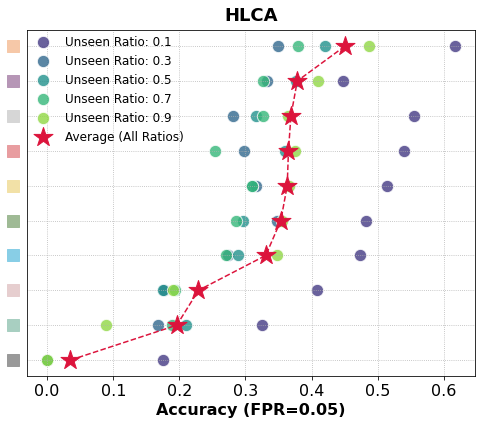

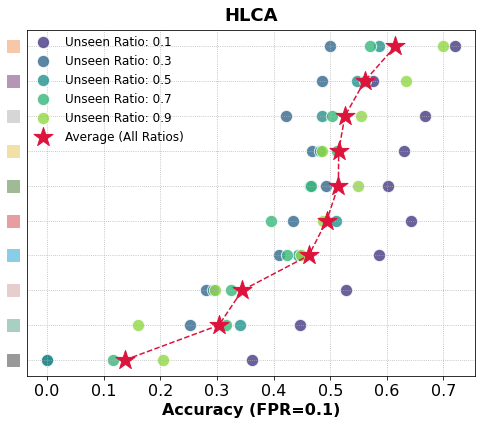

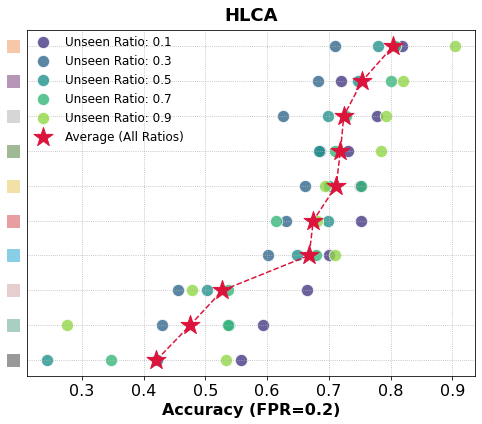

In [160]:
for FPR in [0.05, 0.1, 0.2]:
    plot_unseen_accuracy(result_df, "HLCA", FPR)

#### OOD detection

In [133]:
result_grouped = result_df.groupby(["model", "unseen_ratio"]).agg("mean").reset_index()
result_grouped = result_grouped[result_grouped["model"]!= "LR(OvR)"]
result_grouped.head()

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,Geneformer,0.1,2.0,0.539212,0.642138,0.751482,0.785736,0.908639,0.875784,0.948612
1,Geneformer,0.3,2.0,0.297197,0.433942,0.630379,0.785828,0.648783,0.820871,0.675153
2,Geneformer,0.5,2.0,0.359899,0.509680,0.698062,0.763662,0.534876,0.843521,0.638944
3,Geneformer,0.7,2.0,0.253615,0.395194,0.613959,0.789368,0.347100,0.821174,0.368536
4,Geneformer,0.9,2.0,0.374754,0.487579,0.680777,0.848997,0.171682,0.845428,0.200516


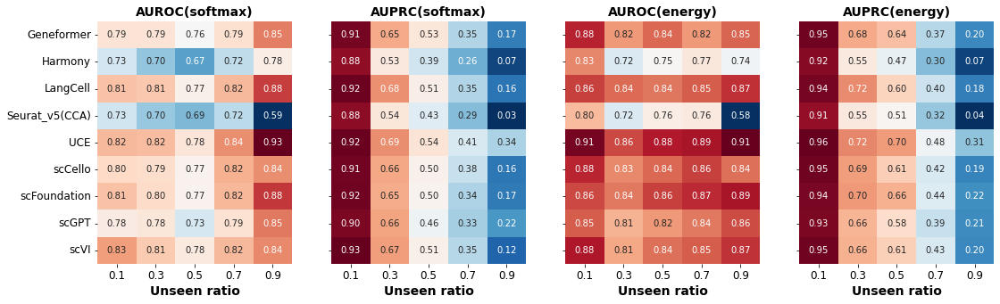

In [ ]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharex=True, sharey=False)

for i, col in enumerate(["AUROC(softmax)", "AUPRC(softmax)", "AUROC(energy)", "AUPRC(energy)"]):
    heatmap_df = result_grouped.pivot(index="model", columns="unseen_ratio", values=col)
    sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", ax=axes[i], fmt='.2f', cbar=False)
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Unseen ratio", fontweight="bold", fontsize=14)
    axes[i].set_title(col, fontweight="bold", fontsize=14)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].tick_params(axis='x', labelsize=12)
    if i > 0:
        axes[i].set_yticklabels("")
# plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.savefig("../figures/cell_annotation/novel_cells/hlca_confidence_iid_positive.png", dpi=300, bbox_inches='tight')

## Tabula Sapiens

### unseen_ratio = 0

In [146]:
dataset_name = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in annotation_models:
    if "LR" not in model:
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_0.csv")
    else:
        result_path = os.path.join(output_folder, model, dataset_name, "testset_0.8/all_metrics_unseen_0.csv")

    df = pd.read_csv(result_path).iloc[:-2, :]
    df["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, df])
df_all.head()

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model
0,0.991679,0.985358,0.991679,0.985358,NaN,NaN,0.888491,0.976328,0.988830,0.891966,0.775173,0.701600,0.825040,0.883167,NaN,0.437766,2.166130,LR(OvR)
1,0.993127,0.987513,0.993127,0.987513,NaN,NaN,0.890548,0.976788,0.989332,0.893957,0.773955,0.694498,0.830377,0.885179,NaN,0.431764,2.167017,LR(OvR)
2,0.993485,0.986674,0.993485,0.986674,NaN,NaN,0.890354,0.976245,0.989058,0.893772,0.778420,0.707514,0.825147,0.885301,NaN,0.426042,2.118609,LR(OvR)
3,0.992705,0.987123,0.992705,0.987123,NaN,NaN,0.888992,0.976240,0.988849,0.892449,0.767810,0.686176,0.824894,0.883943,NaN,0.437603,2.161264,LR(OvR)
4,0.992477,0.986369,0.992477,0.986369,NaN,NaN,0.890659,0.976333,0.988872,0.894069,0.777955,0.703617,0.829340,0.884964,NaN,0.442446,2.155185,LR(OvR)


In [147]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.85780208,  0.61623062, -2.178942  ]), 'Harmony': array([ 0.84404932,  0.67839983, -2.15421849]), 'LR(OvR)': array([ 0.89324247,  0.77466261, -2.15364066]), 'LangCell': array([ 0.896001  ,  0.7239172 , -2.10166349]), 'Seurat_v5(CCA)': array([ 0.62767544,  0.34660902, -2.70735551]), 'UCE': array([ 0.90902583,  0.78126821, -2.06411778]), 'scCello': array([ 0.86153646,  0.6450423 , -2.20969399]), 'scFoundation': array([ 0.9128577 ,  0.77673268, -2.02378273]), 'scGPT': array([ 0.83889157,  0.64134797, -2.27596735]), 'scVI': array([ 0.8670034 ,  0.68329797, -2.17155159])}
Front 1: ['UCE', 'scFoundation']
Front 2: ['LR(OvR)', 'LangCell']
Front 3: ['Harmony', 'scVI']
Front 4: ['Geneformer', 'scCello']
Front 5: ['scGPT']
Front 6: ['Seurat_v5(CCA)']


In [148]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.85780208, 0.61623062]), 'Harmony': array([0.84404932, 0.67839983]), 'LR(OvR)': array([0.89324247, 0.77466261]), 'LangCell': array([0.896001 , 0.7239172]), 'Seurat_v5(CCA)': array([0.62767544, 0.34660902]), 'UCE': array([0.90902583, 0.78126821]), 'scCello': array([0.86153646, 0.6450423 ]), 'scFoundation': array([0.9128577 , 0.77673268]), 'scGPT': array([0.83889157, 0.64134797]), 'scVI': array([0.8670034 , 0.68329797])}
Front 1: ['UCE', 'scFoundation']
Front 2: ['LR(OvR)', 'LangCell']
Front 3: ['scVI']
Front 4: ['Harmony', 'scCello']
Front 5: ['Geneformer', 'scGPT']
Front 6: ['Seurat_v5(CCA)']


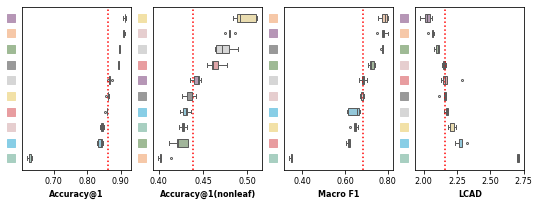

In [149]:
plot_annotation_cv_results(df_all, "Tabula", save=True)

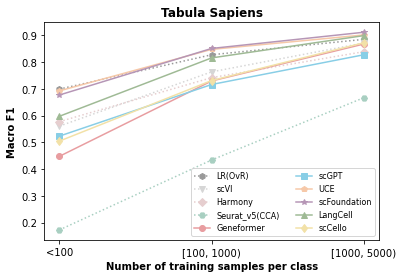

In [37]:
x = np.arange(3)
for i, model_name in enumerate(df_all["model"].unique()):
    y = df_all[df_all["model"]==model_name].values[:, -8:-5].mean(0).tolist()
    plt.plot(x, y, 
             color=custom_palette[model_name], 
             label=model_name, 
             marker=custom_shape[model_name],
             ls="-" if model_name in model_order_scFM else ":")
    # plt.scatter(x, y, color=custom_palette[model_name])
plt.xticks(x, labels=['<100', '[100, 1000)', '[1000, 5000)'])
plt.xlabel("Number of training samples per class", fontweight="bold")
plt.ylabel("Macro F1", fontweight="bold")
plt.legend(ncol=2, fontsize=8)
plt.title("Tabula Sapiens", fontweight="bold")
plt.savefig("../figures/cell_annotation/cross_validation/Tabula_macrof1_detailed.png", dpi=300)

### unseen_ratio > 0

#### Confidence-adjusted accuracy score
scBERT: evaluate the accuracy of novel cell type and known cell types, separately. Notably, we employed a strict evaluation method for novel cell types with the accuracy calculated on the union set of cells with the novel cell type label and the cells that are predicted as novel cell types

In [ ]:
dataset_name = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
result_df = get_unseen_result(dataset_name, output_folder)
result_df.head()

In [161]:
# result_df.to_csv("../figures/cell_annotation/novel_cells/tabula_accuracy_unseen.csv",index=False)
result_df = pd.read_csv("../figures/cell_annotation/novel_cells/tabula_accuracy_unseen.csv")

In [162]:
df_grouped = result_df.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy(FPR=0.05)", "Accuracy(FPR=0.1)", "Accuracy(FPR=0.2)"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.3859947 , 0.52441459, 0.67559759]), 'Harmony': array([0.29809736, 0.43516257, 0.60234991]), 'LR(OvR)': array([0.29638945, 0.54904319, 0.6993407 ]), 'LangCell': array([0.4790014 , 0.62279622, 0.7779991 ]), 'Seurat_v5(CCA)': array([0.17961295, 0.282426  , 0.42928669]), 'UCE': array([0.53270768, 0.67175439, 0.80858481]), 'scCello': array([0.34473341, 0.52582224, 0.71314331]), 'scFoundation': array([0.46521699, 0.62439884, 0.78460485]), 'scGPT': array([0.43695119, 0.56614411, 0.70502481]), 'scVI': array([0.41754955, 0.55556853, 0.70707006])}
Front 1: ['UCE']
Front 2: ['LangCell', 'scFoundation']
Front 3: ['scCello', 'scGPT', 'scVI']
Front 4: ['Geneformer', 'LR(OvR)']
Front 5: ['Harmony']
Front 6: ['Seurat_v5(CCA)']


In [163]:
summary = result_df.groupby(["model", "unseen_ratio"]).agg({"Accuracy(FPR=0.05)": ['mean', 'std']}).reset_index()
summary.columns = ["model", "unseen_ratio", 'mean', 'std']
summary.head()

,model,unseen_ratio,mean,std
0,Geneformer,0.1,0.258609,0.180202
1,Geneformer,0.3,0.336336,0.094436
2,Geneformer,0.5,0.389318,0.045429
3,Geneformer,0.7,0.423385,0.111936
4,Geneformer,0.9,0.522326,0.199557


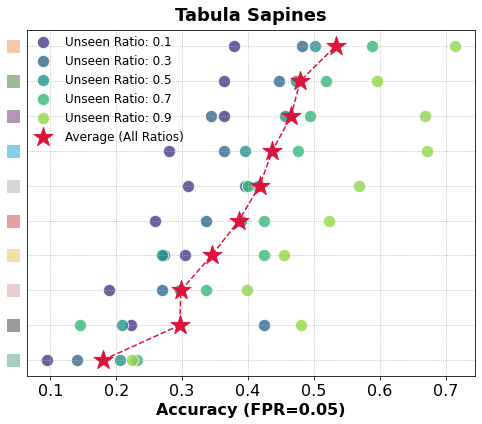

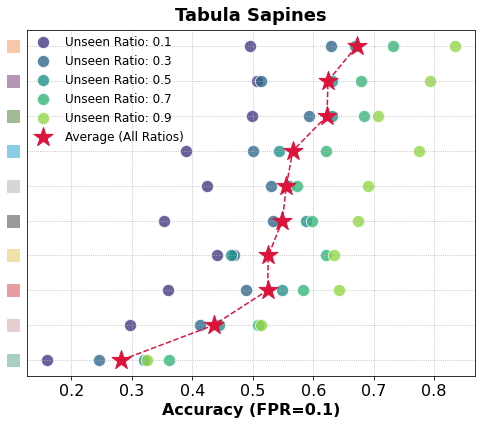

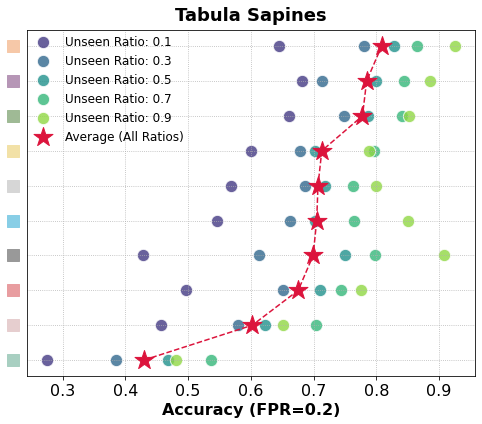

In [164]:
for FPR in [0.05, 0.1, 0.2]:
    plot_unseen_accuracy(result_df, "Tabula Sapines", FPR, save=True)

#### OOD detection

In [165]:
result_grouped = result_df.groupby(["model", "unseen_ratio"]).agg("mean").reset_index()
result_grouped = result_grouped[result_grouped["model"]!= "LR(OvR)"]
result_grouped.head()

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,Geneformer,0.1,2.0,0.258609,0.359414,0.496862,0.713651,0.857871,0.736642,0.866407
1,Geneformer,0.3,2.0,0.336336,0.488031,0.650557,0.777329,0.716358,0.815958,0.736654
2,Geneformer,0.5,2.0,0.389318,0.547540,0.709907,0.802756,0.555763,0.852928,0.601341
3,Geneformer,0.7,2.0,0.423385,0.583731,0.744530,0.828144,0.379077,0.860112,0.446704
4,Geneformer,0.9,2.0,0.522326,0.643357,0.776132,0.880219,0.359673,0.864902,0.317405


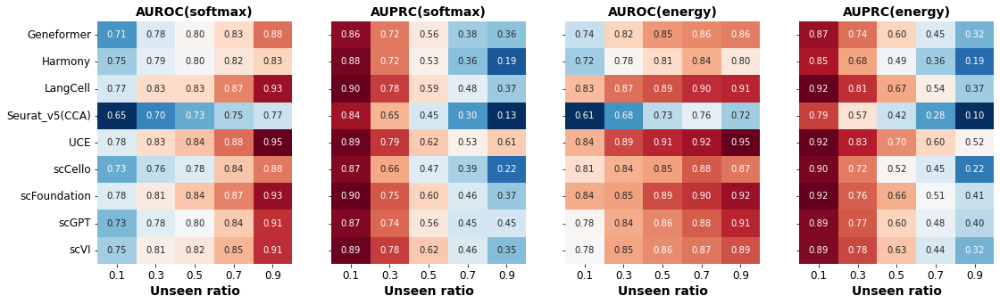

In [83]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharex=True, sharey=False)

for i, col in enumerate(["AUROC(softmax)", "AUPRC(softmax)", "AUROC(energy)", "AUPRC(energy)"]):
    heatmap_df = result_grouped.pivot(index="model", columns="unseen_ratio", values=col)
    sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", ax=axes[i], fmt='.2f', cbar=False)
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Unseen ratio", fontweight="bold", fontsize=14)
    axes[i].set_title(col, fontweight="bold", fontsize=14)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].tick_params(axis='x', labelsize=12)
    if i > 0:
        axes[i].set_yticklabels("")
# plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.savefig("../figures/cell_annotation/novel_cells/tabula_confidence_iid_positive.png", dpi=300, bbox_inches='tight')

## AIDA

### unseen_ratio = 0

In [166]:
dataset_name = "AIDA_v2_new"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in annotation_models:
    if "LR" not in model:
        params = model_to_params[dataset_name][model]
        lr, l2 = float(params["lr"]), float(params["l2"])
        result_path = os.path.join(output_folder, model, "onclass_dot_product", dataset_name, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_unseen_0.csv")
    else:
        result_path = os.path.join(output_folder, model, dataset_name, "testset_0.8/all_metrics_unseen_0.csv")

    df = pd.read_csv(result_path).iloc[:-2, :]
    df["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, df])
df_all.head()

,AUROC,AUPRC,AUROC(seen),AUPRC(seen),AUROC(unseen),AUPRC(unseen),Cohens Kappa,Accuracy@3,Accuracy@5,Accuracy@1,Macro F1,Macro F1 <100,"Macro F1 [100, 1000)","Macro F1 [1000, 5000)",Macro F1 >=5000,Accuracy@1(nonleaf),LCAD,model
0,0.998442,0.996465,0.998442,0.996465,NaN,NaN,0.952243,0.997685,0.999502,0.957568,0.896993,0.751983,0.920011,0.967688,NaN,0.805037,1.949261,LR(OvR)
1,0.998535,0.996720,0.998535,0.996720,NaN,NaN,0.953365,0.997522,0.999232,0.958563,0.891208,0.721648,0.922208,0.968035,NaN,0.789269,1.949608,LR(OvR)
2,0.998401,0.996114,0.998401,0.996114,NaN,NaN,0.953066,0.997479,0.999318,0.958293,0.896759,0.747002,0.921915,0.967792,NaN,0.795502,1.928923,LR(OvR)
3,0.998663,0.996650,0.998663,0.996650,NaN,NaN,0.954000,0.997566,0.999470,0.959126,0.890359,0.716511,0.922467,0.968667,NaN,0.782141,1.957385,LR(OvR)
4,0.998678,0.996762,0.998678,0.996762,NaN,NaN,0.954537,0.997804,0.999459,0.959602,0.899965,0.759076,0.921752,0.969475,NaN,0.777676,1.905463,LR(OvR)


In [167]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.8694082 ,  0.73678922, -2.14977952]), 'Harmony': array([ 0.94025966,  0.84960876, -2.20613977]), 'LR(OvR)': array([ 0.95863031,  0.89505663, -1.93812812]), 'LangCell': array([ 0.9372087 ,  0.82464511, -2.05994149]), 'Seurat_v5(CCA)': array([ 0.92851455,  0.80192812, -2.02367742]), 'UCE': array([ 0.95345451,  0.90265725, -2.05380649]), 'scCello': array([ 0.95160879,  0.81572526, -2.06510316]), 'scFoundation': array([ 0.95171698,  0.88295502, -2.15358129]), 'scGPT': array([ 0.90878503,  0.81039438, -2.02830068]), 'scVI': array([ 0.9577345 ,  0.89948272, -2.02289161])}
Front 1: ['LR(OvR)', 'UCE', 'scVI']
Front 2: ['LangCell', 'Seurat_v5(CCA)', 'scCello', 'scFoundation', 'scGPT']
Front 3: ['Harmony', 'Geneformer']


In [168]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.8694082 , 0.73678922]), 'Harmony': array([0.94025966, 0.84960876]), 'LR(OvR)': array([0.95863031, 0.89505663]), 'LangCell': array([0.9372087 , 0.82464511]), 'Seurat_v5(CCA)': array([0.92851455, 0.80192812]), 'UCE': array([0.95345451, 0.90265725]), 'scCello': array([0.95160879, 0.81572526]), 'scFoundation': array([0.95171698, 0.88295502]), 'scGPT': array([0.90878503, 0.81039438]), 'scVI': array([0.9577345 , 0.89948272])}
Front 1: ['UCE', 'scVI']
Front 2: ['LR(OvR)']
Front 3: ['scFoundation']
Front 4: ['Harmony', 'scCello']
Front 5: ['LangCell']
Front 6: ['Seurat_v5(CCA)', 'scGPT']
Front 7: ['Geneformer']


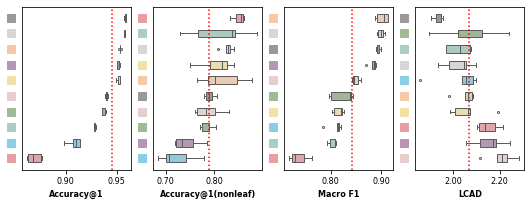

In [169]:
# fig, axes = plt.subplots(1, 4, figsize=(12, 4))

# for i, col in enumerate(["Accuracy@1", "Accuracy@1(nonleaf)", "Macro F1", "LCAD"]):
#     model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
#     plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
#                 col, df_all[col].median())
    
# plt.tight_layout()
# plt.savefig("../figures/cell_annotation/cross_validation/AIDA.png", dpi=300, bbox_inches="tight")

plot_annotation_cv_results(df_all, "AIDA", save=True)

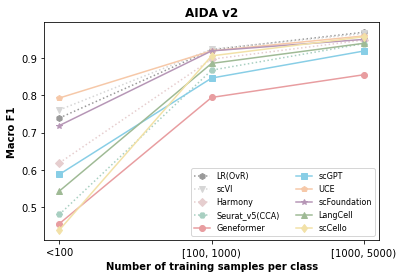

In [91]:
x = np.arange(3)
for i, model_name in enumerate(df_all["model"].unique()):
    y = df_all[df_all["model"]==model_name].values[:, -8:-5].mean(0).tolist()
    plt.plot(x, y, 
             color=custom_palette[model_name], 
             label=model_name, 
             marker=custom_shape[model_name],
             ls="-" if model_name in model_order_scFM else ":")
    # plt.scatter(x, y, color=custom_palette[model_name])
plt.xticks(x, labels=['<100', '[100, 1000)', '[1000, 5000)'])
plt.xlabel("Number of training samples per class", fontweight="bold")
plt.ylabel("Macro F1", fontweight="bold")
plt.legend(ncol=2, fontsize=8)
plt.title("AIDA v2", fontweight="bold")
plt.savefig("../figures/cell_annotation/cross_validation/AIDA_macrof1_detailed.png", dpi=300)

### unseen_ratio > 0

#### Confidence-adjusted accuracy score
scBERT: evaluate the accuracy of novel cell type and known cell types, separately. Notably, we employed a strict evaluation method for novel cell types with the accuracy calculated on the union set of cells with the novel cell type label and the cells that are predicted as novel cell types

In [ ]:
dataset_name = "AIDA_v2_new"
output_folder = f"../OnClass/results_best_params/"
result_df = get_unseen_result(dataset_name, output_folder)
result_df.head()

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,LR(OvR),0.1,0,0.642882,0.752807,0.850007,NaN,NaN,NaN,NaN
1,LR(OvR),0.1,1,0.000000,0.000000,0.548402,NaN,NaN,NaN,NaN
2,LR(OvR),0.1,2,0.604633,0.717915,0.818874,NaN,NaN,NaN,NaN
3,LR(OvR),0.1,3,0.570096,0.659781,0.758085,NaN,NaN,NaN,NaN
4,LR(OvR),0.1,4,0.000000,0.540211,0.726608,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
245,scCello,0.9,0,0.026416,0.043139,0.071646,0.906117,0.509988,0.453532,0.046785
246,scCello,0.9,1,0.093659,0.201895,0.407799,0.668395,0.041672,0.690986,0.045816
247,scCello,0.9,2,0.828299,0.908690,0.955390,0.918887,0.439471,0.962270,0.790100
248,scCello,0.9,3,0.112478,0.371004,0.705363,0.709718,0.156600,0.802813,0.216727


In [170]:
# result_df.to_csv("../figures/cell_annotation/novel_cells/aida_accuracy_unseen.csv",index=False)
result_df = pd.read_csv("../figures/cell_annotation/novel_cells/aida_accuracy_unseen.csv")

In [171]:
df_grouped = result_df.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy(FPR=0.05)", "Accuracy(FPR=0.1)", "Accuracy(FPR=0.2)"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.26465043, 0.34019166, 0.44533764]), 'Harmony': array([0.2762217 , 0.40369666, 0.55818434]), 'LR(OvR)': array([0.22994331, 0.34577254, 0.55373475]), 'LangCell': array([0.44126775, 0.55149644, 0.68735662]), 'Seurat_v5(CCA)': array([0.23042827, 0.34466811, 0.51234077]), 'UCE': array([0.50303935, 0.61822521, 0.76101282]), 'scCello': array([0.44656792, 0.57558073, 0.71421065]), 'scFoundation': array([0.4465342 , 0.56471598, 0.69226655]), 'scGPT': array([0.34494931, 0.45576202, 0.60199376]), 'scVI': array([0.39336024, 0.52305767, 0.67546695])}
Front 1: ['UCE']
Front 2: ['scCello']
Front 3: ['scFoundation']
Front 4: ['LangCell']
Front 5: ['scVI']
Front 6: ['scGPT']
Front 7: ['Harmony']
Front 8: ['Geneformer', 'LR(OvR)']
Front 9: ['Seurat_v5(CCA)']


In [172]:
summary = result_df.groupby(["model", "unseen_ratio"]).agg({"Accuracy(FPR=0.05)": ['mean', 'std']}).reset_index()
summary.columns = ["model", "unseen_ratio", 'mean', 'std']
summary.head()

,model,unseen_ratio,mean,std
0,Geneformer,0.1,0.528469,0.166749
1,Geneformer,0.3,0.235440,0.180956
2,Geneformer,0.5,0.148880,0.202734
3,Geneformer,0.7,0.196378,0.247178
4,Geneformer,0.9,0.214085,0.264303


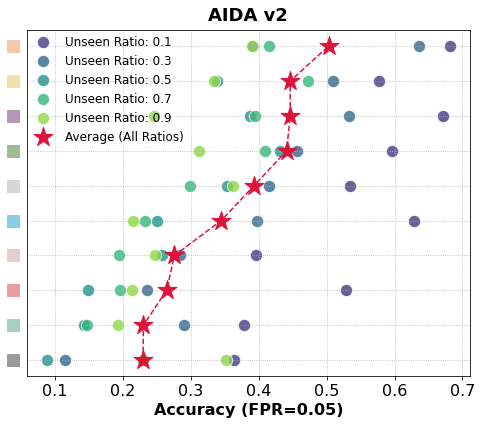

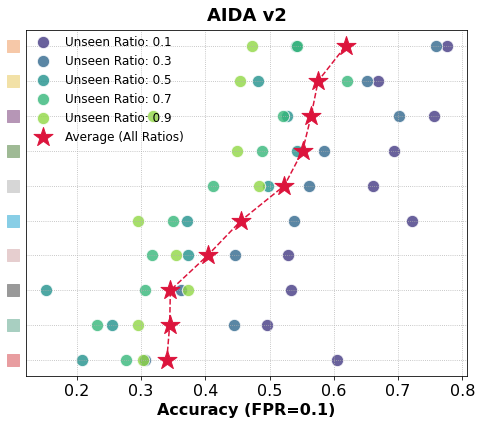

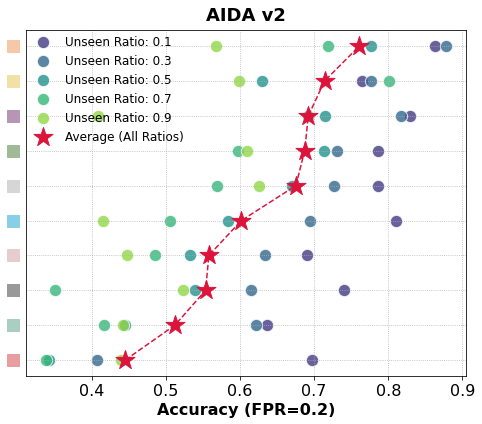

In [173]:
for FPR in [0.05, 0.1, 0.2]:
    plot_unseen_accuracy(result_df, "AIDA v2", FPR, save=True)

#### OOD detection

In [174]:
result_grouped = result_df.groupby(["model", "unseen_ratio"]).agg("mean").reset_index()
result_grouped = result_grouped[result_grouped["model"]!= "LR(OvR)"]
result_grouped.head()

,model,unseen_ratio,iter,Accuracy(FPR=0.05),Accuracy(FPR=0.1),Accuracy(FPR=0.2),AUROC(softmax),AUPRC(softmax),AUROC(energy),AUPRC(energy)
0,Geneformer,0.1,2.0,0.528469,0.605717,0.697448,0.774139,0.911406,0.841806,0.936052
1,Geneformer,0.3,2.0,0.235440,0.306782,0.407395,0.660591,0.639908,0.683034,0.679184
2,Geneformer,0.5,2.0,0.148880,0.208508,0.342733,0.695739,0.439349,0.674928,0.367302
3,Geneformer,0.7,2.0,0.196378,0.276672,0.339040,0.656326,0.329322,0.575058,0.281081
4,Geneformer,0.9,2.0,0.214085,0.303280,0.440073,0.749484,0.328063,0.680315,0.190664


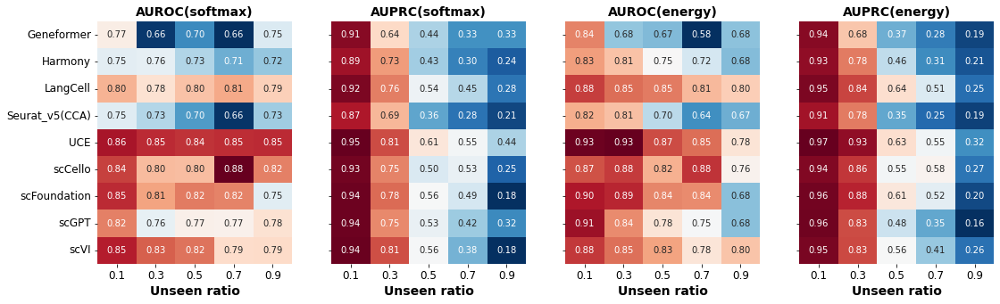

In [98]:
fig, axes = plt.subplots(1, 4, figsize=(18, 5), sharex=True, sharey=False)

for i, col in enumerate(["AUROC(softmax)", "AUPRC(softmax)", "AUROC(energy)", "AUPRC(energy)"]):
    heatmap_df = result_grouped.pivot(index="model", columns="unseen_ratio", values=col)
    sns.heatmap(heatmap_df, annot=True, cmap="RdBu_r", ax=axes[i], fmt='.2f', cbar=False)
    axes[i].set_ylabel("")
    axes[i].set_xlabel("Unseen ratio", fontweight="bold", fontsize=14)
    axes[i].set_title(col, fontweight="bold", fontsize=14)
    axes[i].tick_params(axis='y', labelsize=12)
    axes[i].tick_params(axis='x', labelsize=12)
    if i > 0:
        axes[i].set_yticklabels("")
# plt.tight_layout()
plt.subplots_adjust(wspace=0.2)
plt.savefig("../figures/cell_annotation/novel_cells/aida_confidence_iid_positive.png", dpi=300, bbox_inches='tight')

## Cross dataset label transfer

### Tabula to HLCA

In [175]:
source_dataset = "Tabula_Sapiens_all"
target_dataset = "HLCA_core"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in transfer_annotation_models:
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                               source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
    df = pd.read_csv(result_path, index_col=0).iloc[:-2, :]
    df["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, df])
df_all.head()

,unseen_ratio,Accuracy@1,Macro F1,LCAD,model
iter,,,,,
0.0,0.0,0.610929,0.084222,2.930892,scVI
1.0,0.0,0.606049,0.076415,2.835788,scVI
2.0,0.0,0.609503,0.080668,2.943788,scVI
3.0,0.0,0.620242,0.082537,2.777726,scVI
4.0,0.0,0.610466,0.080075,2.936183,scVI


In [80]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.66497263,  0.08659671, -2.5589799 ]), 'LangCell': array([ 0.65286571,  0.08026233, -2.79830363]), 'UCE': array([ 0.66933571,  0.08892166, -2.03479574]), 'scCello': array([ 0.78480573,  0.10500298, -2.60878528]), 'scFoundation': array([ 0.67190901,  0.08318657, -2.17635071]), 'scGPT': array([ 0.67394331,  0.08148226, -2.46761235]), 'scVI': array([ 0.61143785,  0.08078325, -2.88487515])}
Front 1: ['UCE', 'scCello', 'scFoundation', 'scGPT']
Front 2: ['Geneformer']
Front 3: ['LangCell']
Front 4: ['scVI']


In [81]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.66497263, 0.08659671]), 'LangCell': array([0.65286571, 0.08026233]), 'UCE': array([0.66933571, 0.08892166]), 'scCello': array([0.78480573, 0.10500298]), 'scFoundation': array([0.67190901, 0.08318657]), 'scGPT': array([0.67394331, 0.08148226]), 'scVI': array([0.61143785, 0.08078325])}
Front 1: ['scCello']
Front 2: ['UCE', 'scFoundation', 'scGPT']
Front 3: ['Geneformer']
Front 4: ['LangCell']
Front 5: ['scVI']


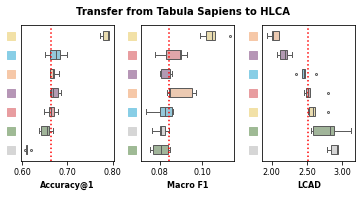

In [59]:
cols = ["Accuracy@1", "Macro F1", "LCAD"]
fig, axes = plt.subplots(1, len(cols), figsize=(2*len(cols), 2.5))
for i, col in enumerate(cols):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[col].median())
fig.suptitle("Transfer from Tabula Sapiens to HLCA", fontsize=10, fontweight='bold')
# plt.tight_layout()
fig.subplots_adjust(wspace=0.3)
plt.savefig("../figures/cell_annotation/transfer_annotation/tabula_to_hlca.png", dpi=300, bbox_inches='tight')

### HLCA to Tabula

In [176]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in transfer_annotation_models:
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                               source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
    df = pd.read_csv(result_path, index_col=0).iloc[:-2, :]
    df["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, df])
df_all.head()

,unseen_ratio,Accuracy@1,Macro F1,LCAD,model
iter,,,,,
0.0,0.0,0.789846,0.254228,2.240246,scVI
1.0,0.0,0.797409,0.259477,2.198115,scVI
2.0,0.0,0.794901,0.257052,2.193866,scVI
3.0,0.0,0.784792,0.250267,2.206333,scVI
4.0,0.0,0.785316,0.256948,2.266655,scVI


In [112]:
df_all["LCAD_rank"] = - df_all["LCAD"]
df_grouped = df_all.groupby("model").agg("mean")
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1", "LCAD_rank"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([ 0.7722865 ,  0.23880406, -2.3562378 ]), 'LangCell': array([ 0.76565577,  0.24420721, -2.22432249]), 'UCE': array([ 0.82538845,  0.28266984, -2.24460473]), 'scCello': array([ 0.85747501,  0.2705131 , -1.85751138]), 'scFoundation': array([ 0.78202853,  0.25932158, -2.1753326 ]), 'scGPT': array([ 0.61433599,  0.20941044, -2.05724713]), 'scVI': array([ 0.79045266,  0.25559449, -2.22104297])}
Front 1: ['UCE', 'scCello']
Front 2: ['scFoundation', 'scGPT', 'scVI']
Front 3: ['Geneformer', 'LangCell']


In [113]:
keys = df_grouped.index
values = df_grouped.loc[:, ["Accuracy@1", "Macro F1"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.7722865 , 0.23880406]), 'LangCell': array([0.76565577, 0.24420721]), 'UCE': array([0.82538845, 0.28266984]), 'scCello': array([0.85747501, 0.2705131 ]), 'scFoundation': array([0.78202853, 0.25932158]), 'scGPT': array([0.61433599, 0.20941044]), 'scVI': array([0.79045266, 0.25559449])}
Front 1: ['UCE', 'scCello']
Front 2: ['scFoundation', 'scVI']
Front 3: ['Geneformer', 'LangCell']
Front 4: ['scGPT']


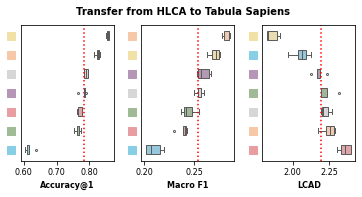

In [177]:
cols = ["Accuracy@1", "Macro F1", "LCAD"]
fig, axes = plt.subplots(1, len(cols), figsize=(2*len(cols), 2.5))
for i, col in enumerate(cols):
    model_order = get_model_order(df_all, col, ascending=True if col=="LCAD" else False)
    plot_violin(axes[i], col, 'model', df_all, 'model', model_order, custom_palette,
                col, df_all[col].median())
fig.suptitle("Transfer from HLCA to Tabula Sapiens", fontsize=10, fontweight='bold')
# plt.tight_layout()
fig.subplots_adjust(wspace=0.3)
plt.savefig("../figures/cell_annotation/transfer_annotation/hlca_to_tabula.png", dpi=300, bbox_inches='tight')

#### cell type distribution

In [ ]:
target_labels = {'CL:0000860', 'CL:0002543', 'CL:0000875', 'CL:0000077', 'CL:0002062', 'CL:0000786', 'CL:0000186', 
                'CL:0002138', 'CL:0002063', 'CL:0000097', 'CL:0000158', 'CL:0002399', 'CL:0002144', 'CL:0000037'}
adata = sc.read("../data/datasets/Tabula_Sapiens_all.h5ad")
adata_selected = adata[adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

In [ ]:
hlca_adata = sc.read("../data/datasets/HLCA_core.h5ad")
hlca_adata_selected = hlca_adata[hlca_adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

In [ ]:
adata_selected.obs["cell_type_ontology_term_id"].value_counts()

cell_type_ontology_term_id
CL:0000860    13387
CL:0000786    11545
CL:0002063     9146
CL:0002144     5089
CL:0002543     3379
CL:0000186     3070
CL:0000097     2238
CL:0000158     2116
CL:0002138     1052
CL:0000875     1044
CL:0000037      794
CL:0002399      306
CL:0002062      211
CL:0000077       41
Name: count, dtype: int64

In [ ]:
hlca_adata_selected.obs["cell_type_ontology_term_id"].value_counts()

cell_type_ontology_term_id
CL:0002063    62405
CL:0000158    36023
CL:0002144    23205
CL:0000860    17695
CL:0002543    12975
CL:0002399     9133
CL:0000875     8834
CL:0002062     7937
CL:0000097     6623
CL:0002138     4595
CL:0000786     1773
CL:0000186      716
CL:0000077      230
CL:0000037       60
Name: count, dtype: int64

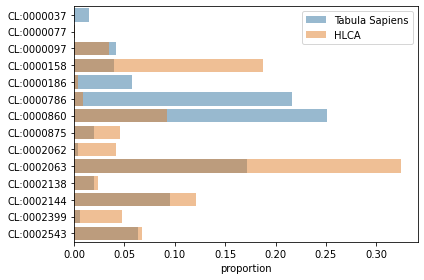

In [ ]:
sns.barplot(adata_selected.obs["cell_type_ontology_term_id"].value_counts(normalize=True), alpha=0.5, orient="h", label="Tabula Sapiens")
sns.barplot(hlca_adata_selected.obs["cell_type_ontology_term_id"].value_counts(normalize=True), alpha=0.5, orient="h", label="HLCA")
plt.legend()
plt.ylabel("")
plt.tight_layout()
plt.savefig("../figures/cell_annotation/transfer_annotation/overlap_category_distribution.png",dpi=300, bbox_inches='tight')

#### Tissue-specific performance

In [184]:
target_labels = {'CL:0000860', 'CL:0002543', 'CL:0000875', 'CL:0000077', 'CL:0002062', 'CL:0000786', 'CL:0000186', 
                'CL:0002138', 'CL:0002063', 'CL:0000097', 'CL:0000158', 'CL:0002399', 'CL:0002144', 'CL:0000037'}
# read adata
adata = sc.read(f"{data_folder}/datasets/Tabula_Sapiens_all.h5ad")

# select the subset with the target labels
adata_selected = adata[adata.obs["cell_type_ontology_term_id"].isin(target_labels)]

# report the tissue-specific accuracy
tissue = adata_selected.obs["tissue_in_publication"].to_list()

In [ ]:
value_counts = adata_selected.obs["tissue_in_publication"].value_counts().reset_index()
fig = px.pie(
    value_counts,
    names="tissue_in_publication",
    values="count"
)

In [ ]:
fig.show()

In [185]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
output_folder = f"../OnClass/results_best_params/"
df_all = pd.DataFrame()
for model in transfer_annotation_models:
    df_model = pd.DataFrame()
    params = model_to_params[source_dataset][model]
    lr, l2 = float(params["lr"]), float(params["l2"])
    for iter in range(5):
        result_path = os.path.join(output_folder, model, "onclass_dot_product", 
                                   source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/{iter}/0/{target_dataset}/pred_label.csv")
        df = pd.read_csv(result_path)
        df["tissue"] = tissue
        df["iter"] = iter
        df_model = pd.concat([df_model, df], axis=0)
    accuracy_per_tissue = df_model.groupby(['tissue', 'iter']).apply(lambda x: (x['y_true'] == x['y_pred']).mean())
    accuracy_per_tissue = accuracy_per_tissue.groupby(['tissue']).agg("mean").reset_index().rename(columns={0: 'Accuracy'})
    accuracy_per_tissue["model"] = model_map_dict.get(model, model)
    df_all = pd.concat([df_all, accuracy_per_tissue], axis=0)
df_all

,tissue,Accuracy,model
0,Bladder,0.5178,scVI
1,Blood,0.9710,scVI
2,Bone_Marrow,0.7978,scVI
3,Eye,0.9373,scVI
4,Fat,0.0277,scVI
...,...,...,...
17,Thymus,0.8634,scCello
18,Tongue,0.8464,scCello
19,Trachea,0.9797,scCello
20,Uterus,0.3558,scCello


In [186]:
df_all = df_all.reset_index(drop=True)
df_max_acc = df_all.loc[df_all.groupby('tissue')['Accuracy'].idxmax()].reset_index(drop=True)
df_max_acc.model.value_counts()

UCE             9
scCello         6
scVI            3
scFoundation    2
Geneformer      1
scGPT           1
Name: model, dtype: int64

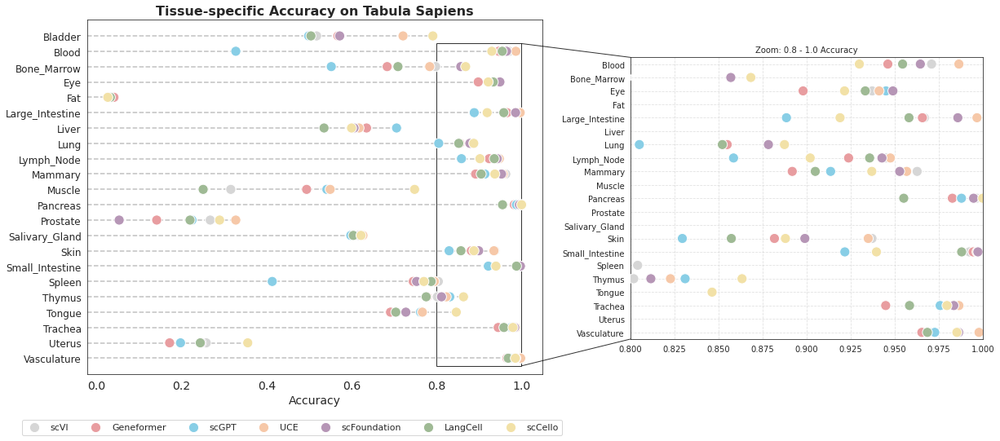

In [ ]:
# --- Main Plotting ---
# sns.set_style('white')
fig, ax = plt.subplots(figsize=(10, 8)) # Use fig, ax for more control

# Main scatter plot
scatter = sns.scatterplot(data=df_all, y="tissue", x="Accuracy", hue="model", 
                          s=150, palette=custom_palette,
                          zorder=3, alpha=1.0, ax=ax)

# --- Draw Dashed Lines to Max Value ---
# This part of your code remains the same
yticklabels = scatter.get_yticklabels()
max_values = df_all.groupby('tissue')['Accuracy'].max()
xlim = scatter.get_xlim()

for i, label in enumerate(yticklabels):
    dataset = label.get_text()
    # Ensure the dataset from the label exists in max_values
    if dataset in max_values:
        ax.axhline(y=i, xmin=0, xmax=(max_values[dataset] - xlim[0])/(xlim[1] - xlim[0]), 
                   color='gray', linestyle='--', alpha=0.5,
                   zorder=1)

# --- Styling the Main Plot ---
ax.set_xlabel("Accuracy", fontsize=14)
ax.set_ylabel("")
ax.tick_params(axis='x', labelsize=14)
ax.tick_params(axis='y', labelsize=12)
ax.set_title("Tissue-specific Accuracy on Tabula Sapiens", fontweight="bold", fontsize=16)
# ax.legend(ncol=3, loc="upper left", bbox_to_anchor=(1.01, 1), fontsize=11)
ax.legend(ncol=7, loc="center", bbox_to_anchor=(.45,-0.15), fontsize=11)

# --- Create the Inset (Zoomed-in) Plot ---
# Create a new axes for the inset plot within the main figure
# The arguments are [left, bottom, width, height] in figure-relative coordinates
ax_inset = fig.add_axes([1.05, 0.2, 0.6, 0.6]) 

# Plot the same data on the inset axes
sns.scatterplot(data=df_all, y="tissue", x="Accuracy", hue="model", 
                s=150, palette=custom_palette,
                ax=ax_inset, legend=False, # No legend on the inset
                zorder=3, alpha=1.0)

# Set the zoom range for the inset plot
zoom_xlim = (0.8, 1.0)
ax_inset.set_xlim(zoom_xlim) 

# Find which y-axis range to show in the inset
# This filters the data to only include points within the x-range of the inset
y_lim_data = df_all[df_all['Accuracy'] >= 0.8]
tissues = [label.get_text() for label in yticklabels]
if not y_lim_data.empty:
    # Get the numeric indices of the tissues to be shown
    y_indices = [tissues.index(t) for t in y_lim_data['tissue'].unique()]
    if y_indices:
        zoom_ylim = (min(y_indices) - 0.5, max(y_indices) + 0.5)

ax_inset.set_ylim(zoom_ylim)
ax_inset.invert_yaxis()
ax_inset.set_xlabel('')
ax_inset.set_ylabel('')
ax_inset.set_title('Zoom: 0.8 - 1.0 Accuracy', fontsize=10)
ax_inset.tick_params(axis='x', labelsize=10)
# ax_inset.set_yticklabels([]) # Hide y-axis tick labels on inset
ax_inset.grid(True, linestyle='--', alpha=0.6)

# --- Add Connection Lines ---
# This function draws a box around the zoomed area on the main plot
# and connects it to the inset plot to make the relationship clear.
# ax.indicate_inset_zoom(ax_inset, edgecolor="black", alpha=0.8, zorder=2)
# --- Manually Add Connection Box and Lines ---
# 移除了自动连接线函数 ax.indicate_inset_zoom
# 手动在主图上绘制一个方框来表示放大区域
from matplotlib.patches import Rectangle, ConnectionPatch
rect = Rectangle((zoom_xlim[0], zoom_ylim[0]), zoom_xlim[1] - zoom_xlim[0], zoom_ylim[1] - zoom_ylim[0],
                 linewidth=1, edgecolor='black', facecolor='none',
                 zorder=2, alpha=0.8)
ax.add_patch(rect)

# 手动绘制从主图方框右侧到放大图左侧的连接线
# Top line
con1 = ConnectionPatch(xyA=(zoom_xlim[1], zoom_ylim[1]), xyB=(0, 0), coordsA='data', coordsB='axes fraction',
                       axesA=ax, axesB=ax_inset, color='black', alpha=0.8)
# Bottom line
con2 = ConnectionPatch(xyA=(zoom_xlim[1], zoom_ylim[0]), xyB=(0, 1), coordsA='data', coordsB='axes fraction',
                       axesA=ax, axesB=ax_inset, color='black', alpha=0.8)
# Add lines to the figure
fig.add_artist(con1)
fig.add_artist(con2)

plt.savefig("../figures/cell_annotation/transfer_annotation/hlca_to_tabula_tissue_acc.png", dpi=300, bbox_inches='tight')

## Model complementary

1. Dataset: Tabula_Sapiens_all
2. Setting: 20% training, 80% test, unseen_ratio=0
3. Plot: Heatmaps representing performance of pairwise model combinations in terms of Accuracy@1 or Macro F1

### Tabula to HLCA

In [181]:
source_dataset = "Tabula_Sapiens_all"
target_dataset = "HLCA_core"
combinations = pd.read_csv(f"../figures/cell_annotation/model_ensemble/model_complement_transfer_{source_dataset}_to_{target_dataset}.csv")
combinations["model1"] = combinations["model1"].apply(lambda x: model_map_dict.get(x, x))
combinations["model2"] = combinations["model2"].apply(lambda x: model_map_dict.get(x, x))
combinations.head()

,iter,model1,model2,Accuracy@1,Macro F1
0,0,all_logits,all_logits,0.748777,0.162739
1,0,all_voting,all_voting,0.753356,0.125946
2,0,Geneformer,scGPT,0.754771,0.166853
3,0,Geneformer,UCE,0.746426,0.165099
4,0,Geneformer,LangCell,0.745671,0.152721


In [182]:
output_folder = f"../OnClass/results_best_params/"
single_model_result = []
single_model_acc = defaultdict(list)
single_model_f1 = defaultdict(list)
for model in annotation_ensemble_models:
	params = model_to_params[source_dataset][model]
	lr, l2 = float(params["lr"]), float(params["l2"])
	result_path = os.path.join(output_folder, model, "onclass_dot_product", 
							   source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
	df = pd.read_csv(result_path)
	model = model_map_dict.get(model, model)
	for iter in range(5):
		single_model_result.append(
			{
				"iter": iter,
				"model1": model,
				"model2": model,
				"Accuracy@1": df["Accuracy@1"].values[iter],
				"Macro F1": df["Macro F1"].values[iter],
			}
		)
		single_model_acc[model].append(df["Accuracy@1"].values[iter])
		single_model_f1[model].append(df["Macro F1"].values[iter])
single_model_result = pd.DataFrame.from_dict(single_model_result)

In [183]:
# 6 models + 15 pairwise ensemble + 2 full ensemble
result = pd.concat([combinations, single_model_result],axis=0)
result_grouped = result.groupby(["model1", "model2"]).agg("mean").reset_index()
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1
0,Geneformer,Geneformer,2.0,0.664973,0.086597
1,Geneformer,LangCell,2.0,0.750102,0.161782
2,Geneformer,UCE,2.0,0.747284,0.161311
3,Geneformer,scCello,2.0,0.759604,0.164429
4,Geneformer,scFoundation,2.0,0.744271,0.156293
5,Geneformer,scGPT,2.0,0.756239,0.160936
6,LangCell,LangCell,2.0,0.652866,0.080262
7,LangCell,scCello,2.0,0.746667,0.125112
8,LangCell,scFoundation,2.0,0.707931,0.111494
9,UCE,LangCell,2.0,0.713011,0.110840


In [184]:
# result_grouped.to_csv(f"../figures/cell_annotation/model_ensemble/all_results_transfer_{source_dataset}_to_{target_dataset}.csv", index=False)

In [185]:
result_grouped["acc_improve"] = result_grouped.apply(lambda x: x["Accuracy@1"]-max(np.mean(single_model_acc[x["model1"]]), np.mean(single_model_acc[x["model2"]])), axis=1)
result_grouped["f1_improve"] = result_grouped.apply(lambda x: x["Macro F1"]-max(np.mean(single_model_f1[x["model1"]]), np.mean(single_model_f1[x["model2"]])), axis=1)
result_grouped = result_grouped.reset_index(drop=True).dropna()
result_grouped

/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars


,model1,model2,iter,Accuracy@1,Macro F1,acc_improve,f1_improve
0,Geneformer,Geneformer,2.0,0.664973,0.086597,0.000000e+00,0.000000e+00
1,Geneformer,LangCell,2.0,0.750102,0.161782,8.512934e-02,7.518526e-02
2,Geneformer,UCE,2.0,0.747284,0.161311,7.794843e-02,7.238923e-02
3,Geneformer,scCello,2.0,0.759604,0.164429,-2.520135e-02,5.942556e-02
4,Geneformer,scFoundation,2.0,0.744271,0.156293,7.236166e-02,6.969605e-02
5,Geneformer,scGPT,2.0,0.756239,0.160936,8.229589e-02,7.433955e-02
6,LangCell,LangCell,2.0,0.652866,0.080262,0.000000e+00,0.000000e+00
7,LangCell,scCello,2.0,0.746667,0.125112,-3.813864e-02,2.010950e-02
8,LangCell,scFoundation,2.0,0.707931,0.111494,3.602214e-02,2.830712e-02
9,UCE,LangCell,2.0,0.713011,0.110840,4.367547e-02,2.191847e-02


In [187]:
metric = "Accuracy@1"
improve_col = "acc_improve"
heatmap_df = get_heatmap_df(result_grouped, metric, improve_col)
heatmap_df

,Geneformer,LangCell,UCE,scCello,scFoundation,scGPT
model1,,,,,,
Geneformer,0.664973,0.750102,0.747284,0.759604,0.744271,0.756239
LangCell,0.085129,0.652866,0.713011,0.746667,0.707931,0.719170
UCE,0.077948,0.043675,0.669336,0.736304,0.703438,0.725341
scCello,-0.025201,-0.038139,-0.048502,0.784806,0.730582,0.774571
scFoundation,0.072362,0.036022,0.031529,-0.054224,0.671909,0.718377
scGPT,0.082296,0.045227,0.051397,-0.010235,0.044434,0.673943


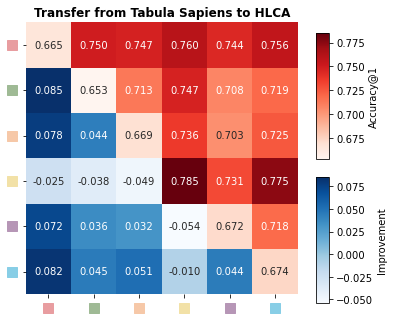

In [191]:
plot_ensemble_heamtmap(heatmap_df, metric, source_dataset, target_dataset)

In [192]:
metric = "Macro F1"
improve_col = "f1_improve"
heatmap_df = get_heatmap_df(result_grouped, metric, improve_col)
heatmap_df

,Geneformer,LangCell,UCE,scCello,scFoundation,scGPT
model1,,,,,,
Geneformer,0.086597,0.161782,0.161311,0.164429,0.156293,0.160936
LangCell,0.075185,0.080262,0.110840,0.125112,0.111494,0.111603
UCE,0.072389,0.021918,0.088922,0.125624,0.112137,0.117833
scCello,0.059426,0.020110,0.020621,0.105003,0.128417,0.130077
scFoundation,0.069696,0.028307,0.023216,0.023414,0.083187,0.111817
scGPT,0.074340,0.030120,0.028912,0.025074,0.028630,0.081482


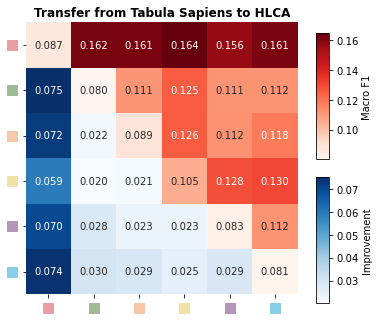

In [193]:
plot_ensemble_heamtmap(heatmap_df, metric, source_dataset, target_dataset)

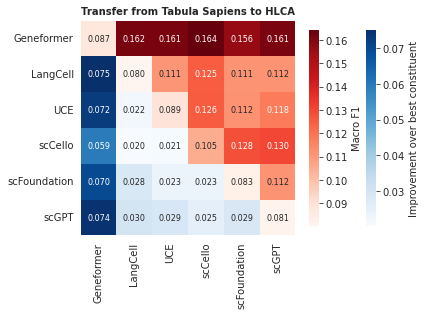

In [ ]:
# plt.figure(figsize=(6, 6))
# data = heatmap_df.values
# mask_upper = np.triu(np.ones_like(data, dtype=bool))
# mask_lower = np.tril(np.ones_like(data, dtype=bool),k=-1)

# ax1 = sns.heatmap(data, mask=mask_upper, cmap='Blues', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
#                   cbar_kws={'label': "Improvement over best constituent", 'shrink': 0.5}, square=True)
# ax2 = sns.heatmap(data, mask=mask_lower, cmap='Reds', annot=True, annot_kws={"fontsize": 8}, fmt=".3f", 
#                   xticklabels=heatmap_df.index, yticklabels=heatmap_df.index,
#                   cbar_kws={'label': metric, 'shrink': 0.5}, square=True)
# plt.title("Transfer from Tabula Sapiens to HLCA", fontsize=10, fontweight='bold')
# plt.tight_layout()
# plt.savefig(f"../figures/cell_annotation/model_ensemble/tabula_to_hlca_ensemble_{metric}.png", dpi=300, bbox_inches='tight')

### HLCA to Tabula

In [194]:
source_dataset = "HLCA_core"
target_dataset = "Tabula_Sapiens_all"
combinations = pd.read_csv(f"../figures/cell_annotation/model_ensemble/model_complement_transfer_{source_dataset}_to_{target_dataset}.csv")
combinations["model1"] = combinations["model1"].apply(lambda x: model_map_dict.get(x, x))
combinations["model2"] = combinations["model2"].apply(lambda x: model_map_dict.get(x, x))
combinations.head()

,iter,model1,model2,Accuracy@1,Macro F1
0,0,all_logits,all_logits,0.809802,0.273158
1,0,all_voting,all_voting,0.819611,0.271606
2,0,Geneformer,scGPT,0.807312,0.278868
3,0,Geneformer,UCE,0.813303,0.283058
4,0,Geneformer,LangCell,0.802145,0.276391


In [195]:
output_folder = f"../OnClass/results_best_params/"
single_model_result = []
single_model_acc = defaultdict(list)
single_model_f1 = defaultdict(list)
for model in annotation_ensemble_models:
	params = model_to_params[source_dataset][model]
	lr, l2 = float(params["lr"]), float(params["l2"])
	result_path = os.path.join(output_folder, model, "onclass_dot_product", 
							   source_dataset, f"lr_{lr}_l2_{l2}_testset_0.8/all_metrics_transfer_{target_dataset}.csv")
	df = pd.read_csv(result_path)
	model = model_map_dict.get(model, model)
	for iter in range(5):
		single_model_result.append(
			{
				"iter": iter,
				"model1": model,
				"model2": model,
				"Accuracy@1": df["Accuracy@1"].values[iter],
				"Macro F1": df["Macro F1"].values[iter],
			}
		)
		single_model_acc[model].append(df["Accuracy@1"].values[iter])
		single_model_f1[model].append(df["Macro F1"].values[iter])
single_model_result = pd.DataFrame.from_dict(single_model_result)

In [196]:
result = pd.concat([combinations, single_model_result],axis=0)
result_grouped = result.groupby(["model1", "model2"]).agg("mean").reset_index()
result_grouped

,model1,model2,iter,Accuracy@1,Macro F1
0,Geneformer,Geneformer,2.0,0.772286,0.238804
1,Geneformer,LangCell,2.0,0.814231,0.284632
2,Geneformer,UCE,2.0,0.823820,0.289893
3,Geneformer,scCello,2.0,0.827919,0.288013
4,Geneformer,scFoundation,2.0,0.815882,0.280981
5,Geneformer,scGPT,2.0,0.816474,0.285114
6,LangCell,LangCell,2.0,0.765656,0.244207
7,LangCell,scCello,2.0,0.817728,0.277080
8,LangCell,scFoundation,2.0,0.790352,0.265613
9,UCE,LangCell,2.0,0.808001,0.275112


In [ ]:
# result_grouped.to_csv(f"../figures/cell_annotation/model_ensemble/all_results_transfer_{source_dataset}_to_{target_dataset}.csv", index=False)

In [197]:
result_grouped["acc_improve"] = result_grouped.apply(lambda x: x["Accuracy@1"]-max(np.mean(single_model_acc[x["model1"]]), np.mean(single_model_acc[x["model2"]])), axis=1)
result_grouped["f1_improve"] = result_grouped.apply(lambda x: x["Macro F1"]-max(np.mean(single_model_f1[x["model1"]]), np.mean(single_model_f1[x["model2"]])), axis=1)
result_grouped = result_grouped.reset_index(drop=True).dropna()
result_grouped

/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars


,model1,model2,iter,Accuracy@1,Macro F1,acc_improve,f1_improve
0,Geneformer,Geneformer,2.0,0.772286,0.238804,0.000000e+00,0.000000e+00
1,Geneformer,LangCell,2.0,0.814231,0.284632,4.194466e-02,4.042452e-02
2,Geneformer,UCE,2.0,0.823820,0.289893,-1.568760e-03,7.223219e-03
3,Geneformer,scCello,2.0,0.827919,0.288013,-2.955558e-02,1.750039e-02
4,Geneformer,scFoundation,2.0,0.815882,0.280981,3.385376e-02,2.165903e-02
5,Geneformer,scGPT,2.0,0.816474,0.285114,4.418735e-02,4.631010e-02
6,LangCell,LangCell,2.0,0.765656,0.244207,0.000000e+00,-5.551115e-17
7,LangCell,scCello,2.0,0.817728,0.277080,-3.974690e-02,6.567370e-03
8,LangCell,scFoundation,2.0,0.790352,0.265613,8.323037e-03,6.291671e-03
9,UCE,LangCell,2.0,0.808001,0.275112,-1.738740e-02,-7.558234e-03


In [198]:
metric = "Accuracy@1"
improve_col = "acc_improve"
heatmap_df = get_heatmap_df(result_grouped, metric, improve_col)
heatmap_df

,Geneformer,LangCell,UCE,scCello,scFoundation,scGPT
model1,,,,,,
Geneformer,0.772286,0.814231,0.823820,0.827919,0.815882,0.816474
LangCell,0.041945,0.765656,0.808001,0.817728,0.790352,0.768707
UCE,-0.001569,-0.017387,0.825388,0.851548,0.808888,0.802224
scCello,-0.029556,-0.039747,-0.005927,0.857475,0.827493,0.793388
scFoundation,0.033854,0.008323,-0.016500,-0.029982,0.782029,0.774859
scGPT,0.044187,0.003051,-0.023164,-0.064087,-0.007170,0.614336


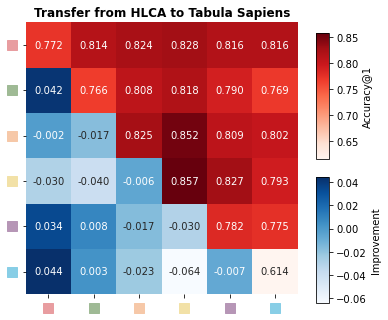

In [199]:
plot_ensemble_heamtmap(heatmap_df, metric, source_dataset, target_dataset)

In [200]:
metric = "Macro F1"
improve_col = "f1_improve"
heatmap_df = get_heatmap_df(result_grouped, metric, improve_col)
heatmap_df

,Geneformer,LangCell,UCE,scCello,scFoundation,scGPT
model1,,,,,,
Geneformer,0.238804,0.284632,0.289893,0.288013,0.280981,0.285114
LangCell,0.040425,0.244207,0.275112,0.277080,0.265613,0.252781
UCE,0.007223,-0.007558,0.282670,0.302525,0.274636,0.270016
scCello,0.017500,0.006567,0.019855,0.270513,0.285886,0.274627
scFoundation,0.021659,0.006292,-0.008034,0.015373,0.259322,0.260764
scGPT,0.046310,0.008573,-0.012654,0.004114,0.001442,0.209410


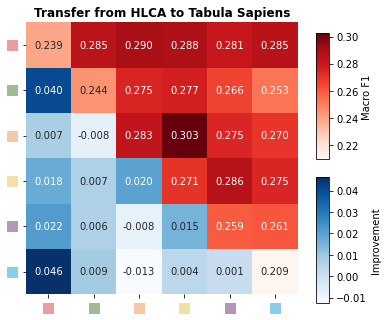

In [201]:
plot_ensemble_heamtmap(heatmap_df, metric, source_dataset, target_dataset)

# CancerFinder (leave-one-tissue-out)

## AUROC/AURPC

In [89]:
model_list = ["X", "scVI_integrated_tissue", "Geneformer", "scGPT", "UCE", "xTrimoGene", "LangCell", "scCello"]
tissue_list = ["Blood", "Brain", "Bone", "Eye"]

scVI_model_list = ["scVI_integrated_Patient", "scVI_integrated_dataset", 
                   "scVI_integrated_tumor", "scVI_integrated_tissue"]

In [75]:
def barplot_with_text(data, metric, **kwargs):
    order = ["Raw", "scVI"] + model_order_scFM
    sns.barplot(data=data, x=metric, y="Model", hue="Model", 
                palette=custom_palette, order=order, orient="h", **kwargs)
    
    min_val = data[metric].min()
    max_val = data[metric].max()
    margin = 0.03
    plt.xlim(min_val - margin, max_val + margin)
    
    for index, model in enumerate(order):
        if model in data["Model"].values:
            value = data.set_index("Model").loc[model, metric]
            plt.text(value+0.005, index, f'{value:.3f}', ha='left', va='center', fontsize=8)
    plt.axvline(x=data.set_index("Model").loc["Raw", metric], color="red", linestyle=':', alpha=0.8)

### Compare scVI with different batch_key (default parameters)

In [54]:
result_dir = "../SequencingCancerFinder/optuna_results"
df_all = pd.DataFrame()
for tissue in tissue_list:
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    batchkey_ls = []
    for model in scVI_model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            auroc_ls.append(float(auroc))
            auprc_ls.append(float(auprc))
            batchkey_ls.append(model.split("_")[-1])
    df["Batch_key"] = batchkey_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    df_all = pd.concat([df_all, df], axis=0)
df_all

,Batch_key,AUROC,AUPRC,Tissue
0,Patient,0.7335,0.6256,Blood
1,dataset,0.7258,0.6557,Blood
2,tumor,0.7060,0.6347,Blood
3,tissue,0.7623,0.6918,Blood
0,Patient,0.7633,0.8951,Brain
1,dataset,0.7883,0.8836,Brain
2,tumor,0.6718,0.8583,Brain
3,tissue,0.7370,0.8981,Brain
0,Patient,0.7078,0.8071,Bone
1,dataset,0.7758,0.8624,Bone


In [55]:
# the best batch key on average is "tissue"
df_all.groupby(["Batch_key"])[["AUROC", "AUPRC"]].agg("mean")

,AUROC,AUPRC
Batch_key,,
Patient,0.793325,0.829125
dataset,0.813600,0.847300
tissue,0.811225,0.859750
tumor,0.748400,0.809850


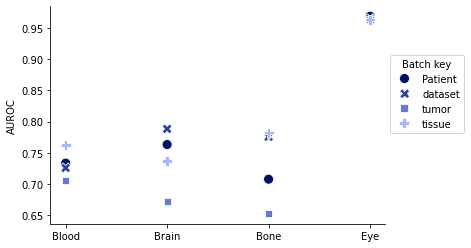

In [ ]:
colors = ["#001360", "#28439c", "#647ad4", "#a5b7ff"]
sns.scatterplot(df_all, x="Tissue", y="AUROC", style="Batch_key", hue="Batch_key", s=100, 
                palette=colors)
# sns.stripplot(df_all, x="Tissue", y="AUROC", hue="Batch_key", s=10, 
#               palette="Blues")   
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
ax.legend(loc="upper left", ncol=1, frameon=True, bbox_to_anchor=(1, 0.8), title="Batch key")
plt.xlabel("")
plt.savefig("../figures/cancer_finder/scvi_batchkey_auroc.png", dpi=300, bbox_inches='tight')

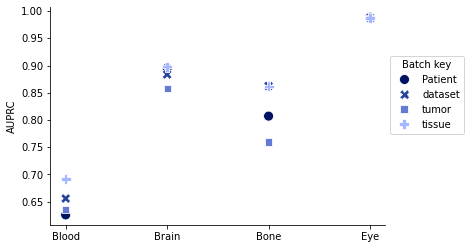

In [ ]:
colors = ["#001360", "#28439c", "#647ad4", "#a5b7ff"]
sns.scatterplot(df_all, x="Tissue", y="AUPRC", style="Batch_key", hue="Batch_key", s=100, 
                palette=colors)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
ax.legend(loc="upper left", ncol=1, frameon=True, bbox_to_anchor=(1, 0.8), title="Batch key")
plt.xlabel("")
plt.savefig("../figures/cancer_finder/scvi_batchkey_auprc.png", dpi=300, bbox_inches='tight')

### Absolute metrics

In [90]:
# load optimized results
result_dir = "../SequencingCancerFinder/optuna_results"
df_all = pd.DataFrame()
for t_id, tissue in enumerate(tissue_list):
    df = pd.DataFrame()
    auroc_ls, auprc_ls = [], []
    model_ls = []
    for model in model_list:
        optuna_results = pd.read_csv(os.path.join(result_dir, model, "optuna_all_trials.csv"))
        bs, dropout, lr, decay = optuna_results.loc[optuna_results["value"].idxmax(), :][1:]
        if t_id == 0:
            print(f"Best params for model {model}:", bs, dropout, lr, decay)
        with open(os.path.join(result_dir, model, f"bs_{int(bs)}_lr_{lr}_drop_{dropout:.2f}_decay_{decay}", tissue, "train_log_val.txt")) as f:
            res = f.readlines()[-2:]
            auroc, auprc = res[0].strip().split(": ")[1], res[1].strip().split(": ")[1]
            auroc_ls.append(float(auroc))
            auprc_ls.append(float(auprc))
            model_ls.append(model_map_dict.get(model, model))
    df["Model"] = model_ls
    df["AUROC"] = auroc_ls
    df["AUPRC"] = auprc_ls
    df["Tissue"] = tissue
    df_all = pd.concat([df_all, df], axis=0)
df_all = df_all.reset_index(drop=True)
df_all

Best params for model X: 256.0 0.25 0.005 1e-06
Best params for model scVI_integrated_tissue: 128.0 0.1 0.005 1e-05
Best params for model Geneformer: 128.0 0.1 0.005 1e-05
Best params for model scGPT: 128.0 0.25 0.001 1e-05
Best params for model UCE: 128.0 0.1 0.005 1e-06
Best params for model xTrimoGene: 256.0 0.1 0.005 1e-05
Best params for model LangCell: 256.0 0.1 0.005 1e-05
Best params for model scCello: 256.0 0.15 0.001 1e-05


,Model,AUROC,AUPRC,Tissue
0,Raw,0.5942,0.5019,Blood
1,scVI,0.7623,0.6918,Blood
2,Geneformer,0.6867,0.5618,Blood
3,scGPT,0.8011,0.7309,Blood
4,UCE,0.7467,0.6463,Blood
5,scFoundation,0.5953,0.4667,Blood
6,LangCell,0.6963,0.5911,Blood
7,scCello,0.7363,0.6022,Blood
8,Raw,0.8579,0.9546,Brain
9,scVI,0.7370,0.8981,Brain


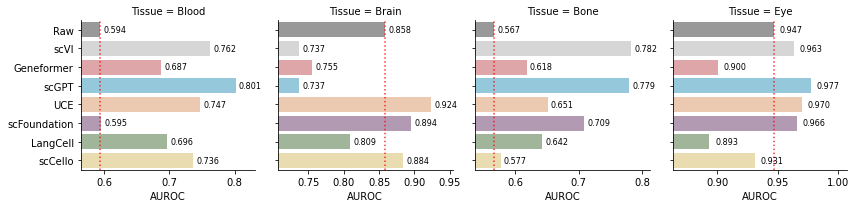

In [78]:
metric = "AUROC"
grid = sns.FacetGrid(df_all, col="Tissue", sharex=False, sharey=True)
grid.map_dataframe(barplot_with_text, metric=metric) 
grid.set_axis_labels(metric, "")
plt.tight_layout()
plt.savefig(f"../figures/cancer_finder/{metric}_all_absolute_orienth.png", dpi=300, bbox_inches='tight')

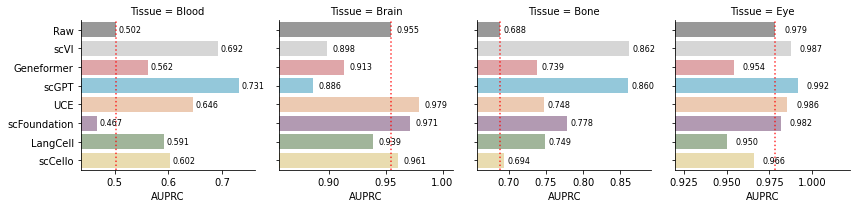

In [79]:
metric = "AUPRC"
grid = sns.FacetGrid(df_all, col="Tissue", sharex=False, sharey=True)
grid.map_dataframe(barplot_with_text, metric=metric) 
grid.set_axis_labels(metric, "")
plt.tight_layout()
plt.savefig(f"../figures/cancer_finder/{metric}_all_absolute_orienth.png", dpi=300, bbox_inches='tight')

### Average performance

In [80]:
mean_df = df_all.set_index("Tissue").groupby(["Model"]).agg("mean").reset_index()
std_df = df_all.set_index("Tissue").groupby(["Model"]).agg("std").reset_index()

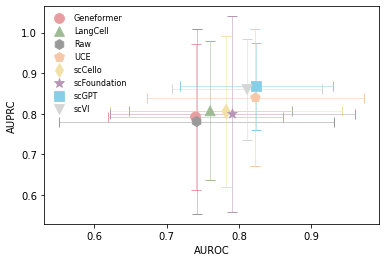

In [83]:
# plot auroc and auprc in a single figure
ax = sns.scatterplot(mean_df, x="AUROC", y="AUPRC", hue="Model", style="Model",
                    palette=custom_palette, markers=custom_shape, s=100, edgecolor=None,
                    zorder=2)
for model in std_df['Model'].unique():
    idx = std_df[std_df['Model'] == model].index[0]
    plt.errorbar(mean_df.loc[idx, 'AUROC'], mean_df.loc[idx, 'AUPRC'], 
                yerr=std_df.loc[idx, 'AUPRC'], 
                xerr=std_df.loc[idx, 'AUROC'], 
                fmt='none', ecolor=custom_palette[model], capsize=5, elinewidth=0.5,
                zorder=1)
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), 
                title=None, frameon=False, fontsize=8) # title_fontsize
plt.savefig("../figures/cancer_finder/auroc_auprc.png", dpi=300, bbox_inches='tight')

In [84]:
keys = mean_df["Model"]
values = mean_df.loc[:, ["AUROC", "AUPRC"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.74015 , 0.791875]), 'LangCell': array([0.76025 , 0.807225]), 'Raw': array([0.741525, 0.78065 ]), 'UCE': array([0.822875, 0.839675]), 'scCello': array([0.7823, 0.8056]), 'scFoundation': array([0.791075, 0.799525]), 'scGPT': array([0.823825, 0.867175]), 'scVI': array([0.811225, 0.85975 ])}
Front 1: ['scGPT']
Front 2: ['UCE', 'scVI']
Front 3: ['LangCell', 'scCello', 'scFoundation']
Front 4: ['Geneformer', 'Raw']


In [86]:
for tissue in df_all["Tissue"].unique():
    df = df_all[df_all["Tissue"]==tissue]
    keys = df["Model"]
    values = df.loc[:, ["AUROC", "AUPRC"]].values
    population = {k:v for k,v in zip(keys, values)}
    print(f"========== {tissue} ==========")
    fronts = non_dominated_sort(population)
    for i, front in enumerate(fronts):
        print(f"Front {i + 1}: {front}")

========== Blood ==========
Front 1: ['scGPT']
Front 2: ['scVI']
Front 3: ['UCE']
Front 4: ['scCello']
Front 5: ['LangCell']
Front 6: ['Geneformer']
Front 7: ['Raw', 'scFoundation']
========== Brain ==========
Front 1: ['UCE']
Front 2: ['scFoundation']
Front 3: ['scCello']
Front 4: ['Raw']
Front 5: ['LangCell']
Front 6: ['Geneformer']
Front 7: ['scVI']
Front 8: ['scGPT']
========== Bone ==========
Front 1: ['scVI']
Front 2: ['scGPT']
Front 3: ['scFoundation']
Front 4: ['UCE', 'LangCell']
Front 5: ['Geneformer']
Front 6: ['scCello']
Front 7: ['Raw']
========== Eye ==========
Front 1: ['scGPT']
Front 2: ['scVI', 'UCE']
Front 3: ['scFoundation']
Front 4: ['Raw']
Front 5: ['scCello']
Front 6: ['Geneformer']
Front 7: ['LangCell']


## Roughness index (lower is better)

In [134]:
adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue}.h5ad")
print(adata[adata.obs["label"]==1].shape)
print(adata[adata.obs["label"]==0].shape)

(79105, 23699)
(24598, 23699)


In [151]:
def stratified_sample(adata, n_samples, random_state=42):
    """
    从adata.obs中 label==label_val 的细胞里，
    按照 Cluster 占比进行 stratified 采样，返回 index 列表。
    """
    np.random.seed(random_state)
    df = adata.obs
    clusters = df["Cluster"].value_counts(normalize=True) 
    sample_indices = []

    for cluster, prop in clusters.items():
        n_cluster = int(round(prop * n_samples))
        idx_cluster = df[df["Cluster"] == cluster].index
        n_cluster = min(n_cluster, len(idx_cluster)) 
        sampled_idx = np.random.choice(idx_cluster, n_cluster, replace=False)
        sample_indices.extend(sampled_idx)

    if len(sample_indices) < n_samples:
        remaining = df.index.difference(sample_indices)
        extra = np.random.choice(remaining, n_samples - len(sample_indices), replace=False)
        sample_indices.extend(extra)
    if len(sample_indices) > n_samples:
        sample_indices = np.random.choice(sample_indices, n_samples, replace=False)
    return np.array(sample_indices)

def stratified_sample_with_label(adata, n_samples, random_state=42):
    """
    按照 label 占比和 Cluster 占比 stratified 采样。

    Parameters
    ----------
    adata : AnnData
        输入 AnnData。
    n_samples : int
        总共需要采样的细胞数。
    random_state : int
        随机种子。

    Returns
    -------
    np.ndarray
        采样得到的 obs 索引数组。
    """
    np.random.seed(random_state)
    df = adata.obs
    sample_indices = []

    # 1️⃣ label 的占比
    label_props = df["label"].value_counts(normalize=True)

    for label_val, label_prop in label_props.items():
        n_label_samples = int(round(label_prop * n_samples))
        df_label = df[df["label"] == label_val]

        # 2️⃣ 在当前 label 内部按 cluster 占比
        cluster_props = df_label["Cluster"].value_counts(normalize=True)

        for cluster, cluster_prop in cluster_props.items():
            n_cluster_samples = int(round(cluster_prop * n_label_samples))
            idx_cluster = df_label[df_label["Cluster"] == cluster].index

            # 防止超过该 cluster 实际可用数量
            n_cluster_samples = min(n_cluster_samples, len(idx_cluster))

            sampled_idx = np.random.choice(idx_cluster, n_cluster_samples, replace=False)
            sample_indices.extend(sampled_idx)

    # 3️⃣ 如果总数不足，补充剩余的
    if len(sample_indices) < n_samples:
        remaining = df.index.difference(sample_indices)
        extra = np.random.choice(remaining, n_samples - len(sample_indices), replace=False)
        sample_indices.extend(extra)

    return np.array(sample_indices)

In [ ]:
rogi_df = pd.DataFrame()
rogi_df["model"] = model_list

# sample data for each tissue
adata_subset_all = {}
for tissue in tissue_list:
    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue}.h5ad")
    sample_pos = stratified_sample(adata[adata.obs["label"]==1], 1000, random_state=42)
    sample_neg = stratified_sample(adata[adata.obs["label"]==0], 1000, random_state=42)
    adata_subset_all[tissue] = adata[adata.obs.index.isin(np.concatenate([sample_neg, sample_pos]))]

    # sample_idx = stratified_sample_with_label(adata, 2000)
    # adata_subset_all[tissue] = adata[adata.obs.index.isin(sample_idx)]

# calculate ROGI score
for (tissue1, tissue2) in list(itertools.combinations(tissue_list, 2)):
    print(f"Calculating ROGI for the combination of: {tissue1} + {tissue2}")
    rogi_ls = []
    adata_subset = adata_subset_all[tissue1].concatenate(adata_subset_all[tissue2])
    print(adata_subset.X.shape)

    for model in model_list:
        if model == "X":
            ri = RoughnessIndex(X=adata_subset.X.toarray(), Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        else:
            ri = RoughnessIndex(X=adata_subset.obsm[model], Y=adata_subset.obs['label'], metric='euclidean', verbose=False)        
        rogi = ri.compute_index(min_dt=0.01)
        rogi_ls.append(rogi)
    rogi_df[f"{tissue1}_{tissue2}"] = rogi_ls

Calculating ROGI for the combination of: Blood + Brain
(4000, 10112)


/home/wujialu/.conda/envs/singlecell/lib/python3.8/site-packages/anndata/_core/anndata.py:1763: FutureWarning: The AnnData.concatenate method is deprecated in favour of the anndata.concat function. Please use anndata.concat instead.

See the tutorial for concat at: https://anndata.readthedocs.io/en/latest/concatenation.html


In [ ]:
for tissue in tissue_list:
    rogi_df[tissue] = rogi_df.loc[:, [col for col in rogi_df.columns if tissue in col]].mean(1)
rogi_df = rogi_df.loc[:, ["model"] + tissue_list]
rogi_df

,Blood,Brain,Bone,Eye
0,0.769368,0.763089,0.785527,0.763693
1,0.720668,0.704147,0.729761,0.704656
2,0.793868,0.792389,0.796419,0.778780
3,0.735643,0.736324,0.732114,0.701205
4,0.768456,0.762493,0.717643,0.694486
5,0.740671,0.750166,0.753322,0.744105
6,0.765582,0.729799,0.778074,0.728315
7,0.711930,0.717647,0.740768,0.698311


In [162]:
# rogi_df.to_csv("../figures/cancer_finder/cancer_finder_rogi_pairwise_stratified.csv", index=False)
rogi_df = pd.read_csv("../figures/cancer_finder/cancer_finder_rogi_pairwise_stratified.csv", usecols=["model"]+tissue_list)
rogi_df["model"] = rogi_df["model"].apply(lambda x: model_map_dict.get(x, x))
rogi_df = rogi_df.set_index("model")
rogi_df

,Blood,Brain,Bone,Eye
model,,,,
Raw,0.738309,0.760143,0.784403,0.728439
scVI,0.710396,0.705034,0.719453,0.700959
Geneformer,0.794733,0.790835,0.803504,0.780815
scGPT,0.701619,0.740124,0.706676,0.669479
UCE,0.702201,0.738596,0.762893,0.679211
scFoundation,0.734305,0.734242,0.767732,0.741744
LangCell,0.743446,0.716324,0.770031,0.730773
scCello,0.765587,0.761451,0.785578,0.750340


0.7383086660746278 0.5 1.5
0.7601425182466456 1.5 2.5
0.7844030904133273 2.5 3.5
0.7284391404108383 3.5 4.5


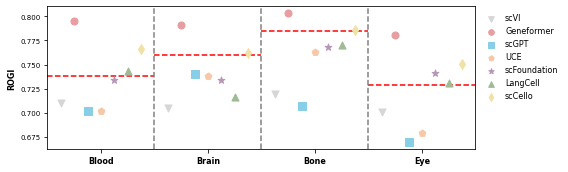

In [163]:
plt.figure(figsize=(8,2.5))
x = np.arange(1,5)
x_line = np.array([0.5, 1.5, 2.5, 3.5, 4.5])
plt.xlim(0.5, 4.5)
# plt.ylim(0.4, 0.9)
width = 1/len(model_list)
for i, model_name in enumerate(model_list):
    model_name = model_map_dict.get(model_name, model_name)
    x_pos = x_line[:-1] + i * width
    y = rogi_df.loc[model_name, :]
    # print(x_pos)

    if model_name == "Raw":
        x_min = x_line[:-1]
        x_max = x_line[1:]
        xlim = plt.gca().get_xlim()
        for y_, x_min_, x_max_ in zip(y, x_min, x_max):
            print(y_, x_min_, x_max_)
            x_min_ = (x_min_ - xlim[0]) / (xlim[1] - xlim[0])
            x_max_ = (x_max_ - xlim[0]) / (xlim[1] - xlim[0])
            plt.axhline(y=y_, xmin=x_min_, xmax=x_max_, ls="--", color="red", zorder=1)
    else:
        plt.scatter(x_pos, y, s=50, color=custom_palette[model_name], alpha=1, label=model_name, zorder=2,
            marker=custom_shape[model_name])
        
plt.legend(fontsize=6, markerscale=0.8)
for x in x_line[1:-1]:
    plt.axvline(x=x, ls="--", color="grey")   
plt.ylabel("ROGI", fontsize=8, fontweight="bold")
plt.yticks(fontsize=7)
plt.xticks(ticks=[1,2,3,4], labels=rogi_df.columns, fontsize=8, fontweight="bold")
plt.legend(fontsize=8, markerscale=0.8, loc="upper left", bbox_to_anchor=(1,1), frameon=False)
plt.tight_layout()
# plt.savefig("../figures/cancer_finder/tissue_rogi.png", dpi=300)

### Correlation of ROGI and model performance

In [164]:
x = df_all.groupby("Model")[["AUROC", "AUPRC"]].agg("mean").reset_index()
x = x.set_index("Model")
x

,AUROC,AUPRC
Model,,
Geneformer,0.740150,0.791875
LangCell,0.760250,0.807225
Raw,0.741525,0.780650
UCE,0.822875,0.839675
scCello,0.782300,0.805600
scFoundation,0.791075,0.799525
scGPT,0.823825,0.867175
scVI,0.811225,0.859750


In [165]:
y = rogi_df.mean(1).to_frame("ROGI")
y

,ROGI
model,
Raw,0.752823
scVI,0.708960
Geneformer,0.792472
scGPT,0.704475
UCE,0.720725
scFoundation,0.744506
LangCell,0.740143
scCello,0.765739


In [166]:
df = pd.merge(x, y, left_index=True, right_index=True)
df

,AUROC,AUPRC,ROGI
Geneformer,0.740150,0.791875,0.792472
LangCell,0.760250,0.807225,0.740143
Raw,0.741525,0.780650,0.752823
UCE,0.822875,0.839675,0.720725
scCello,0.782300,0.805600,0.765739
scFoundation,0.791075,0.799525,0.744506
scGPT,0.823825,0.867175,0.704475
scVI,0.811225,0.859750,0.708960


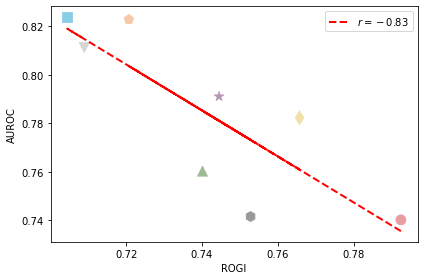

In [167]:
df_plot = df.copy()
df_plot["Model"] = df.index
r, p_value = pearsonr(df["AUROC"], df["ROGI"])
ax = sns.scatterplot(df_plot, x="ROGI", y="AUROC", hue="Model", style="Model", s=100,
                     markers=custom_shape, palette=custom_palette,
                     edgecolor=None, legend=None)
coef = np.polyfit(df["ROGI"], df["AUROC"], 1)
poly = np.poly1d(coef)
ax.plot(df["ROGI"], poly(df["ROGI"]), linestyle="--", color="red", linewidth=2, label=f"$r = {r:.2f}$")
plt.legend()
plt.tight_layout()
# plt.savefig("../figures/cancer_finder/auroc_rogi_regplot.png", dpi=300, bbox_inches="tight")

In [147]:
df.corr()

,AUROC,AUPRC,ROGI
AUROC,1.000000,0.880999,-0.704434
AUPRC,0.880999,1.000000,-0.484014
ROGI,-0.704434,-0.484014,1.000000


In [148]:
df.corr(method="spearman")

,AUROC,AUPRC,ROGI
AUROC,1.000000,0.857143,-0.52381
AUPRC,0.857143,1.000000,-0.50000
ROGI,-0.523810,-0.500000,1.00000


In [149]:
pearsonr(df["AUROC"], df["ROGI"])

PearsonRResult(statistic=-0.7044337485536603, pvalue=0.05108773185486575)

In [150]:
pearsonr(df["AUPRC"], df["ROGI"])

PearsonRResult(statistic=-0.4840136125658021, pvalue=0.22424994311673085)

## UMAP visualization

In [ ]:
tissue_list = ['Blood', 'Brain', 'Bone', 'Eye']
tissue_list

['Blood', 'Brain', 'Bone', 'Eye']

In [ ]:
adata_list = []
for i, tissue in enumerate(tissue_list):
    adata = sc.read_h5ad(f"{output_folder}/TISCH/{tissue}.h5ad")
    adata.obs["Tissue"] = tissue
    adata_list.append(adata)
adata_all = ad.concat(adata_list, join='outer')

In [ ]:
adata_all.obs["Tissue"]

Cell
AML328-D113_ATTAAGCATTTC                 Blood
AML328-D113_GAAATGCCCCAT                 Blood
AML328-D113_GGGTGGCGAAAC                 Blood
AML328-D113_TAACTAAGCTAC                 Blood
AML328-D113_TCGTTAGTTATT                 Blood
                                         ...  
GSM4147100_UMM067L@TCGCGTTGTGTTAAGA-1      Eye
GSM4147100_UMM067L@TCTGGAACATTAACCG-1      Eye
GSM4147100_UMM067L@TGAGCATAGCGTGAAC-1      Eye
GSM4147100_UMM067L@TTAGGACCAAAGTCAA-1      Eye
GSM4147100_UMM067L@TTCCCAGAGTCAATAG-1      Eye
Name: Tissue, Length: 267390, dtype: object

In [ ]:
model = "scVI_integrated"
sc.pp.neighbors(adata_all, use_rep=model)
sc.tl.umap(adata_all)
fig = sc.pl.umap(adata_all, color=['Celltype (malignancy)', 'Tissue'], wspace=0.3, return_fig=True)
fig.savefig(f"../figures/cancer_finder/{model}_umap.png", dpi=300, bbox_inches='tight')

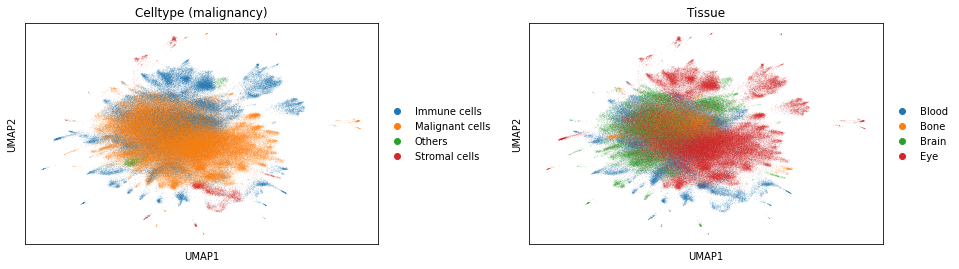

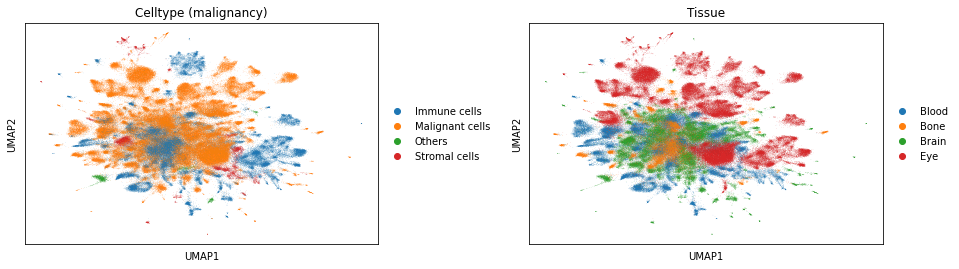

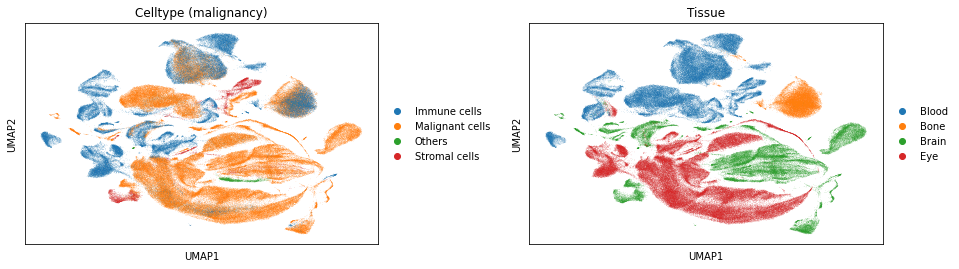

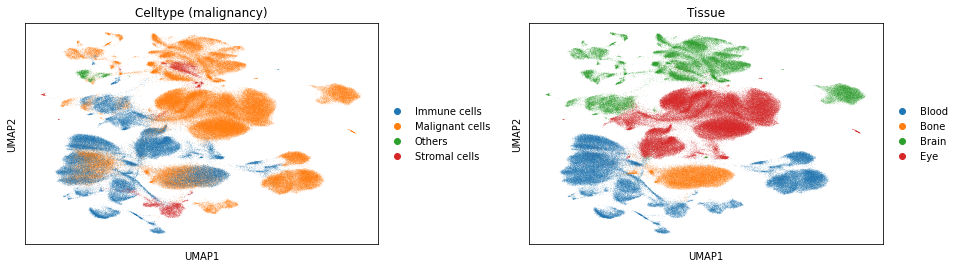

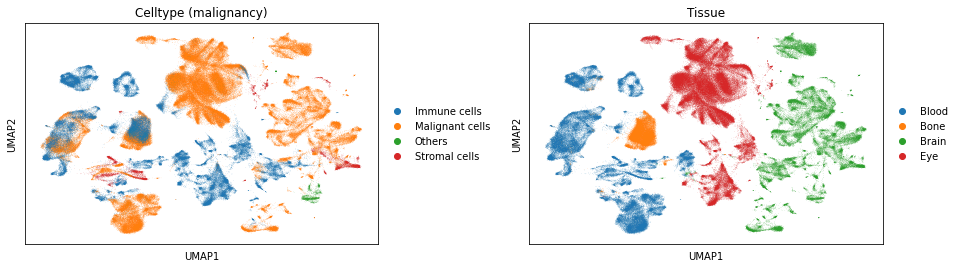

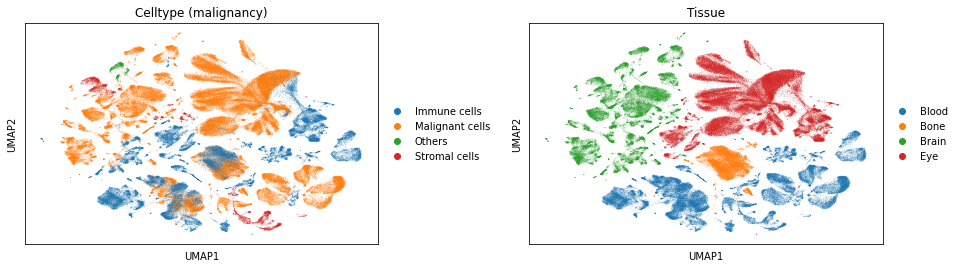

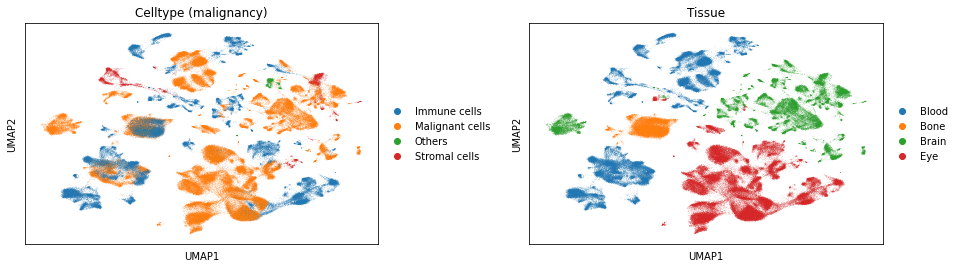

In [ ]:
for model in model_list[1:]:
    sc.pp.neighbors(adata_all, use_rep=model)
    sc.tl.umap(adata_all)
    fig = sc.pl.umap(adata_all, color=['Celltype (malignancy)', 'Tissue'], wspace=0.3, return_fig=True)
    fig.savefig(f"../figures/cancer_finder/{model}_umap.png", dpi=300, bbox_inches='tight')

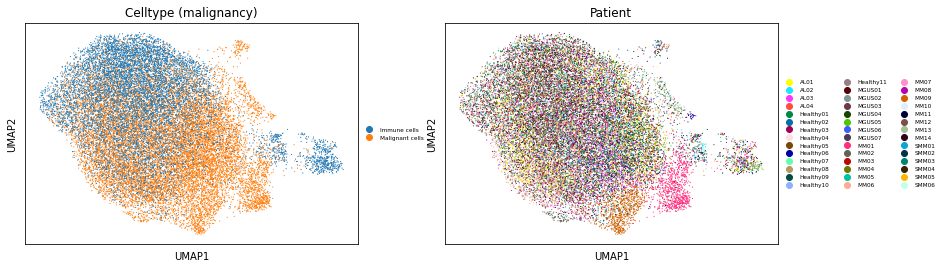

In [ ]:
sc.pp.neighbors(adata, use_rep='scGPT')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

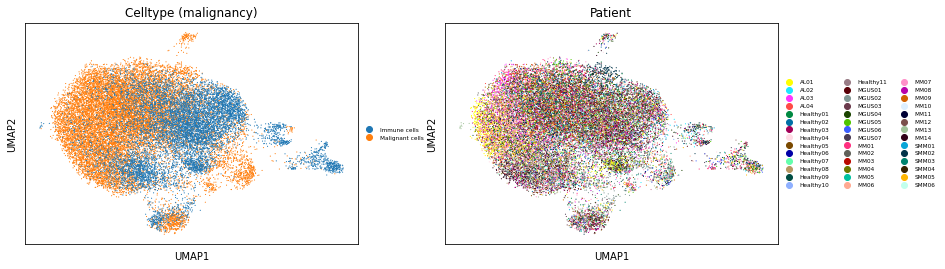

In [ ]:
sc.pp.neighbors(adata, use_rep='scVI')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

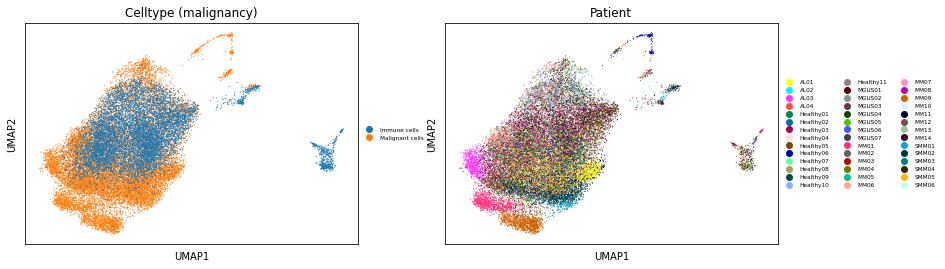

In [ ]:
sc.pp.neighbors(adata, use_rep='UCE')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['Celltype (malignancy)', 'Patient'],legend_fontsize ='xx-small',size=5,legend_fontweight='light')

# Drug sensitivity

In [ ]:
result = pd.read_csv("../figures/drug_sensitivity/drug_sensitivity.csv", delimiter="\t")
result.head()

,Drug,AUROC,AUPRC,Model
0,Sorafenib,0.8400,0.8400,scFoundation
1,NVP-TAE684,0.8400,0.8737,scFoundation
2,PLX4720_451Lu,0.6600,0.6755,scFoundation
3,Etoposide,0.6800,0.6227,scFoundation
4,Sorafenib,0.7819,0.7393,scGPT


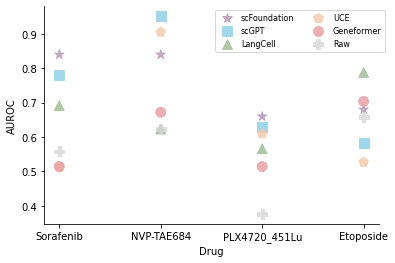

In [ ]:
# sns.stripplot(result, x="Drug", y="AUROC", hue="Model", s=10, 
#               palette=custom_palette)
sns.scatterplot(result, x="Drug", y="AUROC", style="Model", hue="Model", s=100, 
                palette=custom_palette, markers=custom_shape, alpha=0.8, edgecolor=None)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
# ax.legend(loc="upper left", ncol=3, title="Model", frameon=True, bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", ncol=2, fontsize=8, bbox_to_anchor=(0.5, 1))
plt.savefig("../figures/drug_sensitivity/drug_auroc_1105.png", dpi=300, bbox_inches='tight')

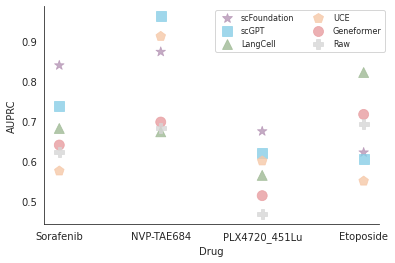

In [ ]:
sns.set_style('white')
sns.scatterplot(result, x="Drug", y="AUPRC", style="Model", hue="Model", s=100, 
                palette=custom_palette, markers=custom_shape, alpha=0.8, edgecolor=None)
sns.despine(top=True, right=True, left=False, bottom=False)
ax = plt.gca()
# ax.legend(loc="upper left", ncol=1, title="Model", frameon=True, bbox_to_anchor=(1, 0.8))
ax.legend(loc="upper left", ncol=2, fontsize=8, bbox_to_anchor=(0.5, 1))
plt.savefig("../figures/drug_sensitivity/drug_auprc_1105.png", dpi=300, bbox_inches='tight')

## Roughness index (lower is better)

In [ ]:
rogi_result = []
drug_ls = ["Sorafenib", "Etoposide", "NVP-TAE684", "PLX4720_451Lu"]
model_ls = ["geneformer", "scgpt", "uce", "xTrimoGene", "langcell", "Raw"]
for drug in drug_ls:
    for model in model_ls:
        folder = f"./xTrimoGene/SCAD/data_allen/{drug}/{model}/stratified_emb/before_training"
        for split_id in range(1,6):
            bulk_train_X = pd.read_csv(os.path.join(folder, "source_5_folds", f"split{split_id}", "X_train_source.tsv"), delimiter="\t", index_col=0)
            bulk_train_Y = pd.read_csv(os.path.join(folder, "source_5_folds", f"split{split_id}", "Y_train_source.tsv"), delimiter="\t", index_col=0)
            sc_train_X = pd.read_csv(os.path.join(folder, "target_5_folds", f"split{split_id}", "X_train_target.tsv"), delimiter="\t", index_col=0)
            sc_train_Y = pd.read_csv(os.path.join(folder, "target_5_folds", f"split{split_id}", "Y_train_target.tsv"), delimiter="\t", index_col=0)
            
            ri = RoughnessIndex(X=bulk_train_X, Y=bulk_train_Y, metric='euclidean', verbose=False)        
            rogi_bulk = ri.compute_index(min_dt=0.01)
            ri = RoughnessIndex(X=sc_train_X, Y=sc_train_Y, metric='euclidean', verbose=False)        
            rogi_sc = ri.compute_index(min_dt=0.01)            
            ri = RoughnessIndex(X=pd.concat([sc_train_X, bulk_train_X]) , Y=pd.concat([sc_train_Y, bulk_train_Y]), metric='euclidean', verbose=False)        
            rogi_all = ri.compute_index(min_dt=0.01)

            rogi_result.append(
                {"drug": drug,
                 "model": model_map_dict.get(model, model),
                 "split": split_id,
                 "ROGI(Bulk)": rogi_bulk,
                 "ROGI(Single-cell)": rogi_sc,
                 "ROGI(Combined)": rogi_all}
            )

In [ ]:
# rogi_df = pd.DataFrame.from_dict(rogi_result)
# rogi_df.to_csv("../figures/drug_sensitivity/cancer_finder_rogi.csv", index=False)
rogi_df = pd.read_csv("../figures/drug_sensitivity/cancer_finder_rogi.csv")
rogi_df_grouped = rogi_df.groupby(["drug", "model"]).agg("mean").reset_index()
rogi_df_grouped

,drug,model,split,ROGI(Bulk),ROGI(Single-cell),ROGI(Combined)
0,Etoposide,Geneformer,3.0,0.3883,0.7491,0.6674
1,Etoposide,LangCell,3.0,0.3767,0.7316,0.6899
2,Etoposide,Raw,3.0,0.3869,0.8448,0.8417
3,Etoposide,UCE,3.0,0.3799,0.7579,0.7205
4,Etoposide,scFoundation,3.0,0.3823,0.7114,0.6605
5,Etoposide,scGPT,3.0,0.3776,0.7564,0.7153
6,NVP-TAE684,Geneformer,3.0,0.4595,0.7121,0.5473
7,NVP-TAE684,LangCell,3.0,0.4463,0.6398,0.5567
8,NVP-TAE684,Raw,3.0,0.4562,0.7251,0.6230
9,NVP-TAE684,UCE,3.0,0.4472,0.6514,0.5555


0.6898963007229952 0.5 1.5
0.5567450531616973 1.5 2.5
0.55248997753356 2.5 3.5
0.5384555114759948 3.5 4.5


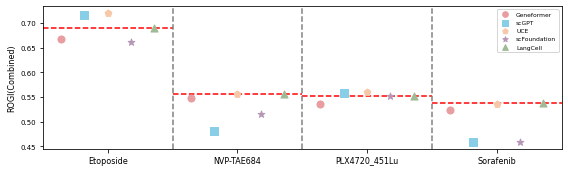

In [ ]:
plt.figure(figsize=(8,2.5))
x = np.arange(1,5)
x_line = [0.5, 1.5, 2.5, 3.5, 4.5]
plt.xlim(0.5, 4.5)
width = 0.18
for i, model_name in enumerate(model_order_scFM+["Raw"]):
    if model_name == "Raw":
        x_min = x_line[:-1]
        x_max = x_line[1:]
        xlim = plt.gca().get_xlim()
        for y_, x_min_, x_max_ in zip(y, x_min, x_max):
            print(y_, x_min_, x_max_)
            x_min_ = (x_min_ - xlim[0]) / (xlim[1] - xlim[0])
            x_max_ = (x_max_ - xlim[0]) / (xlim[1] - xlim[0])
            plt.axhline(y=y_, xmin=x_min_, xmax=x_max_, ls="--", color="red",zorder=1)
    else:
        x_pos = x + i * width - 2 * width  # Adjust x position for each dataset
        y = rogi_df_grouped[rogi_df_grouped["model"]==model_name]["ROGI(Combined)"].tolist()
        # print(x_pos, y)
        plt.scatter(x_pos, y, s=50, color=custom_palette[model_name], alpha=1, label=model_name, zorder=2,
                    marker=custom_shape[model_name])

plt.legend(fontsize=6, markerscale=0.8)
for x in x_line[1:-1]:
    plt.axvline(x=x, ls="--", color="grey")   
plt.ylabel("ROGI(Combined)", fontsize=8)
plt.yticks(fontsize=7)
plt.xticks(ticks=[1,2,3,4], labels=rogi_df_grouped["drug"].unique(), fontsize=8)
plt.tight_layout()
plt.savefig("../figures/drug_sensitivity/drug_rogi.png", dpi=300)

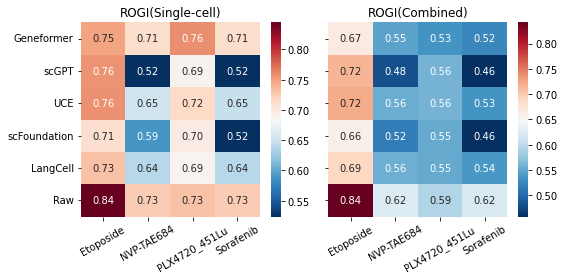

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=False)
for i, col in enumerate(["ROGI(Single-cell)", "ROGI(Combined)"]):
    heatmap_df = rogi_df_grouped.pivot(index="model", columns="drug", values=col)
    # heatmap_df.sort_index()
    # Map the sort order to a dictionary for use as a key
    sort_key = {value: idx for idx, value in enumerate(model_order_scFM+["Raw"])}
    # Sort the DataFrame
    sorted_df = heatmap_df.sort_index(key=lambda x: x.map(sort_key))
    sns.heatmap(sorted_df, annot=True, fmt=".2f", cmap="RdBu_r", ax=axes[i])
    axes[i].set_ylabel("")
    axes[i].set_xlabel("")
    axes[i].set_title(col)
    xticklabels = axes[i].get_xticklabels()
    axes[i].set_xticklabels(xticklabels, rotation=30)
    if i > 0:
        axes[i].set_yticklabels("")
plt.tight_layout()
# plt.savefig("figures/drug_sensitivity/drug_rogi_heatmap.png", dpi=300)

### Correlation of ROGI and model performance

In [ ]:
x = result.groupby("Model")[["AUROC", "AUPRC"]].agg("mean").reset_index()
x = x.set_index("Model")
x

,AUROC,AUPRC
Model,,
Geneformer,0.601125,0.643050
LangCell,0.667350,0.686075
Raw,0.554175,0.617675
UCE,0.638600,0.660425
scFoundation,0.755000,0.752975
scGPT,0.736525,0.732425


In [ ]:
y = rogi_df_grouped.groupby("model")[["ROGI(Combined)"]].agg("mean").reset_index()
y = y.set_index("model")
y

,ROGI(Combined)
model,
Geneformer,0.568500
LangCell,0.584397
Raw,0.668955
UCE,0.592523
scFoundation,0.546730
scGPT,0.553412


In [ ]:
df = pd.merge(x, y, left_index=True, right_index=True)
df

,AUROC,AUPRC,ROGI(Combined)
Model,,,
Geneformer,0.601125,0.643050,0.568500
LangCell,0.667350,0.686075,0.584397
Raw,0.554175,0.617675,0.668955
UCE,0.638600,0.660425,0.592523
scFoundation,0.755000,0.752975,0.546730
scGPT,0.736525,0.732425,0.553412


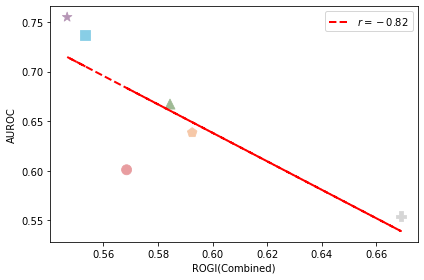

In [ ]:
df_plot = df.copy()
df_plot["Model"] = df.index
r, p_value = pearsonr(df["AUROC"], df["ROGI(Combined)"])
ax = sns.scatterplot(df_plot, x="ROGI(Combined)", y="AUROC", hue="Model", style="Model", s=100,
                     markers=custom_shape, palette=custom_palette,
                     edgecolor=None, legend=None)
coef = np.polyfit(df["ROGI(Combined)"], df["AUROC"], 1)
poly = np.poly1d(coef)
ax.plot(df["ROGI(Combined)"], poly(df["ROGI(Combined)"]), linestyle="--", color="red", linewidth=2, label=f"$r = {r:.2f}$")
plt.legend()
plt.tight_layout()
plt.savefig("../figures/drug_sensitivity/auroc_rogi_regplot.png", dpi=300, bbox_inches="tight")

In [ ]:
# w/o pvalue
df.corr()

,AUROC,AUPRC,ROGI(Combined)
AUROC,1.000000,0.994668,-0.821632
AUPRC,0.994668,1.000000,-0.794775
ROGI(Combined),-0.821632,-0.794775,1.000000


In [ ]:
pearsonr(df["AUROC"], df["ROGI(Combined)"])

PearsonRResult(statistic=-0.8216319009808691, pvalue=0.04488536164495736)

In [ ]:
spearmanr(df["AUROC"], df["ROGI(Combined)"])

SignificanceResult(statistic=-0.8285714285714287, pvalue=0.04156268221574334)

In [ ]:
pearsonr(df["AUPRC"], df["ROGI(Combined)"])

PearsonRResult(statistic=-0.7947749112472168, pvalue=0.05885423846295497)

In [ ]:
spearmanr(df["AUPRC"], df["ROGI(Combined)"])

SignificanceResult(statistic=-0.8285714285714287, pvalue=0.04156268221574334)

In [ ]:
for drug in drug_ls:
    x = result[result["Drug"]==drug].sort_values(by="Model", key=lambda x: x.map(sort_key))["AUROC"]
    y = rogi_df_grouped[rogi_df_grouped["drug"]==drug].sort_values(by="model", key=lambda x: x.map(sort_key))["ROGI(Combined)"]
    print(x, y)
    pearsonr_coeff = pearsonr(x, y)
    spearmanr_coeff = spearmanr(x, y)
    print(pearsonr_coeff, spearmanr_coeff)

16    0.5142
4     0.7819
12    0.5125
0     0.8400
8     0.6917
20    0.5583
Name: AUROC, dtype: float64 18    0.524464
23    0.458141
21    0.534873
22    0.458141
19    0.538456
20    0.619015
Name: ROGI(Combined), dtype: float64
PearsonRResult(statistic=-0.7238391705811674, pvalue=0.10386652983458669) SignificanceResult(statistic=-0.5217939320872036, pvalue=0.28834323380039373)
19    0.7039
7     0.5842
15    0.5270
3     0.6800
11    0.7880
23    0.6587
Name: AUROC, dtype: float64 0    0.667449
5    0.715260
3    0.720495
4    0.660534
1    0.689896
2    0.841656
Name: ROGI(Combined), dtype: float64
PearsonRResult(statistic=-0.23994521706554378, pvalue=0.6469894422364861) SignificanceResult(statistic=-0.6, pvalue=0.20799999999999982)
17    0.6722
5     0.9514
13    0.9056
1     0.8400
9     0.6236
21    0.6236
Name: AUROC, dtype: float64 6     0.547262
11    0.481668
9     0.555489
10    0.515925
7     0.556745
8     0.622989
Name: ROGI(Combined), dtype: float64
PearsonRResult(sta

## Average performance

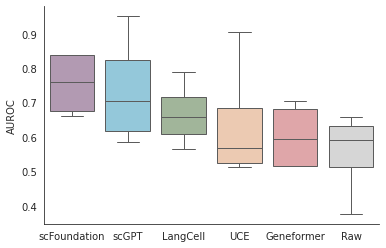

In [ ]:
sns.boxplot(result, x="Model", y="AUROC", hue="Model", palette=custom_palette, width=0.8)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.xlabel("")
plt.savefig("figures/drug_sensitivity/average_auroc.png", dpi=300, bbox_inches='tight')

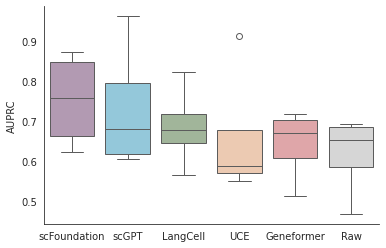

In [ ]:
sns.boxplot(result, x="Model", y="AUPRC", hue="Model", palette=custom_palette, width=0.8)
sns.despine(top=True, right=True, left=False, bottom=False)
plt.xlabel("")
plt.savefig("figures/drug_sensitivity/average_auprc.png", dpi=300, bbox_inches='tight')

In [ ]:
mean_df = result.set_index("Drug").groupby(["Model"]).agg("mean").reset_index()
std_df = result.set_index("Drug").groupby(["Model"]).agg("std").reset_index()

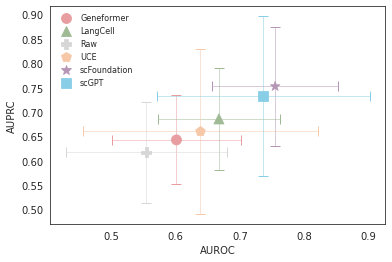

In [ ]:
# plot auroc and auprc in a single figure
ax = sns.scatterplot(mean_df, x="AUROC", y="AUPRC", hue="Model", style="Model",
                    palette=custom_palette, markers=custom_shape, s=100, edgecolor=None,
                    zorder=2)
for model in std_df['Model'].unique():
    idx = std_df[std_df['Model'] == model].index[0]
    plt.errorbar(mean_df.loc[idx, 'AUROC'], mean_df.loc[idx, 'AUPRC'], 
                yerr=std_df.loc[idx, 'AUPRC'], 
                xerr=std_df.loc[idx, 'AUROC'], 
                fmt='none', ecolor=custom_palette[model], capsize=5, elinewidth=0.5,
                zorder=1)
sns.move_legend(ax, "upper left", bbox_to_anchor=(0, 1), 
                title=None, frameon=False, fontsize=8) # title_fontsize
plt.savefig("figures/drug_sensitivity/auroc_auprc.png", dpi=300, bbox_inches='tight')

In [ ]:
keys = mean_df["Model"]
values = mean_df.loc[:, ["AUROC", "AUPRC"]].values
population = {k:v for k,v in zip(keys, values)}
print(population)
fronts = non_dominated_sort(population)
for i, front in enumerate(fronts):
    print(f"Front {i + 1}: {front}")

{'Geneformer': array([0.601125, 0.64305 ]), 'LangCell': array([0.66735 , 0.686075]), 'Raw': array([0.554175, 0.617675]), 'UCE': array([0.6386  , 0.660425]), 'scFoundation': array([0.755   , 0.752975]), 'scGPT': array([0.736525, 0.732425])}
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['LangCell']
Front 4: ['UCE']
Front 5: ['Geneformer']
Front 6: ['Raw']


In [ ]:
for drug in result["Drug"].unique():
    df = result[result["Drug"]==drug]
    keys = df["Model"]
    values = df.loc[:, ["AUROC", "AUPRC"]].values
    population = {k:v for k,v in zip(keys, values)}
    print(f"========== {drug} ==========")
    fronts = non_dominated_sort(population)
    for i, front in enumerate(fronts):
        print(f"Front {i + 1}: {front}")

========== Sorafenib ==========
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['LangCell']
Front 4: ['Geneformer', 'Raw']
Front 5: ['UCE']
========== NVP-TAE684 ==========
Front 1: ['scGPT']
Front 2: ['UCE']
Front 3: ['scFoundation']
Front 4: ['Geneformer']
Front 5: ['Raw']
Front 6: ['LangCell']
========== PLX4720_451Lu ==========
Front 1: ['scFoundation']
Front 2: ['scGPT']
Front 3: ['UCE']
Front 4: ['LangCell']
Front 5: ['Geneformer']
Front 6: ['Raw']
========== Etoposide ==========
Front 1: ['LangCell']
Front 2: ['Geneformer']
Front 3: ['scFoundation', 'Raw']
Front 4: ['scGPT']
Front 5: ['UCE']


# General figures

## Task correlation

In [ ]:
file = "../figures/overall_ranking/funkyheatmap_summary_overall.xlsx"
data = pd.read_excel(file, sheet_name="data").set_index("id")
data

,Overall ranking,Overall ranking_scIB,Overall ranking_scGraph,Overall ranking_annotation,Overall ranking_cancer,Overall ranking_sensitivity
id,,,,,,
Raw,NaN,NaN,NaN,NaN,5.0,5.0
HVG,NaN,1.0,1.0,NaN,NaN,NaN
scVI,NaN,1.0,4.0,3.0,3.0,NaN
scFoundation,1.0,4.0,2.0,2.0,1.0,1.0
UCE,2.0,3.0,1.0,1.0,2.0,4.0
scGPT,3.0,2.0,2.0,5.0,2.0,2.0
LangCell,4.0,5.0,3.0,4.0,4.0,3.0
Geneformer,5.0,6.0,5.0,5.0,6.0,4.0


In [ ]:
task_corr = data.iloc[:, 1:].corr(method="spearman")
task_corr

,Overall ranking_scIB,Overall ranking_scGraph,Overall ranking_annotation,Overall ranking_cancer,Overall ranking_sensitivity
Overall ranking_scIB,1.000000,0.449560,0.260897,0.463817,0.359092
Overall ranking_scGraph,0.449560,1.000000,0.602941,0.808824,0.157895
Overall ranking_annotation,0.260897,0.602941,1.000000,0.573529,-0.026316
Overall ranking_cancer,0.463817,0.808824,0.573529,1.000000,0.750000
Overall ranking_sensitivity,0.359092,0.157895,-0.026316,0.750000,1.000000


<AxesSubplot: >

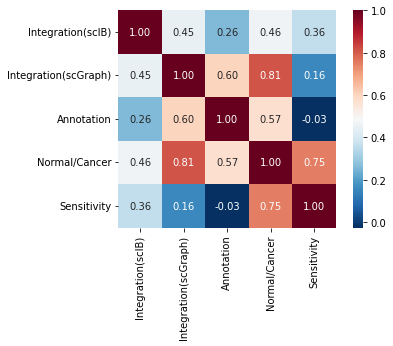

In [ ]:
mask = np.triu(np.ones_like(task_corr, dtype=bool))
ticks = ["Integration(scIB)", "Integration(scGraph)", "Annotation", "Normal/Cancer", "Sensitivity"]
sns.heatmap(task_corr, annot=True, cmap="RdBu_r", fmt='.2f', xticklabels=ticks, yticklabels=ticks, square=True)  
# plt.savefig("figures/overall_ranking/task_spearman_corr.png", dpi=300, bbox_inches="tight")

## Overall ranking

In [ ]:
# python >= 3.10
import funkyheatmappy
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from funkyheatmappy.funkyheatmappy import position_arguments

In [ ]:
file = "../figures/overall_ranking/funkyheatmap_summary_copy.xlsx"
data = pd.read_excel(file, sheet_name="data")
column_info = pd.read_excel(file, sheet_name="column_info")
column_group = pd.read_excel(file, sheet_name="column_group")
palettes = pd.read_excel(file, sheet_name="palettes")

In [ ]:
# data.loc[:, column_info[column_info["geom"]=="circle"].id]
for col in column_info[column_info["geom"]=="circle"].id:
    max_rank = data.loc[:, col].max()
    data[col] = data[col].apply(lambda x : max_rank+1-x)

In [ ]:
data = data.fillna(0)
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8 entries, 0 to 7
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   id                            8 non-null      object 
 1   Overall ranking               8 non-null      float64
 2   Overall ranking_scIB          8 non-null      float64
 3   Overall ranking_scGraph       8 non-null      float64
 4   Overall ranking_annotation    8 non-null      float64
 5   Overall ranking_cancer        8 non-null      float64
 6   Overall ranking_sensitivity   8 non-null      float64
 7   Pancreas_scIB                 8 non-null      float64
 8   Immune_scIB                   8 non-null      float64
 9   HLCA_scIB                     8 non-null      float64
 10  Tabula Sapiens_scIB           8 non-null      float64
 11  HLCA_scGraph                  8 non-null      float64
 12  Tabula Sapiens_scGraph        8 non-null      float64
 13  HLCA_seen

In [ ]:
column_group = column_group.fillna("")
column_group

,level1,level2,group,palette
0,Summary,Aggregated rankings,overall,overall
1,Cell clustering,scIB,scIB,palette1
2,Cell clustering,scGraph,scGraph,palette1
3,Cell type annotation,Seen,seen(intra-dataset),palette2
4,Cell type annotation,Seen\n(transfer),seen(cross-dataset),palette2
5,Cell type annotation,Unseen,unseen,palette2
6,Cancer cell,Per tissue evaluation,cancer,palette3
7,Drug sensitivity,Per drug evaluation,sensitivity,palette4


/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/verify_palettes.py:63: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  palettes = {row[0]: row[1] for _, row in palettes.iterrows()}
/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/calculate_positions.py:267: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  rect_data = pd.concat(
/data2/zhuyiheng/.conda/envs/immunity/lib/python3.10/site-packages/funkyheatmappy/calculate_positions.py:339: FutureWarning: The behavior of DataFrame concatenation with 

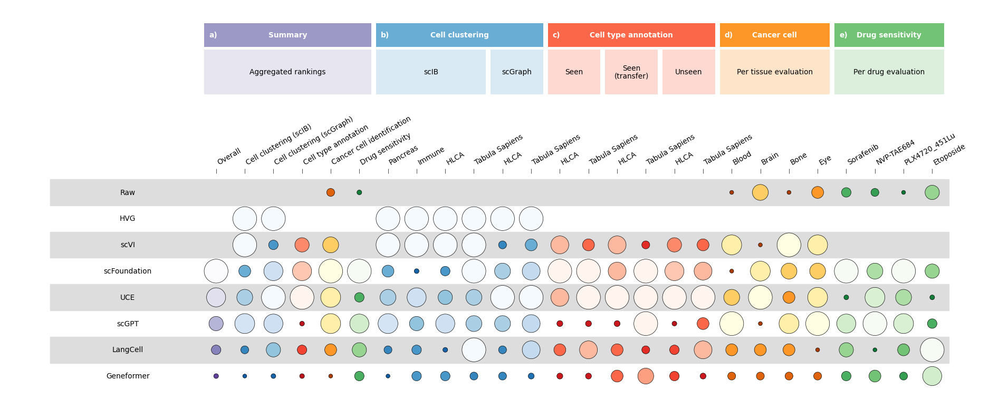

In [ ]:
funkyheatmappy.funky_heatmap(data, column_info=column_info, column_groups=column_group, 
                             position_args=position_arguments(col_bigspace=0.2,col_space=0.2),
                             palettes=palettes)
plt.savefig("../figures/overall_ranking/funkyheatmap_all.png", dpi=300, bbox_inches="tight")

In [ ]:
df = pd.read_csv("../figures/model_data_size.txt",sep="\t")
df.head()

,Model,Model parameters (M),Training data (M)
0,scGPT,50,33.0
1,Geneformer,40,30.0
2,UCE,650,36.0
3,xTrimoGene,100,50.0
4,LangCell,40,27.5


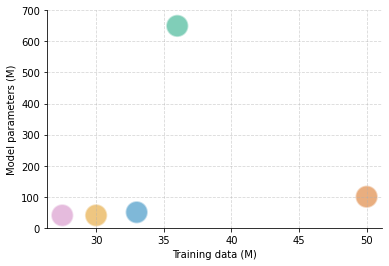

In [ ]:
fig, ax = plt.subplots()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
sns.scatterplot(df, x="Training data (M)", y="Model parameters (M)", s=500, hue="Model", 
                ax=ax, palette="colorblind", alpha=0.5, legend=False)
# ax.tick_params(top=False, labeltop=False, bottom=True, labelbottom=True)
plt.grid(ls="--",alpha=0.5)
plt.ylim(0,700)
plt.savefig("../figures/model_info/model_data_size.png", dpi=300)

## Computational resource

In [ ]:
df = pd.read_csv("../figures/computation_cost.txt",sep="\t")
df.head()

,Model,Total GPU memory (MB),GPU memory (MB),GPU memory (GB),Batch size
0,scVI,NaN,NaN,NaN,1
1,Geneformer,1306.0,982.0,1.0,1
2,scGPT,3680.0,3356.0,3.3,1
3,LangCell,1724.0,1400.0,1.4,1
4,UCE,6760.0,6436.0,6.3,1


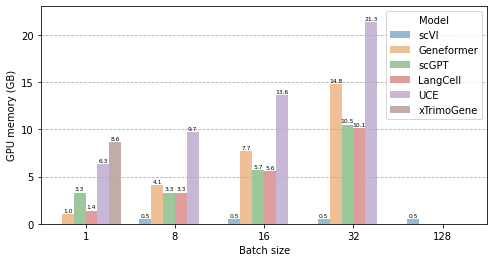

In [ ]:
plt.figure(figsize=(8,4))
ax = sns.barplot(df, x="Batch size", y="GPU memory (GB)", hue="Model", alpha=0.5, width=0.8)
plt.grid(axis="y", ls="--")
for p in ax.patches:
    if p.get_height() > 0:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height()+0.1, 
                f'{p.get_height():.1f}', 
                ha='center', va='bottom', fontdict={"fontsize":6})
ax.set_ylim(0, 23)
plt.savefig("../figures/gpu_memory.png",dpi=300)

In [ ]:
df = pd.read_csv("../figures/computation_time.txt",sep="\t")
df

,Model,Time (s),Batch size
0,scVI,625.6,128
1,Geneformer,556.1,32
2,scGPT,91.7,32
3,LangCell,487.5,32
4,UCE,1889.7,32
5,xTrimoGene,4247.1,1


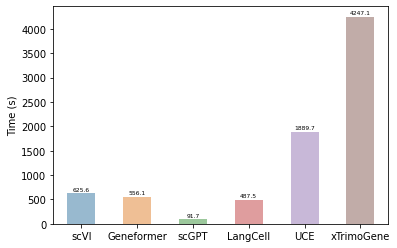

In [ ]:
# plt.figure(figsize=(8,4))
ax = sns.barplot(df, x="Model", y="Time (s)", hue="Model", alpha=0.5, width=0.5, zorder=1)
# plt.grid(axis="x", ls="--", zorder=0)
for p in ax.patches:
    if p.get_height() > 0:
        ax.text(p.get_x() + p.get_width() / 2, p.get_height()+30, 
                f'{p.get_height():.1f}', 
                ha='center', va='bottom', fontdict={"fontsize":6})
ax.set_xlabel("")
plt.savefig("../figures/pancreas_extract_emb_time.png",dpi=300)